In [2]:
## this script uses the JSON file with aninymous user data that can be downlodad from 
## https://dashboard.aurora-h2020.eu/en-GB  (with 'download this snapshot')
## to provide a general analysis of data in each of the 5 demo sites + other EU countries.

In [ ]:
import json
import pandas as pd
import numpy as np

# Opening JSON file
f = open('user-data-backup_users-backup-1710255998215.json')
  
# returns JSON object as 
# a dictionary
data = json.load(f)
  


In [3]:
import openpyxl
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.patches as mpatches
from matplotlib.patches import Circle, Ellipse, Patch
from matplotlib.legend_handler import HandlerPatch
from matplotlib.lines import Line2D


plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')
plt.rcParams['hatch.linewidth'] = 0.2

In [4]:
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)


In [5]:
import matplotlib
from matplotlib import cm
norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
color_list=[cm.jet(norm(j),bytes=True) for j in np.arange(0.2,1,0.1) ]
new_colors=[tuple([i/255.0 for i in j]) for j in color_list]

In [6]:
import json
  
# Opening JSON file
f = open('country_data.json')
  
# returns JSON object as 
# a dictionary
country_data = json.load(f)
  


In [7]:
country_data

[{'countryId': '0abd1233f02c10193fa416f3bccdba097e181f0b728b03334d432eb63452726e',
  'cities': [{'hasPhotovoltaics': True,
    'name': 'Madrid',
    'pvgisParams': {'angle': 30,
     'aspect': -11,
     'investmentFactor': 1.2,
     'lat': 40.376,
     'long': -3.622}}],
  'metrics': [{'electricity': {'default': 0.19},
    'heating': {'biomass': 0.118,
     'coal': 0.354,
     'districtDefault': 0.2652,
     'geothermal': 0.05,
     'liquifiedPetroGas': 0.227,
     'locallyProducedBiomass': 0,
     'naturalGas': 0.202,
     'oil': 0.267,
     'solarThermal': 0.0396,
     'wasteTreatment': 0.5486},
    'transportation': {'alternativeFuelBus': {'almostEmpty': 0.183665,
      'medium': 0.058405,
      'nearlyFull': 0.0347237},
     'bike': {'1': 0},
     'dieselBus': {'almostEmpty': 0.2071009,
      'medium': 0.0658581,
      'nearlyFull': 0.0391546},
     'dieselPassengerTrain': {'almostEmpty': 0.3546,
      'medium': 0.1128,
      'nearlyFull': 0.067},
     'electricBike': {'1': 0.0023}

In [8]:
len(data)

510

In [9]:
## dropping users with unusally high consumption
pd.set_option('display.max_columns', 500)   

to_drop=['GXTS3kX82CXtdS0qHsX3djnB7aj1',
'KU68hUUVhIhRYjViottyV4ARXal1',
'OneDK28UPZeBGWRNrndGSNMaspF2',
'P2rEws5pYKVMy59dlYLwCIJLmpm2',
'TEb4TxP2g7X0usCSJLVVgzWYN8Z2',
'YnLScLYQMgPNyRDj3RiRFaom4eH2',
'h702sviZFDh9Vc7q2Y3LZR9o9KE3',
'hnmWGkAkLjTEAxDRd6CKAnzejtG3',
'iXF4yizraEhxCSDe5248XqWYiZq2',
'jmGIDNjI25TXREjwoj0E51nDfQy2',
'kMinkCzpJaMMnZwEL3XQ4kLTLHg1',
'uw6h1wRVOvbEg4xKW2lx6nFqueA3',
'vJP4AvLeVicdmvtYFhHRkNJOrm53',
'xk0gKqnpdFPKEFUXoWYOHZtlOIH2',
'yUjuXoJfwlWkSkZvS5PMhrtYteC3',
'z1fwVwqgh6h0BrD2mbPsuG3n9Po1',
'zIjpAMidtfXQgLkHdR83I8MGJ1G2',]

In [10]:
for key in to_drop:
    data.pop(key, None)

In [11]:
len(data.keys())

495

In [12]:
## number of users in each country
list_countries=[]
for user in data.keys()  :
    if data[user]['country'] not in list_countries:
            list_countries.append(data[user]['country'] )
            
            
for j in list_countries:
     print(j, len([i for i in list(data.keys()) if data[i]['country']==j]))

sPXh74wjZf14Jtmkaas6 76
4sq82jNQm3x3bH9Fkijm 204
2E9Ejc8qBJC6HnlPPdIh 44
udn3GiM30aqviGBkswpl 34
KhUolhyvcbdEsPyREqOZ 105
8mgi5IR4xn9Yca4zDLtU 32


# SLOVENIA

In [93]:
slovenia_users = [i for i in list(data.keys()) if data[i]['country']=='KhUolhyvcbdEsPyREqOZ']
len(slovenia_users)

105

In [94]:
not any(data[slovenia_users[user]]['consumptionSummaries'])

False

In [95]:
if not any(data[slovenia_users[user]]['consumptionSummaries']):
    print('y')

In [96]:
## slovenia
def Average(lst): 
    return sum(lst) / len(lst) 

slovenia_users = [i for i in list(data.keys()) if data[i]['country']=='KhUolhyvcbdEsPyREqOZ']
len(slovenia_users)


iterables = [
    ['Total'],
    ['carbonEmission_total', 'carbonEmission_label',
    'energyExpended_total', 'energyExpended_label' ,
    ]]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['electricity' , 'heating' ,'transportation'],
    ['carbonEmission_total','carbonEmission_percentage', 'carbonEmission_label', 
    'energyExpended_total','energyExpended_percentage', 'energyExpended_label' ,
    'consumptionDays','consumptionDays_sum', 'householdSize',]]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

iterables = [
    [2022, 2023, 2024],
    [i for i in slovenia_users]]

df_slovenia = pd.DataFrame(index=pd.MultiIndex.from_product(iterables, names=["Year", "User"]), columns=index)
#df_slovenia_2024 = pd.DataFrame(index=[i for i in slovenia_users], columns=index)

for category in  ['electricity' , 'heating' ,'transportation']:  
  for user, user_name in  enumerate(slovenia_users):
    years= len(data[slovenia_users[user]]['consumptionSummaries']) 
        
    if years>0 : 
      for year in range(years):  
         year_name= data[slovenia_users[user]]['consumptionSummaries'][year]['year'] 
         #print(user)
         df_slovenia.loc[(year_name,user_name),('Total','carbonEmission_total')]=data[slovenia_users[user]]['consumptionSummaries'][year]['carbonEmission']['total']
         df_slovenia.loc[(year_name,user_name),('Total','energyExpended_total')]=data[slovenia_users[user]]['consumptionSummaries'][year]['energyExpended']['total']
         try : df_slovenia.loc[(year_name,user_name),('Total','carbonEmission_label')]=data[slovenia_users[user]]['consumptionSummaries'][year]['carbonEmission']['label']
         except:
            continue
         try: df_slovenia.loc[(year_name,user_name),('Total','energyExpended_label')]=data[slovenia_users[user]]['consumptionSummaries'][year]['energyExpended']['label']   
         except:
            continue
            
         temp=data[slovenia_users[user]]['consumptionSummaries'][year]['categories']    
         for i in range(len(temp)):
           if temp[i]['category']==category : #print(temp[i])        
              #print(temp[i]) 
              df_slovenia.loc[ (year_name,user_name),(category,'carbonEmission_total')] = temp[i]['carbonEmission']['total']  
              df_slovenia.loc[ (year_name,user_name),(category,'carbonEmission_percentage')] = temp[i]['carbonEmission']['percentage']
              try  :
                  df_slovenia.loc[(year_name,user_name),(category, 'carbonEmission_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue  
                    
              df_slovenia.loc[(year_name,user_name),(category, 'energyExpended_total')] = temp[i]['energyExpended']['total']               
              df_slovenia.loc[(year_name,user_name),(category, 'energyExpended_percentage')] = temp[i]['energyExpended']['percentage']
              try :
                  df_slovenia.loc[(year_name,user_name),(category, 'energyExpended_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue
                    
              df_slovenia.loc[ (year_name,user_name),(category, 'consumptionDays')] = len(temp[i]['consumptionDays'])
              df_slovenia.loc[ (year_name,user_name),(category,'consumptionDays_sum')] = (
                   sum(temp[i]['consumptionDays'].values()) if  
                  sum(temp[i]['consumptionDays'].values())!=0 else 1)  ##avoid divisio by zero

            
            
              df_slovenia.loc[ (year_name,user_name),(category, 'householdSize')] = 1
                
              if category == 'transportation':
                 try:  

                   householdSize= Average([data[slovenia_users[user]]['consumptions'][i]['transportation']['privateVehicleOccupancy']
                             for i in range(len(data[slovenia_users[user]]['consumptions'])) if
                            'transportation' in data[slovenia_users[user]]['consumptions'][i].keys()
                            and 'privateVehicleOccupancy' in 
                            data[slovenia_users[user]]['consumptions'][i]['transportation'].keys()] )
                   df_slovenia.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize

                 except:
                      continue  
                
              if   category =='heating' or category =='electricity' :
                 #print(slovenia_users[user])
                 try:  
                   householdSize=  Average([data[slovenia_users[user]]['consumptions'][i]['electricity']['householdSize']
                                            for i in range(len(data[slovenia_users[user]]['consumptions'])) if
                       'electricity' in data[slovenia_users[user]]['consumptions'][i].keys()]) 
                   df_slovenia.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                   

                 except:  
                  try:      
                        householdSize=  Average([data[slovenia_users[user]]['consumptions'][i]['heating']['householdSize']
                                            for i in range(len(data[slovenia_users[user]]['consumptions'])) if
                           'heating' in data[slovenia_users[user]]['consumptions'][i].keys()]) 
                        df_slovenia.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                       

                  except:
                      continue  




In [97]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
color_list=[cm.jet(norm(j),bytes=True) for j in np.arange(0.2,1,0.1) ]
new_colors=[tuple([i/255.0 for i in j]) for j in color_list]

In [98]:
new_colors=['royalblue','darkgreen','forestgreen','yellowgreen','gold','orange','orangered','darkred']

electricity : number of data:  69  avergae days tracked:  78.97101449275362
electricity : number of data:  69  avergae days tracked:  78.97101449275362
heating : number of data:  54  avergae days tracked:  98.9074074074074
heating : number of data:  54  avergae days tracked:  98.9074074074074
transportation : number of data:  99  avergae days tracked:  59.95959595959596
transportation : number of data:  99  avergae days tracked:  59.95959595959596


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:74: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.5, 1.0, 'slovenia - Carbon emission labels')

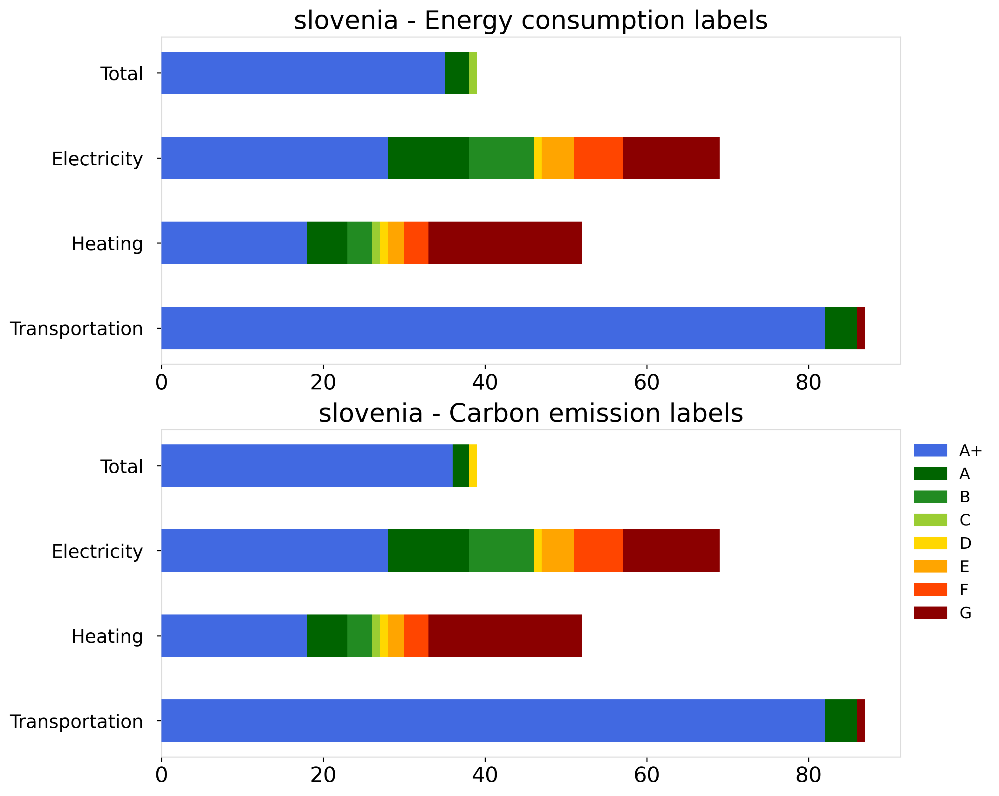

In [99]:
## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(2,1, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']



    
for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_slovenia[sector][df_slovenia[sector, 'energyExpended_label'].notna()] )
      average_days=df_slovenia[sector][df_slovenia[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_slovenia[sector][(df_slovenia[sector]['energyExpended_label'] == label)
                                            & (df_slovenia[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_slovenia[df_slovenia['electricity', 'energyExpended_label'].notna() &
                       df_slovenia['heating', 'energyExpended_label'].notna() &
                       df_slovenia['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[0].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot



   if sector != 'Total' :

      count_e= len(df_slovenia[sector][df_slovenia[sector, 'carbonEmission_label'].notna()] )
      average_days=df_slovenia[sector][df_slovenia[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_slovenia[sector][(df_slovenia[sector]['carbonEmission_label'] == label)
                                            & (df_slovenia[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_slovenia[df_slovenia['electricity', 'carbonEmission_label'].notna() &
                       df_slovenia['heating', 'carbonEmission_label'].notna() &
                       df_slovenia['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[1].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot

    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)


axs[0].set_title('slovenia - Energy consumption labels')
axs[1].set_title('slovenia - Carbon emission labels')



electricity : number of data:  1  avergae days tracked:  365.0
heating : number of data:  2  avergae days tracked:  228.5
transportation : number of data:  1  avergae days tracked:  1.0
electricity : number of data:  57  avergae days tracked:  71.56140350877193
heating : number of data:  41  avergae days tracked:  85.29268292682927
transportation : number of data:  61  avergae days tracked:  60.442622950819676
electricity : number of data:  9  avergae days tracked:  30.444444444444443
heating : number of data:  9  avergae days tracked:  72.88888888888889
transportation : number of data:  37  avergae days tracked:  60.75675675675676


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.3, 0.92, 'Energy consumption labels by year')

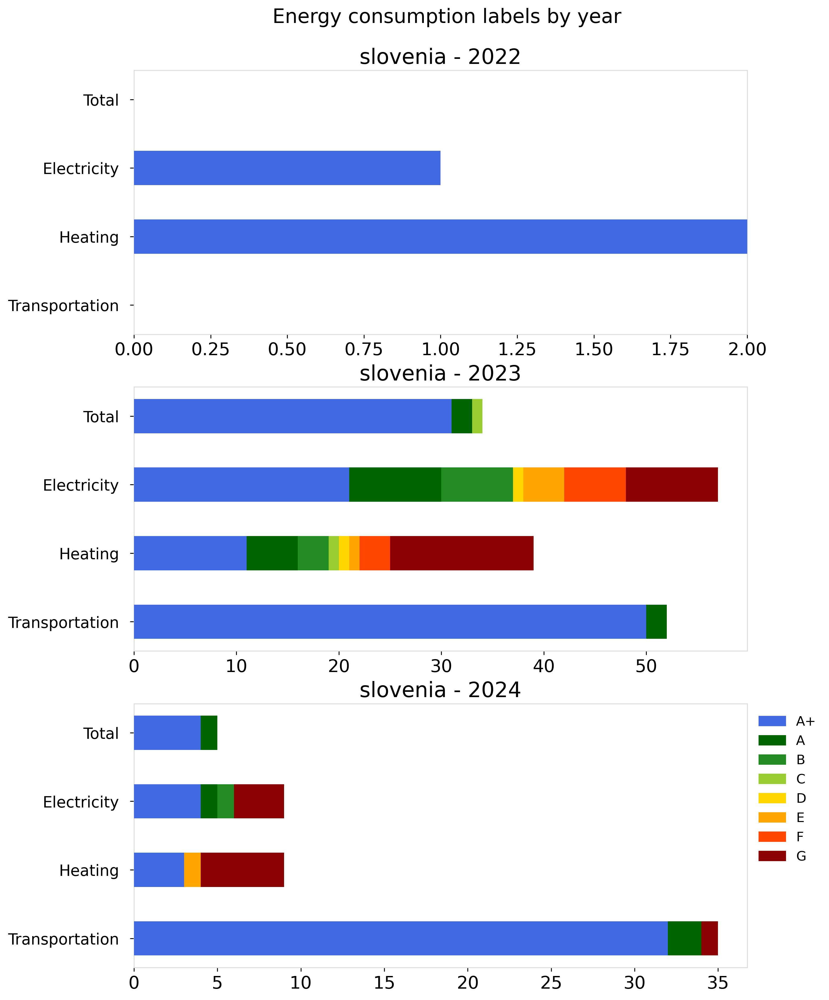

In [100]:
## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']


for k, year in enumerate([2022,2023,2024]):
 df_slovenia_year= df_slovenia.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_slovenia_year[sector][df_slovenia_year[sector, 'energyExpended_label'].notna()] )
      average_days=df_slovenia_year[sector][df_slovenia_year[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_slovenia_year[sector][(df_slovenia_year[sector]['energyExpended_label'] == label)
                                            & (df_slovenia_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_slovenia_year[df_slovenia_year['electricity', 'energyExpended_label'].notna() &
                       df_slovenia_year['heating', 'energyExpended_label'].notna() &
                       df_slovenia_year['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('slovenia - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)

fig.text(0.3, 0.92, 'Energy consumption labels by year', fontsize=18)

electricity : number of data:  1  avergae days tracked:  365.0
heating : number of data:  2  avergae days tracked:  228.5
transportation : number of data:  1  avergae days tracked:  1.0
electricity : number of data:  57  avergae days tracked:  71.56140350877193
heating : number of data:  41  avergae days tracked:  85.29268292682927
transportation : number of data:  61  avergae days tracked:  60.442622950819676
electricity : number of data:  9  avergae days tracked:  30.444444444444443
heating : number of data:  9  avergae days tracked:  72.88888888888889
transportation : number of data:  37  avergae days tracked:  60.75675675675676


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:49: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.3, 0.92, 'Carbon emission labels by year')

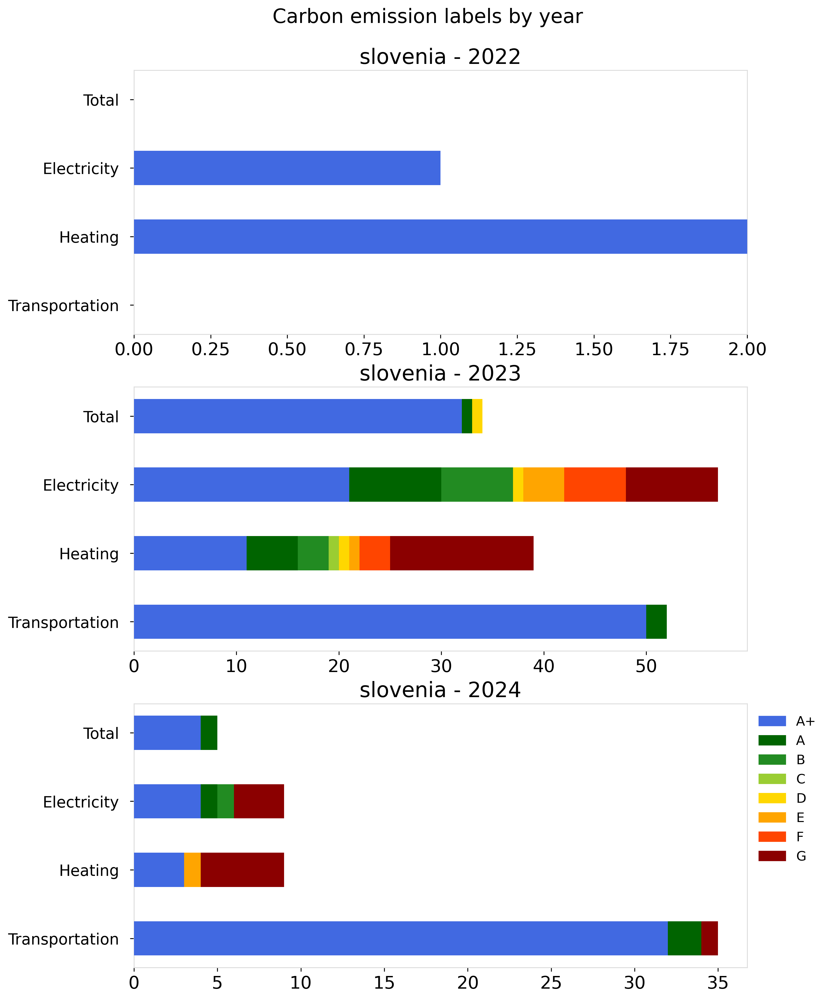

In [101]:
## carbon labels

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']



for k, year in enumerate([2022,2023,2024]):
 df_slovenia_year= df_slovenia.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_slovenia_year[sector][df_slovenia_year[sector, 'carbonEmission_label'].notna()] )
      average_days=df_slovenia_year[sector][df_slovenia_year[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_slovenia_year[sector][(df_slovenia_year[sector]['carbonEmission_label'] == label)
                                            & (df_slovenia_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_slovenia_year[df_slovenia_year['electricity', 'carbonEmission_label'].notna() &
                       df_slovenia_year['heating', 'carbonEmission_label'].notna() &
                       df_slovenia_year['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('slovenia - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)

fig.text(0.3, 0.92, 'Carbon emission labels by year', fontsize=18)

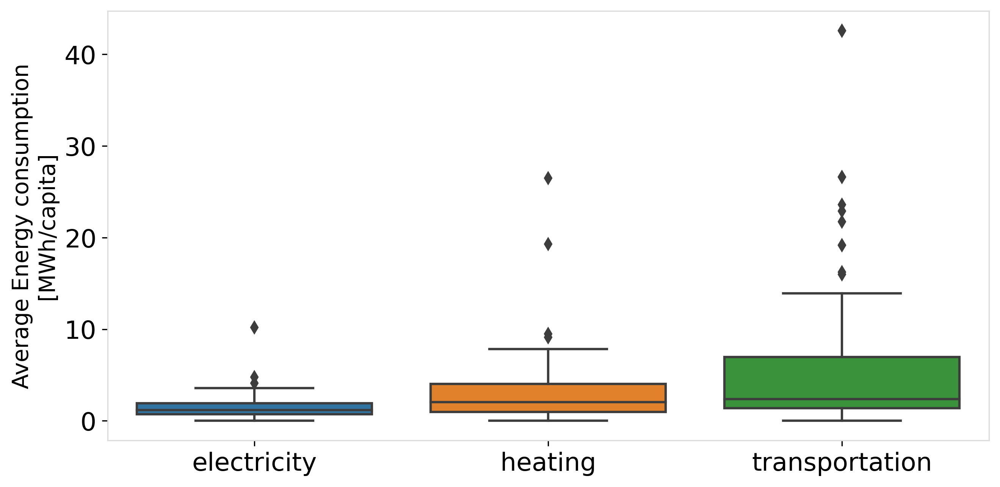

In [104]:
import seaborn as sns
# Import Data


slovenia_average_energy={'electricity': 1614.92   ,
                  'heating': 4646.80  , 
                  'transportation': 6427,  } #elec, heat, transport kWh/capita

slovenia_average_emissions={'electricity':413.42   ,
                  'heating': 548.32 , 
                  'transportation': 1631,  }  #elec, heat, transport tonne/capita

temp=pd.DataFrame({'electricity': df_slovenia.loc[:,('electricity','energyExpended_total')]*365/(
            df_slovenia.loc[:,('electricity','consumptionDays_sum' )]) ,
                       'heating': df_slovenia.loc[:,('heating','energyExpended_total')]*365/(
            df_slovenia.loc[:,('heating','consumptionDays_sum' )]) ,
                       'transportation': df_slovenia.loc[:,('transportation','energyExpended_total')]*365/(
            df_slovenia.loc[:,('transportation','consumptionDays_sum')]) ,
                      })

for sector in temp.columns:
    temp[sector]=temp[sector].apply(lambda x : np.nan if x >10* slovenia_average_energy[sector] else x) 
         
# Draw Plot
plt.figure(figsize=(10,5), )
box_plot=sns.boxplot( data=temp/1e3, notch=False)
 
box_plot.set_ylabel('Average Energy consumption\n[MWh/capita]', size=14)


# Decoration
#plt.title('Box plot for energy consumption', fontsize=22)
#plt.ylim(10, 40)
plt.show()



#axs[0,0].show()

In [105]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
color_list=[cm.tab10(norm(j),bytes=True) for j in np.arange(0,1,0.1) ]
tab10_colors=[tuple([i/255.0 for i in j]) for j in color_list]

/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: FixedFormatter should only be used together with FixedLocator


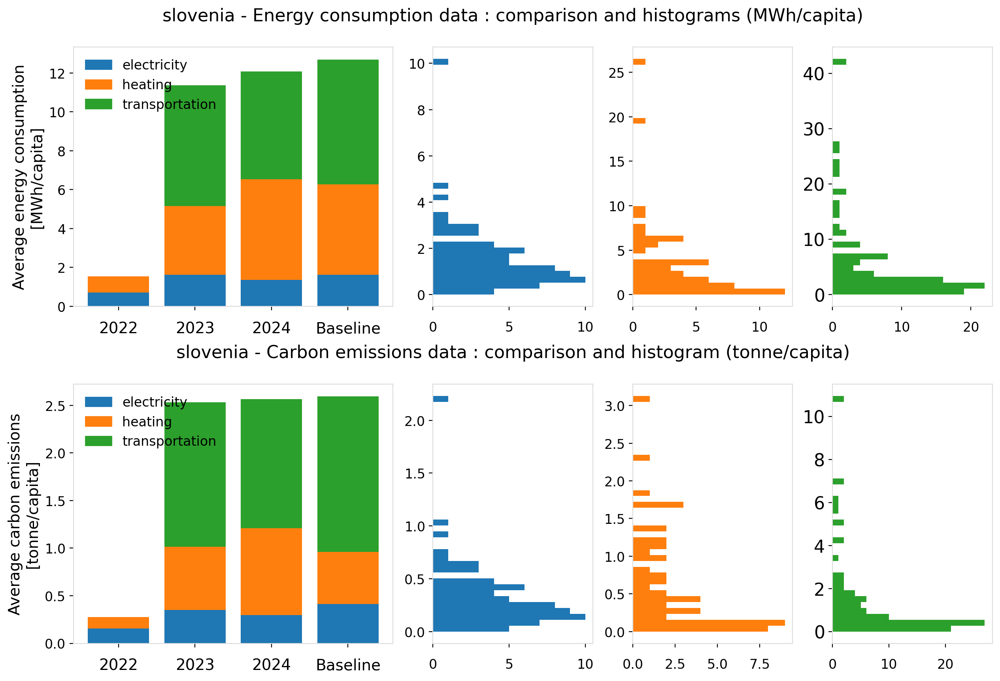

In [106]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
color_list=[cm.jet(norm(j),bytes=True) for j in np.arange(0.2,1,0.1) ]
new_colors=[tuple([i/255.0 for i in j]) for j in color_list]

new_colors=['royalblue','darkgreen','forestgreen','yellowgreen','gold','orange','orangered','darkred']


# Import Data

fig, axs = plt.subplots(2,4, figsize=(15,10), 
                        gridspec_kw={'width_ratios':[2,1,1,1]} ,
                        dpi=200) #, sharey=True)
fig.subplots_adjust(hspace=0.3)


index=np.arange(4)

for j,year in enumerate([2022, 2023, 2024]): 
   df = df_slovenia.loc[year]
   temp_energy=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'energyExpended_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'energyExpended_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'energyExpended_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh


   temp_emissions=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'carbonEmission_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'carbonEmission_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'carbonEmission_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh




    
   # Draw Plot
   bottom=0
   bottom_1=0
   bottom_2=0
   bottom_3=0


   colors={'electricity':tab10_colors[0] ,  
        'heating': tab10_colors[1] , 
        'transportation': tab10_colors[2],  }

   
   for i , sector in enumerate(temp_energy.columns):
        ##exclude unusually high (10 times the everage) consumptions:    

       temp_energy[sector]=temp_energy[sector].apply(lambda x : np.nan if x >10* slovenia_average_energy[sector]/1e3 else x) 
       temp_emissions[sector]=temp_emissions[sector].apply(lambda x : np.nan if x >10* slovenia_average_emissions[sector]/1e3 else x)
         
       to_plot= temp_energy.drop([i for i in temp_energy.index if temp_energy.loc[i, sector] ==0 or
               math.isnan(temp_energy.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[0,0].bar(index[j], to_plot, bottom=bottom, color=colors[sector])
       if not to_plot is np.nan: bottom += to_plot
       
    
       to_plot= temp_emissions.drop([i for i in temp_emissions.index if temp_emissions.loc[i, sector] ==0 or
               math.isnan(temp_emissions.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[1,0].bar(index[j], to_plot, bottom=bottom_1, color=colors[sector])
       if not to_plot is np.nan: bottom_1 += to_plot
        
        
       axs[0,0].bar(index[3], slovenia_average_energy[sector]/1e3,
               bottom=bottom_2, color=colors[sector])
       bottom_2 += slovenia_average_energy[sector]/1e3 
        
       axs[1,0].bar(index[3], slovenia_average_emissions[sector]/1e3,
               bottom=bottom_3, color=colors[sector])
       bottom_3 += slovenia_average_emissions[sector]/1e3  
       
       temp=df_slovenia.loc[:,(sector,'energyExpended_total' )]*365/(
            df_slovenia.loc[:,(sector,'consumptionDays_sum' )]) 
       temp=temp.apply(lambda x : np.nan if x >10* slovenia_average_energy[sector] else x)
    
       axs[0,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[0,i].tick_params(axis='y', labelsize=12,)
       axs[0,i+1].tick_params(axis='x', labelsize=12, pad=10,)

       temp=df_slovenia.loc[:,(sector,'carbonEmission_total' )]*365/(
            df_slovenia.loc[:,(sector,'consumptionDays_sum' )])
       temp=temp.apply(lambda x : np.nan if x >10* slovenia_average_emissions[sector] else x)
        
       axs[1,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[1,i].tick_params(axis='y', labelsize=12,)
       axs[1,i+1].tick_params(axis='x', labelsize=12, pad=10,)



#axs[0,1].set_yticks(np.arange(0, 6.1, 3),fontsize=14)   
#axs[0,2].set_yticks(np.arange(0, 2.1, 1),fontsize=14)   
#axs[0,3].set_yticks(np.arange(0, 6.1, 3),fontsize=14)  


legend_manual=[]
for i,key in enumerate(temp_energy.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[0,0].legend(handles=legend_manual,loc='upper left', ncol=1,
           fontsize=12,frameon=False)      

legend_manual=[]
for i,key in enumerate(temp_emissions.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[1,0].legend(handles=legend_manual,loc='upper left', ncol=1,
           fontsize=12,frameon=False)      
    # Decoration


axs[0,1].set_title('slovenia - Energy consumption data : comparison and histograms (MWh/capita)\n', fontsize=16)
axs[1,1].set_title('slovenia - Carbon emissions data : comparison and histogram (tonne/capita)\n', fontsize=16)

axs[0,0].set_ylabel('Average energy consumption\n[MWh/capita]', size=14)
axs[1,0].set_ylabel('Average carbon emissions\n[tonne/capita]', size=14)

xlabels = [i for i in ['2022', '2023', '2024', 'Baseline']]    ##reverse order
for ax in  [axs[0,0], axs[1,0]]:
  ax.set_xticklabels(xlabels,fontsize=14, rotation=0,ha='center', rotation_mode='anchor')
  ax.set_xticks((np.arange(4)))    
  ax.tick_params(axis='x', labelsize=14, pad=10,)




In [ ]:
## No year definition for consumptio?

In [140]:
##
import itertools


list_types_tr=[]
list_types_h=[]

for user, user_name in  enumerate(slovenia_users):        
        for i in range(len(data[slovenia_users[user]]['consumptions'])): 
         if data[slovenia_users[user]]['consumptions'][i]['category'] == 'transportation':
    
           list_types_tr.append(data[slovenia_users[user]]['consumptions'][i]['transportation']['transportationType'])
        
         if data[slovenia_users[user]]['consumptions'][i]['category'] == 'heating':
    
           list_types_h.append(data[slovenia_users[user]]['consumptions'][i]['heating']['heatingFuel'])
            


additions=['','-energyExpended', '-carbonEmissions']

list_tr= list(''.join(s) for s in itertools.product(list(set(list_types_tr)), additions)) 
list_h= list(''.join(s) for s in itertools.product(list(set(list_types_h)), additions)) 
list_el =list(''.join(s) for s in itertools.product(['default','homePhotovoltaics'], additions)) 

iterables = [
    ['electricity'],
    list_el]
index_0 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['heating'],
    list_h]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['transportation'],
    list_tr]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_0]+[list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

df_slovenia_types= pd.DataFrame(index=[i for i in slovenia_users], columns=index).fillna(0)


In [141]:
for user, user_name in  enumerate(slovenia_users):
      if any(data[slovenia_users[user]]['consumptions'])  :
         #print(user)  
         for i in range(len(data[slovenia_users[user]]['consumptions'])):
            sector=data[slovenia_users[user]]['consumptions'][i]['category'] 
            
            if data[slovenia_users[user]]['consumptions'][i]['category'] == 'electricity':
                try: sector_type= data[slovenia_users[user]]['consumptions'][i][sector]['electricitySource'] 
                except: sector_type= 'default' 

            if data[slovenia_users[user]]['consumptions'][i]['category'] == 'transportation':
                sector_type= data[slovenia_users[user]]['consumptions'][i][sector]['transportationType'] 
    
            if data[slovenia_users[user]]['consumptions'][i]['category'] == 'heating':
                sector_type= data[slovenia_users[user]]['consumptions'][i][sector]['heatingFuel'] 
                
            df_slovenia_types.loc[slovenia_users[user], (sector,sector_type) ]+=1
            try: df_slovenia_types.loc[slovenia_users[user], (sector, sector_type+'-energyExpended' ) ]+=(
                      data[slovenia_users[user]]['consumptions'][i]['energyExpended'] )
            except: continue
            try: df_slovenia_types.loc[slovenia_users[user], (sector, sector_type+'-carbonEmissions' ) ]+=(
                      data[slovenia_users[user]]['consumptions'][i]['carbonEmissions'] )    
            except: continue
   
            
            


In [171]:
color_list_= (plt.cm.Dark2.colors+plt.cm.Set1.colors+plt.cm.tab10.colors+plt.cm.Set2.colors)
color_list={'walking': color_list_[10] ,
 'dieselBus': color_list_[16] ,
 'fuelCar': color_list_[7],
 'bike': color_list_[0] ,
 'dieselPassengerTrain': color_list_[1] ,
 'electricCar': color_list_[25] ,
 'electricPassengerTrain': color_list_[5],
 'hybridElectricBus': color_list_[11],
 'electricScooter': color_list_[23],
 'alternativeFuelBus': color_list_[22],
  'metroTramOrUrbanLightTrain': color_list_[6]  ,
  'otherBus': color_list_[28] ,
  'electricBike': color_list_[4],
 'electricBus': color_list_[2],
 'highSpeedTrain': color_list_[12],
 'plane': color_list_[8],
    'motorcycle': color_list_[24], 
  'electricMotorcycle' : color_list_[26], 
  'highSpeedTrain': color_list_[14], 
  'hybridCar' :  color_list_[27],      
           }

color_list_h = {'electric':color_list_[0],
 'naturalGas': color_list_[8],
 'locallyProducedBiomass':color_list_[10],
 'biomass':color_list_[4],
 'geothermal':color_list_[1],
 'district':color_list_[2],
 'oil' :color_list_[7],
   'liquifiedPetroGas':color_list_[6],
  'solarThermal': color_list_[12],             
               }


0.7999427962247838 0.009566753267124632
0.7999593117365358 -0.00806843020717526


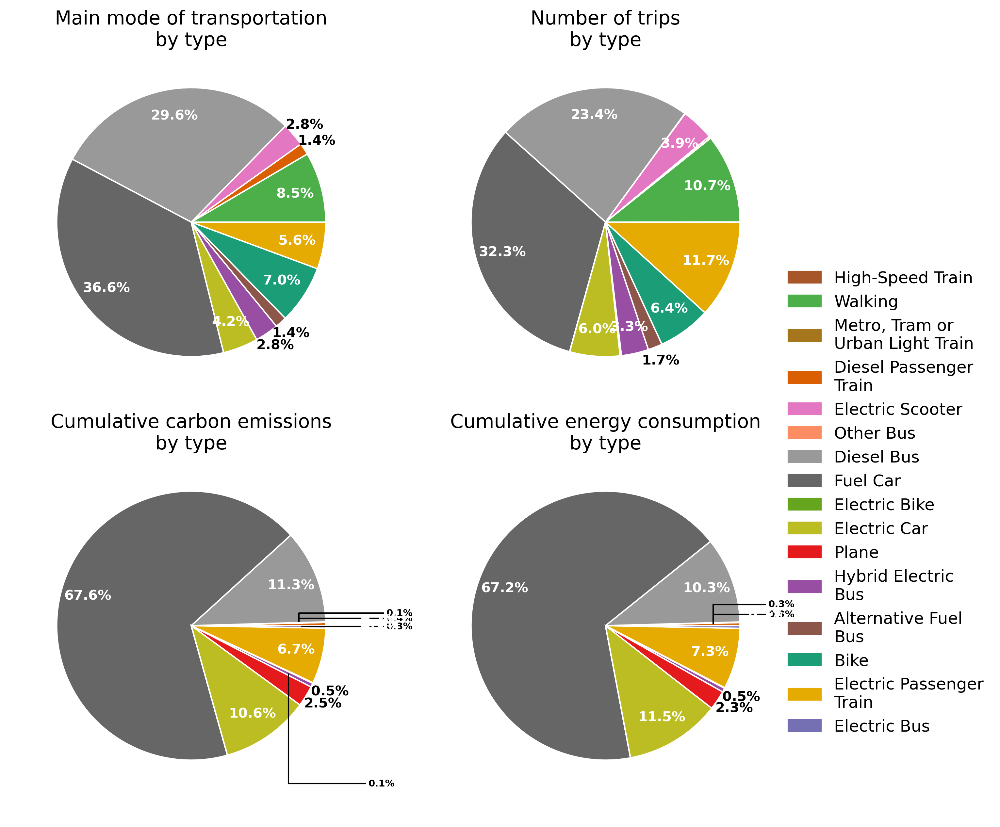

In [150]:
## TRansportation

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
#color_list= (plt.cm.Dark2.colors+plt.cm.Set1.colors)

temp=df_slovenia_types['transportation']
to_drop= [i for i in df_slovenia_types['transportation'].index if
                                     df_slovenia_types.loc[i, 'transportation'].sum()==0 and 
                                  df_slovenia_types.loc[i,('transportation' ,'walking')] == 0 ]
df_slovenia_types['transportation','main_type']= temp.loc[:, [i for i in temp if '-' not in i]].idxmax(axis=1)                                                        
tr_list=[i for i in df_slovenia_types['transportation'].columns if df_slovenia_types['transportation'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_slovenia_types['transportation','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}


labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()

r=1
my_pie, texts, pct_txts = axs[0,0].pie(sizes, radius=r, labels=tr_dict.keys() , 
                                       colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]

axs[0,0].set_title('Main mode of transportation\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.4*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt))          
        

tr_dict = {i:df_slovenia_types['transportation'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=tr_dict.keys()  ,radius=r,
            colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1}, 
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]

axs[0,1].set_title('Number of trips\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.1: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.4*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.4*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_slovenia_types['transportation'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=tr_dict.keys() , radius=r,
                    colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]

axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.1: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.4*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.5: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.4*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_position((xt,yt))     
        if x>0:
         axs[1,0].annotate(text, xy=(x,y), xytext=(xt+0.05, 2*yt), size=7, weight="bold",**kw )
        else:
         axs[1,0].annotate(text, xy=(x,y), xytext=(xt+0.05, yt), size=7, weight="bold",**kw )
    elif float(text.strip('%')) < 3: # customised
        #t.set_text(u"\u2248"+text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.15*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_slovenia_types['transportation'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
explode = (0, 0, 0.01, 0, 0, 0, 0, 0, 0, 0) 

my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=tr_dict.keys() , radius=r,
                    colors=[color_list[key] for key in labels], #explode=explode,
                wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]

axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
counter=0
for t in (pct_txts):
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.2: # don't show very small percentages
        t.set_alpha(0)
    elif float(text.strip('%')) < 0.5: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy+counter/10
        t.set_position((xt,yt)) 
        counter+=1 
        print(x,y)
        if x>0:
         axs[1,1].annotate(text, xy=(x,y), xytext=(xt+0.01, yt+0.05), size=7, weight="bold",**kw )
        else:
         axs[1,1].annotate(text, xy=(x,y), xytext=(xt+0.01, yt+0.05), size=7, weight="bold",**kw )

    elif float(text.strip('%')) < 3: # customised
        #t.set_text(u"\u2248"+text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.15*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 
  

legend_manual=[]
nice_names={'walking': 'Walking',
 'dieselBus': 'Diesel Bus',
 'fuelCar': 'Fuel Car',
 'bike': 'Bike',
 'dieselPassengerTrain': 'Diesel Passenger\nTrain',
 'electricCar': 'Electric Car',
 'electricPassengerTrain':'Electric Passenger\nTrain',
 'hybridElectricBus':'Hybrid Electric\nBus',
 'electricScooter':'Electric Scooter',
 'alternativeFuelBus':'Alternative Fuel\nBus' ,
  'metroTramOrUrbanLightTrain':'Metro, Tram or\nUrban Light Train'  ,
  'otherBus': 'Other Bus',
  'electricBike':'Electric Bike',
           'electricBus':'Electric Bus',
           'highSpeedTrain':'High-Speed Train',
           'plane':'Plane'}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[key], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 

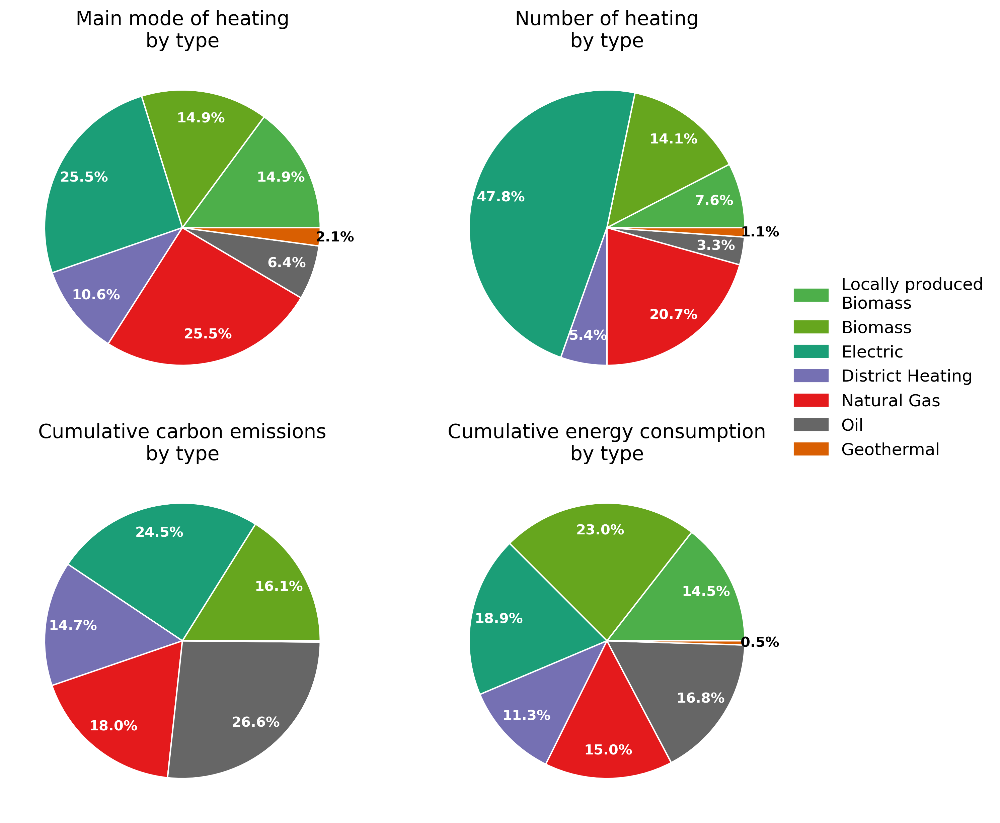

In [122]:
## heating

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']


color_list= (plt.cm.Dark2.colors+plt.cm.Set3.colors)

r=1
temp=df_slovenia_types['heating']
to_drop= [i for i in df_slovenia_types['heating'].index if
                                      df_slovenia_types.loc[i, 'heating'].sum()==0]
df_slovenia_types['heating','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]                                                         
tr_list=[i for i in df_slovenia_types['heating'].columns if df_slovenia_types['heating'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_slovenia_types['heating','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[0,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,0].set_title('Main mode of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_slovenia_types['heating'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[0,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,1].set_title('Number of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.1: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy+counter/10
        t.set_color("white")
        t.set_position((xt,yt)) 
        counter+=1  
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_slovenia_types['heating'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.2: # don't show very small percentages

        t.set_alpha(0)
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_slovenia_types['heating'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

legend_manual=[]
nice_names={'electric':'Electric',
 'naturalGas': 'Natural Gas',
 'locallyProducedBiomass':'Locally produced\nBiomass',
 'biomass':'Biomass',
 'geothermal':'Geothermal',
 'district':'District Heating',
 'oil' :'Oil'}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list_h[key], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 

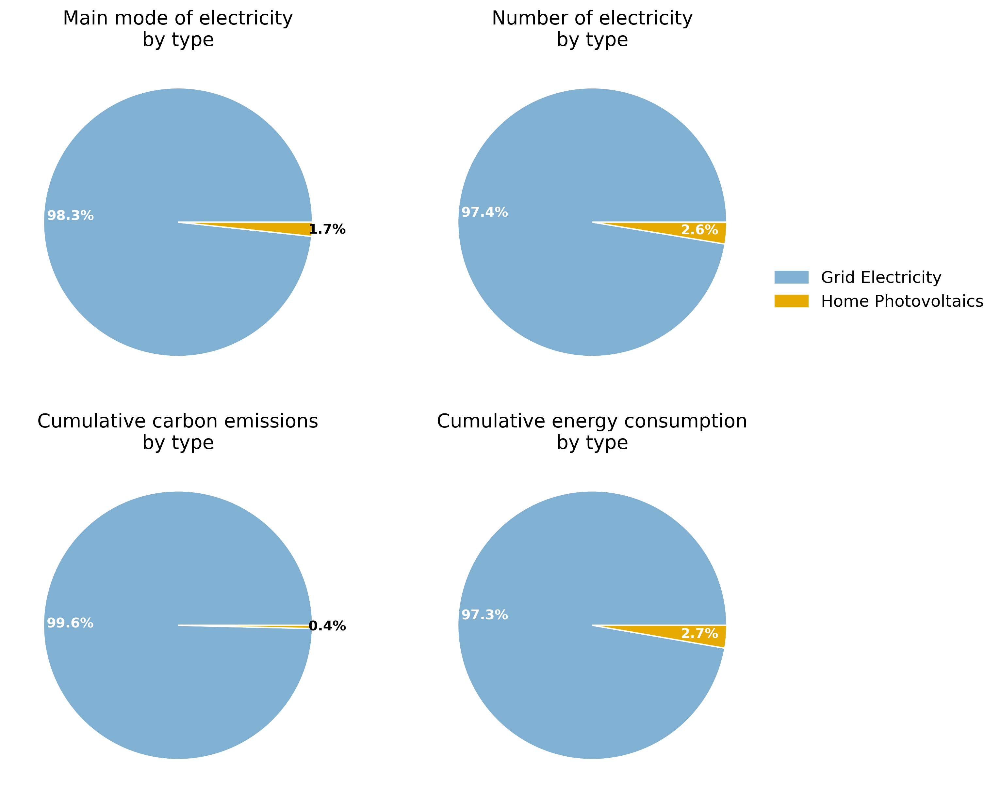

In [123]:
## electricity

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']

color_list= ((0.5019607843137255, 0.6941176470588235, 0.8274509803921568),
 #(0.4588235294117647, 0.4392156862745098, 0.7019607843137254),
 (0.9019607843137255, 0.6705882352941176, 0.00784313725490196))

temp=df_slovenia_types['electricity']

to_drop= [i for i in df_slovenia_types['electricity'].index if
                                      df_slovenia_types.loc[i, 'electricity'].sum()==0]
df_slovenia_types['electricity','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]                                                     
tr_list=[i for i in df_slovenia_types['electricity'].columns if df_slovenia_types['electricity'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_slovenia_types['electricity','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,0].set_title('Main mode of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_slovenia_types['electricity'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,1].set_title('Number of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


tr_dict = {i:df_slovenia_types['electricity'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_slovenia_types['electricity'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


legend_manual=[]
nice_names={'default':'Grid Electricity','homePhotovoltaics': 'Home Photovoltaics'}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[i], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 

# SPAIN

In [152]:
## spain
def Average(lst): 
    return sum(lst) / len(lst) 

spain_users = [i for i in list(data.keys()) if data[i]['country']=='4sq82jNQm3x3bH9Fkijm']
len(spain_users)


iterables = [
    ['Total'],
    ['carbonEmission_total', 'carbonEmission_label',
    'energyExpended_total', 'energyExpended_label' ,
    ]]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['electricity' , 'heating' ,'transportation'],
    ['carbonEmission_total','carbonEmission_percentage', 'carbonEmission_label', 
    'energyExpended_total','energyExpended_percentage', 'energyExpended_label' ,
    'consumptionDays','consumptionDays_sum', 'householdSize',]]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

iterables = [
    [2022, 2023, 2024],
    [i for i in spain_users]]

df_spain = pd.DataFrame(index=pd.MultiIndex.from_product(iterables, names=["Year", "User"]), columns=index)
#df_spain_2024 = pd.DataFrame(index=[i for i in spain_users], columns=index)

for category in  ['electricity' , 'heating' ,'transportation']:  
  for user, user_name in  enumerate(spain_users):
    years= len(data[spain_users[user]]['consumptionSummaries']) 
        
    if years>0 : 
      for year in range(years):  
         year_name= data[spain_users[user]]['consumptionSummaries'][year]['year'] 
         #print(user)
         df_spain.loc[(year_name,user_name),('Total','carbonEmission_total')]=data[spain_users[user]]['consumptionSummaries'][year]['carbonEmission']['total']
         df_spain.loc[(year_name,user_name),('Total','energyExpended_total')]=data[spain_users[user]]['consumptionSummaries'][year]['energyExpended']['total']
         try : df_spain.loc[(year_name,user_name),('Total','carbonEmission_label')]=data[spain_users[user]]['consumptionSummaries'][year]['carbonEmission']['label']
         except:
            continue
         try: df_spain.loc[(year_name,user_name),('Total','energyExpended_label')]=data[spain_users[user]]['consumptionSummaries'][year]['energyExpended']['label']   
         except:
            continue
            
         temp=data[spain_users[user]]['consumptionSummaries'][year]['categories']    
         for i in range(len(temp)):
           if temp[i]['category']==category : #print(temp[i])        
              #print(temp[i]) 
              df_spain.loc[ (year_name,user_name),(category,'carbonEmission_total')] = temp[i]['carbonEmission']['total']  
              df_spain.loc[ (year_name,user_name),(category,'carbonEmission_percentage')] = temp[i]['carbonEmission']['percentage']
              try  :
                  df_spain.loc[(year_name,user_name),(category, 'carbonEmission_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue  
                    
              df_spain.loc[(year_name,user_name),(category, 'energyExpended_total')] = temp[i]['energyExpended']['total']               
              df_spain.loc[(year_name,user_name),(category, 'energyExpended_percentage')] = temp[i]['energyExpended']['percentage']
              try :
                  df_spain.loc[(year_name,user_name),(category, 'energyExpended_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue
                    
              df_spain.loc[ (year_name,user_name),(category, 'consumptionDays')] = len(temp[i]['consumptionDays'])
              df_spain.loc[ (year_name,user_name),(category,'consumptionDays_sum')] = (
                   sum(temp[i]['consumptionDays'].values()) if  
                  sum(temp[i]['consumptionDays'].values())!=0 else 1)  ##avoid divisio by zero

            
            
              df_spain.loc[ (year_name,user_name),(category, 'householdSize')] = 1
                
              if category == 'transportation':
                 try:  

                   householdSize= Average([data[spain_users[user]]['consumptions'][i]['transportation']['privateVehicleOccupancy']
                             for i in range(len(data[spain_users[user]]['consumptions'])) if
                            'transportation' in data[spain_users[user]]['consumptions'][i].keys()
                            and 'privateVehicleOccupancy' in 
                            data[spain_users[user]]['consumptions'][i]['transportation'].keys()] )
                   df_spain.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize

                 except:
                      continue  
                
              if   category =='heating' or category =='electricity' :
                 #print(spain_users[user])
                 try:  
                   householdSize=  Average([data[spain_users[user]]['consumptions'][i]['electricity']['householdSize']
                                            for i in range(len(data[spain_users[user]]['consumptions'])) if
                       'electricity' in data[spain_users[user]]['consumptions'][i].keys()]) 
                   df_spain.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                   

                 except:  
                  try:      
                        householdSize=  Average([data[spain_users[user]]['consumptions'][i]['heating']['householdSize']
                                            for i in range(len(data[spain_users[user]]['consumptions'])) if
                           'heating' in data[spain_users[user]]['consumptions'][i].keys()]) 
                        df_spain.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                       

                  except:
                      continue  


                 




electricity : number of data:  81  avergae days tracked:  108.8641975308642
electricity : number of data:  81  avergae days tracked:  108.8641975308642
heating : number of data:  35  avergae days tracked:  123.02857142857142
heating : number of data:  35  avergae days tracked:  123.02857142857142
transportation : number of data:  115  avergae days tracked:  24.904347826086955
transportation : number of data:  115  avergae days tracked:  24.904347826086955


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:74: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.5, 1.0, 'spain - Carbon emission labels')

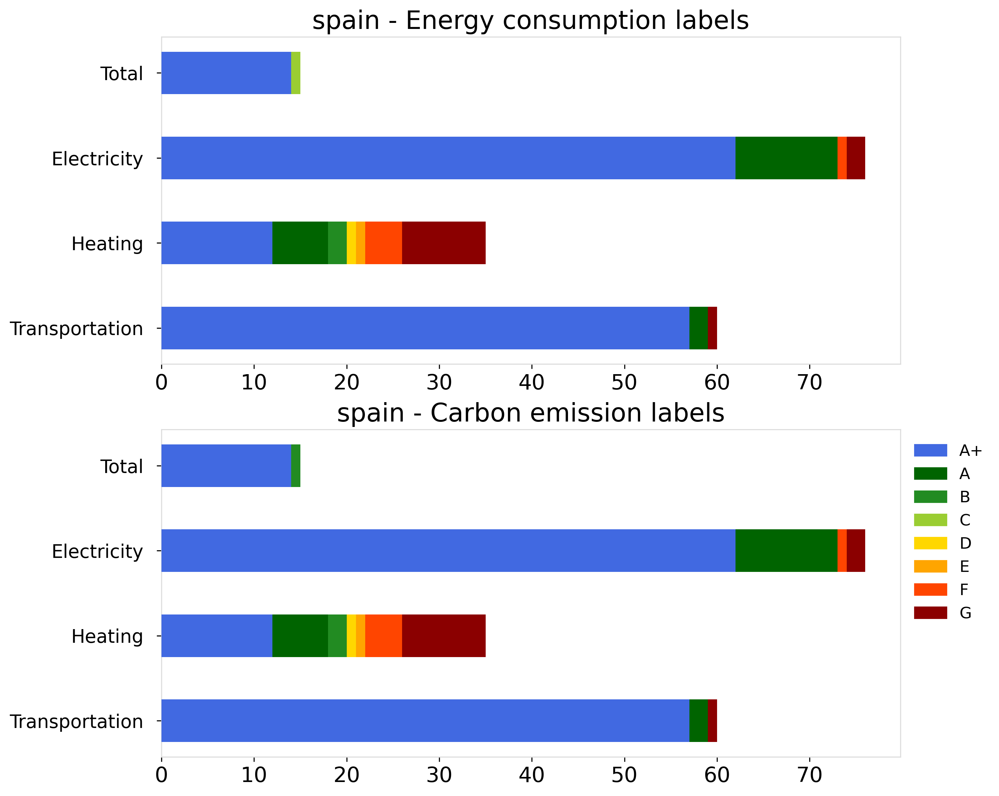

In [153]:
## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(2,1, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']



    
for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_spain[sector][df_spain[sector, 'energyExpended_label'].notna()] )
      average_days=df_spain[sector][df_spain[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_spain[sector][(df_spain[sector]['energyExpended_label'] == label)
                                            & (df_spain[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_spain[df_spain['electricity', 'energyExpended_label'].notna() &
                       df_spain['heating', 'energyExpended_label'].notna() &
                       df_spain['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[0].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot



   if sector != 'Total' :

      count_e= len(df_spain[sector][df_spain[sector, 'carbonEmission_label'].notna()] )
      average_days=df_spain[sector][df_spain[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_spain[sector][(df_spain[sector]['carbonEmission_label'] == label)
                                            & (df_spain[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_spain[df_spain['electricity', 'carbonEmission_label'].notna() &
                       df_spain['heating', 'carbonEmission_label'].notna() &
                       df_spain['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[1].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot

    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)


axs[0].set_title('spain - Energy consumption labels')
axs[1].set_title('spain - Carbon emission labels')


electricity : number of data:  11  avergae days tracked:  50.09090909090909
heating : number of data:  5  avergae days tracked:  50.6
transportation : number of data:  0  avergae days tracked:  nan
electricity : number of data:  37  avergae days tracked:  193.9189189189189
heating : number of data:  19  avergae days tracked:  190.31578947368422
transportation : number of data:  17  avergae days tracked:  55.8235294117647
electricity : number of data:  33  avergae days tracked:  33.09090909090909
heating : number of data:  11  avergae days tracked:  39.72727272727273
transportation : number of data:  98  avergae days tracked:  19.540816326530614


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.3, 0.92, 'Energy consumption labels by year')

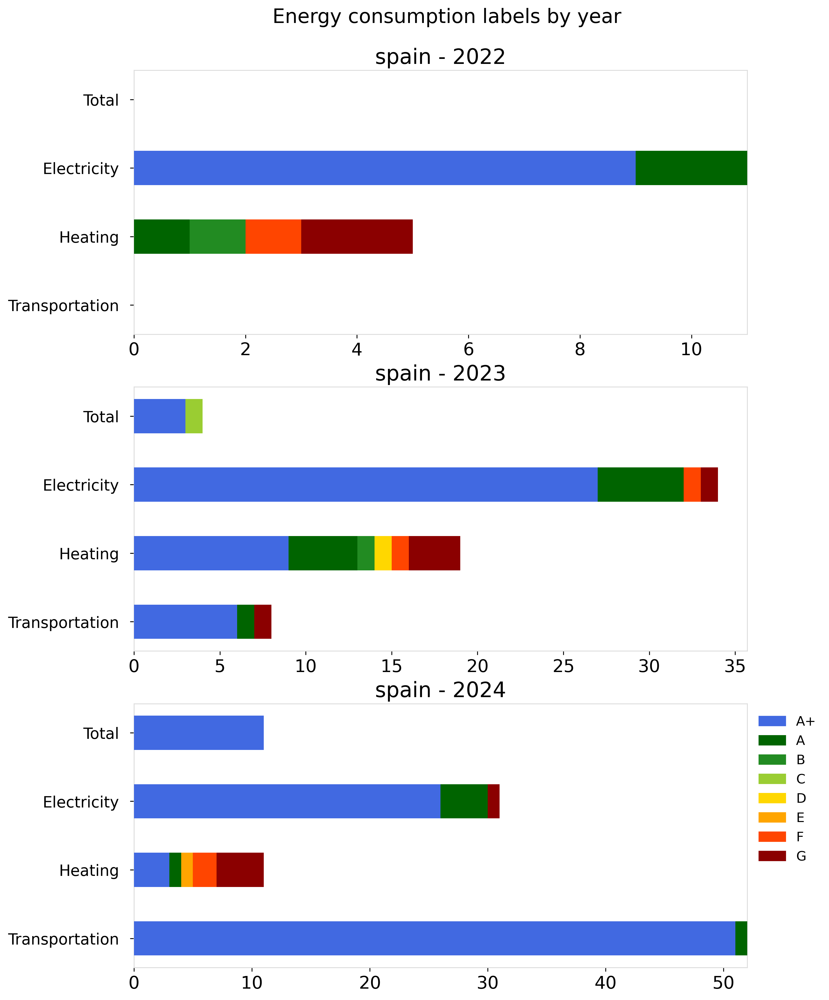

In [155]:
## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']


for k, year in enumerate([2022,2023,2024]):
 df_spain_year= df_spain.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_spain_year[sector][df_spain_year[sector, 'energyExpended_label'].notna()] )
      average_days=df_spain_year[sector][df_spain_year[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_spain_year[sector][(df_spain_year[sector]['energyExpended_label'] == label)
                                            & (df_spain_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_spain_year[df_spain_year['electricity', 'energyExpended_label'].notna() &
                       df_spain_year['heating', 'energyExpended_label'].notna() &
                       df_spain_year['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('spain - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)

fig.text(0.3, 0.92, 'Energy consumption labels by year', fontsize=18)

electricity : number of data:  11  avergae days tracked:  50.09090909090909
heating : number of data:  5  avergae days tracked:  50.6
transportation : number of data:  0  avergae days tracked:  nan
electricity : number of data:  37  avergae days tracked:  193.9189189189189
heating : number of data:  19  avergae days tracked:  190.31578947368422
transportation : number of data:  17  avergae days tracked:  55.8235294117647
electricity : number of data:  33  avergae days tracked:  33.09090909090909
heating : number of data:  11  avergae days tracked:  39.72727272727273
transportation : number of data:  98  avergae days tracked:  19.540816326530614


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:49: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.3, 0.92, 'Carbon emission labels by year')

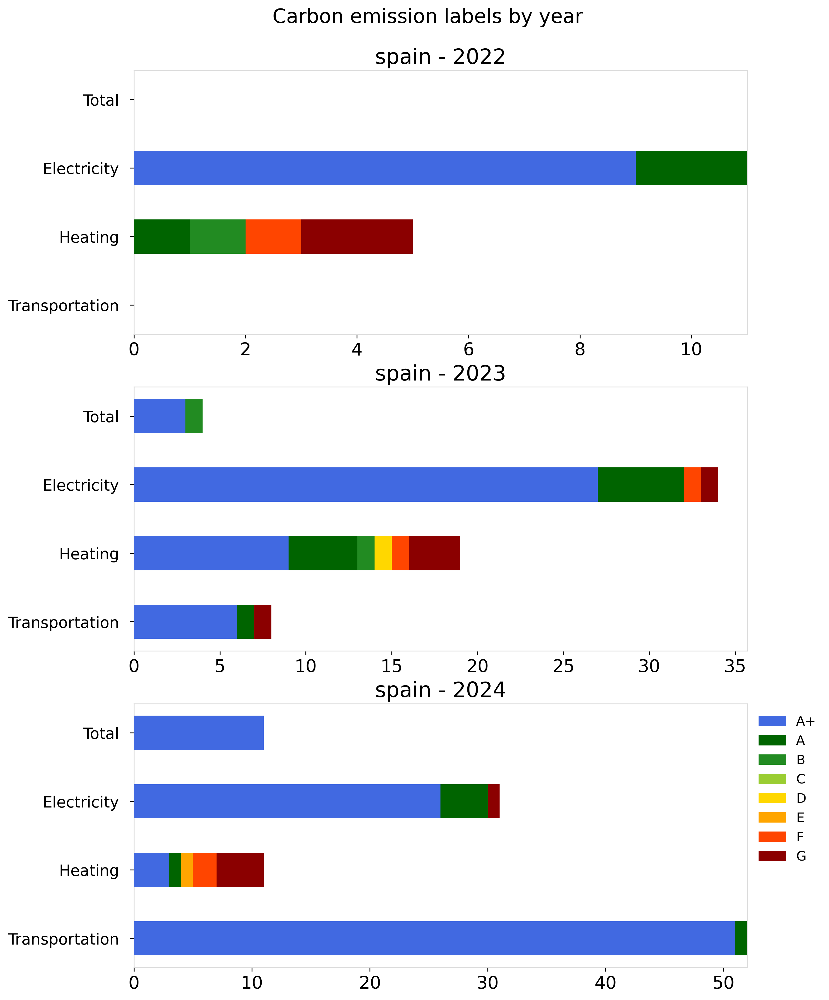

In [157]:
## carbon labels

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']



for k, year in enumerate([2022,2023,2024]):
 df_spain_year= df_spain.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_spain_year[sector][df_spain_year[sector, 'carbonEmission_label'].notna()] )
      average_days=df_spain_year[sector][df_spain_year[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_spain_year[sector][(df_spain_year[sector]['carbonEmission_label'] == label)
                                            & (df_spain_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_spain_year[df_spain_year['electricity', 'carbonEmission_label'].notna() &
                       df_spain_year['heating', 'carbonEmission_label'].notna() &
                       df_spain_year['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('spain - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)


fig.text(0.3, 0.92, 'Carbon emission labels by year', fontsize=18)

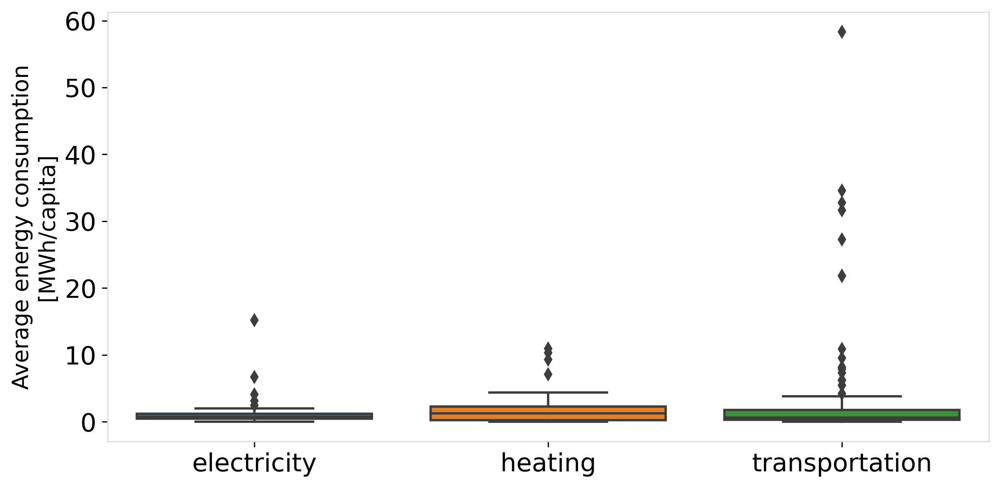

In [160]:
import seaborn as sns
# Import Data

spain_average_energy={'electricity': 1607.22  ,
                  'heating':2168.76  , 
                  'transportation': 6023,  } #elec, heat, transport kWh/capita

spain_average_emissions={'electricity':511.10  ,
                  'heating': 438.09 , 
                  'transportation': 1502,  }  #elec, heat, transport tonne/capita

temp=pd.DataFrame({'electricity': df_spain.loc[:,('electricity','energyExpended_total')]*365/(
            df_spain.loc[:,('electricity','consumptionDays_sum' )]) ,
                       'heating': df_spain.loc[:,('heating','energyExpended_total')]*365/(
            df_spain.loc[:,('heating','consumptionDays_sum' )]) ,
                       'transportation': df_spain.loc[:,('transportation','energyExpended_total')]*365/(
            df_spain.loc[:,('transportation','consumptionDays_sum')]) ,
                      })

for sector in temp.columns:
    temp[sector]=temp[sector].apply(lambda x : np.nan if x >10* spain_average_energy[sector] else x) 
         
# Draw Plot
plt.figure(figsize=(10,5), )
box_plot= sns.boxplot( data=temp/1e3, notch=False)
 
box_plot.set_ylabel('Average energy consumption\n[MWh/capita]', size=14)

# Decoration
#plt.title('Box plot for energy consumption', fontsize=22)
#plt.ylim(10, 40)
plt.show()



#axs[0,0].show()



/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: FixedFormatter should only be used together with FixedLocator


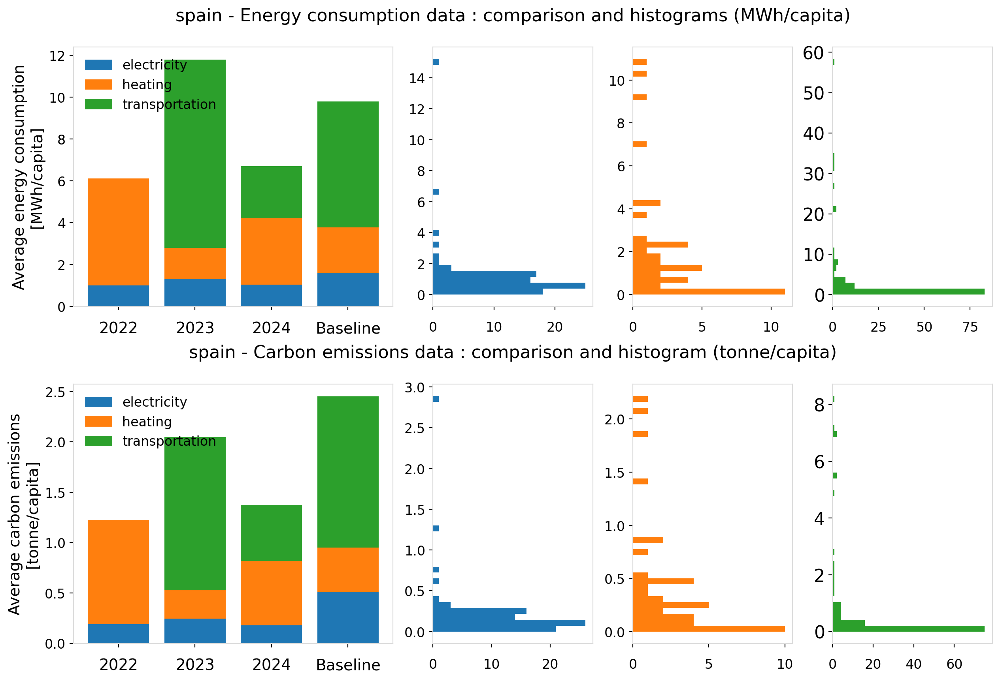

In [161]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
color_list=[cm.jet(norm(j),bytes=True) for j in np.arange(0.2,1,0.1) ]
new_colors=[tuple([i/255.0 for i in j]) for j in color_list]

new_colors=['royalblue','darkgreen','forestgreen','yellowgreen','gold','orange','orangered','darkred']


# Import Data

fig, axs = plt.subplots(2,4, figsize=(15,10), 
                        gridspec_kw={'width_ratios':[2,1,1,1]} ,
                        dpi=200) #, sharey=True)
fig.subplots_adjust(hspace=0.3)


index=np.arange(4)

for j,year in enumerate([2022, 2023, 2024]): 
   df = df_spain.loc[year]
   temp_energy=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'energyExpended_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'energyExpended_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'energyExpended_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh


   temp_emissions=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'carbonEmission_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'carbonEmission_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'carbonEmission_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh




    
   # Draw Plot
   bottom=0
   bottom_1=0
   bottom_2=0
   bottom_3=0


   colors={'electricity':tab10_colors[0] ,  
        'heating': tab10_colors[1] , 
        'transportation': tab10_colors[2],  }

   
   for i , sector in enumerate(temp_energy.columns):
        ##exclude unusually high (10 times the everage) consumptions:    

       temp_energy[sector]=temp_energy[sector].apply(lambda x : np.nan if x >10* spain_average_energy[sector]/1e3 else x) 
       temp_emissions[sector]=temp_emissions[sector].apply(lambda x : np.nan if x >10* spain_average_emissions[sector]/1e3 else x)
         
       to_plot= temp_energy.drop([i for i in temp_energy.index if temp_energy.loc[i, sector] ==0 or
               math.isnan(temp_energy.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[0,0].bar(index[j], to_plot, bottom=bottom, color=colors[sector])
       if not to_plot is np.nan: bottom += to_plot
       
    
       to_plot= temp_emissions.drop([i for i in temp_emissions.index if temp_emissions.loc[i, sector] ==0 or
               math.isnan(temp_emissions.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[1,0].bar(index[j], to_plot, bottom=bottom_1, color=colors[sector])
       if not to_plot is np.nan: bottom_1 += to_plot
        
        
       axs[0,0].bar(index[3], spain_average_energy[sector]/1e3,
               bottom=bottom_2, color=colors[sector])
       bottom_2 += spain_average_energy[sector]/1e3 
        
       axs[1,0].bar(index[3], spain_average_emissions[sector]/1e3,
               bottom=bottom_3, color=colors[sector])
       bottom_3 += spain_average_emissions[sector]/1e3  
       
       temp=df_spain.loc[:,(sector,'energyExpended_total' )]*365/(
            df_spain.loc[:,(sector,'consumptionDays_sum' )]) 
       temp=temp.apply(lambda x : np.nan if x >10* spain_average_energy[sector] else x)
    
       axs[0,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[0,i].tick_params(axis='y', labelsize=12,)
       axs[0,i+1].tick_params(axis='x', labelsize=12, pad=10,)

       temp=df_spain.loc[:,(sector,'carbonEmission_total' )]*365/(
            df_spain.loc[:,(sector,'consumptionDays_sum' )])
       temp=temp.apply(lambda x : np.nan if x >10* spain_average_emissions[sector] else x)
        
       axs[1,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[1,i].tick_params(axis='y', labelsize=12,)
       axs[1,i+1].tick_params(axis='x', labelsize=12, pad=10,)



#axs[0,1].set_yticks(np.arange(0, 6.1, 3),fontsize=14)   
#axs[0,2].set_yticks(np.arange(0, 2.1, 1),fontsize=14)   
#axs[0,3].set_yticks(np.arange(0, 6.1, 3),fontsize=14)  


legend_manual=[]
for i,key in enumerate(temp_energy.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[0,0].legend(handles=legend_manual,loc='upper left', ncol=1,
           fontsize=12,frameon=False)      

legend_manual=[]
for i,key in enumerate(temp_emissions.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[1,0].legend(handles=legend_manual,loc='upper left', ncol=1,
           fontsize=12,frameon=False)      
    # Decoration


axs[0,1].set_title('spain - Energy consumption data : comparison and histograms (MWh/capita)\n', fontsize=16)
axs[1,1].set_title('spain - Carbon emissions data : comparison and histogram (tonne/capita)\n', fontsize=16)

axs[0,0].set_ylabel('Average energy consumption\n[MWh/capita]', size=14)
axs[1,0].set_ylabel('Average carbon emissions\n[tonne/capita]', size=14)

xlabels = [i for i in ['2022', '2023', '2024', 'Baseline']]    ##reverse order
for ax in  [axs[0,0], axs[1,0]]:
  ax.set_xticklabels(xlabels,fontsize=14, rotation=0,ha='center', rotation_mode='anchor')
  ax.set_xticks((np.arange(4)))    
  ax.tick_params(axis='x', labelsize=14, pad=10,)


In [197]:

#axs[0].show()

## No year definition for consumptio?

##
import itertools


list_types_tr=[]
list_types_h=[]

for user, user_name in  enumerate(spain_users):        
        for i in range(len(data[spain_users[user]]['consumptions'])): 
         if data[spain_users[user]]['consumptions'][i]['category'] == 'transportation':
    
           list_types_tr.append(data[spain_users[user]]['consumptions'][i]['transportation']['transportationType'])
        
         if data[spain_users[user]]['consumptions'][i]['category'] == 'heating':
    
           list_types_h.append(data[spain_users[user]]['consumptions'][i]['heating']['heatingFuel'])
            


additions=['','-energyExpended', '-carbonEmissions']

list_tr= list(''.join(s) for s in itertools.product(list(set(list_types_tr)), additions)) 
list_h= list(''.join(s) for s in itertools.product(list(set(list_types_h)), additions)) 
list_el =list(''.join(s) for s in itertools.product(['default','homePhotovoltaics'], additions)) 

iterables = [
    ['electricity'],
    list_el]
index_0 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['heating'],
    list_h]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['transportation'],
    list_tr]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_0]+[list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

df_spain_types= pd.DataFrame(index=[i for i in spain_users], columns=index).fillna(0)


for user, user_name in  enumerate(spain_users):
      if any(data[spain_users[user]]['consumptions'])  :
         #print(user)  
         for i in range(len(data[spain_users[user]]['consumptions'])):
            sector=data[spain_users[user]]['consumptions'][i]['category'] 
            
            if data[spain_users[user]]['consumptions'][i]['category'] == 'electricity':
                try: sector_type= data[spain_users[user]]['consumptions'][i][sector]['electricitySource'] 
                except: sector_type= 'default' 

            if data[spain_users[user]]['consumptions'][i]['category'] == 'transportation':
                sector_type= data[spain_users[user]]['consumptions'][i][sector]['transportationType'] 
    
            if data[spain_users[user]]['consumptions'][i]['category'] == 'heating':
                sector_type= data[spain_users[user]]['consumptions'][i][sector]['heatingFuel'] 
                
            df_spain_types.loc[spain_users[user], (sector,sector_type) ]+=1
            try: df_spain_types.loc[spain_users[user], (sector, sector_type+'-energyExpended' ) ]+=(
                      data[spain_users[user]]['consumptions'][i]['energyExpended'] )
            except: continue
            try: df_spain_types.loc[spain_users[user], (sector, sector_type+'-carbonEmissions' ) ]+=(
                      data[spain_users[user]]['consumptions'][i]['carbonEmissions'] )    
            except: continue

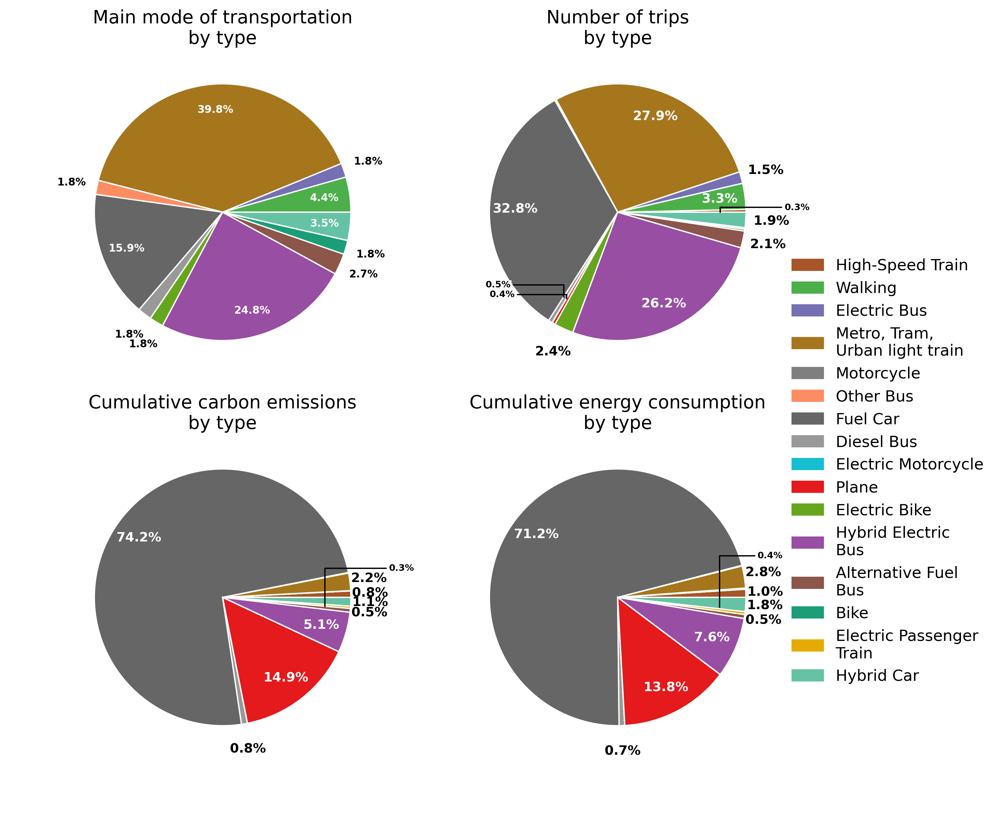

In [198]:
## TRansportation

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
#color_list= (plt.cm.Dark2.colors+plt.cm.Set1.colors)
bbox_props = dict(boxstyle="square,pad=0", fc="w", ec="w", lw=0.72)
arrowprops=dict(arrowstyle="-",connectionstyle="angle,angleA=0,angleB=90")
kw = dict(xycoords='data',textcoords='data',
          arrowprops=arrowprops, bbox=bbox_props, zorder=1)



temp=df_spain_types['transportation']
to_drop= [i for i in df_spain_types['transportation'].index if
                                      df_spain_types.loc[i, 'transportation'].sum()==0 and 
                                  df_spain_types.loc[i,('transportation' ,'walking')] == 0 ]
df_spain_types['transportation','main_type']= temp.loc[:, [i for i in temp if '-' not in i]].idxmax(axis=1)                                                        
tr_list=[i for i in df_spain_types['transportation'].columns if df_spain_types['transportation'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_spain_types['transportation','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()

r=1
my_pie, texts, pct_txts = axs[0,0].pie(sizes, radius=r, labels=None , 
                                       colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]
axs[0,0].set_title('Main mode of transportation\nby type', fontsize=14)
plt.setp(pct_txts, size=8, weight="bold", zorder=3)
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.3: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.6*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 1: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        axs[0,0].annotate(text, xy=(x,y-0.0), xytext=(xt+0.05, yt+0.8), size=7, weight="bold",**kw )
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt))          
        

tr_dict = {i:df_spain_types['transportation'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=None  ,radius=r,  colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]
axs[0,1].set_title('Number of trips\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.3: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.6*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.6: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        #print(xt, yt)
        if xt>0:
         axs[0,1].annotate(text, xy=(x,y-0.03), xytext=(xt+0.1, yt), size=7, weight="bold",**kw )
        else:
         axs[0,1].annotate(text, xy=(x,y), xytext=(xt-0.4, 3*yt+3.5), size=7, weight="bold",**kw )
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_spain_types['transportation'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=None , radius=r, colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.3: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.6*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.5: # customised
        t.set_text(text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.4*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("w")
        t.set_alpha(0)
        t.set_position((xt,yt))  
        axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt+0.3), size=7, weight="bold",**kw )

    elif float(text.strip('%')) < 3: # customised
        t.set_text(text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.15*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_spain_types['transportation'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
explode = (0, 0, 0.01, 0, 0, 0, 0, 0, 0, 0) 

my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=None , radius=r, colors=[color_list[key] for key in labels], #explode=explode,
                wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
counter=0
for t in (pct_txts):
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.3: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.5: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        axs[1,1].annotate(text, xy=(x,y), xytext=(xt-0.1, yt+0.5), size=7, weight="bold",**kw )
    elif float(text.strip('%')) < 4: #customised
        t#.set_text(u"\u2248"+text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.15*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 
  

legend_manual=[]
nice_names={'walking': 'Walking',
 'dieselBus': 'Diesel Bus',
 'fuelCar': 'Fuel Car',
 'bike': 'Bike',
 'dieselPassengerTrain': 'Diesel Passenger\nTrain',
 'electricCar': 'Electric Car',
 'electricPassengerTrain':'Electric Passenger\nTrain',
 'hybridElectricBus':'Hybrid Electric\nBus',
 'electricScooter':'Electric Scooter',
 'alternativeFuelBus':'Alternative Fuel\nBus' ,
 'metroTramOrUrbanLightTrain': 'Metro, Tram,\nUrban light train',
 'hybridCar':'Hybrid Car',
 'otherBus':'Other Bus',
 'electricBus': 'Electric Bus',
 'electricBike': 'Electric Bike',
  'motorcycle':'Motorcycle'  ,
 'electricMotorcycle' :'Electric Motorcycle',
  'highSpeedTrain':'High-Speed Train',
   'plane' :'Plane'       }
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[key], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 

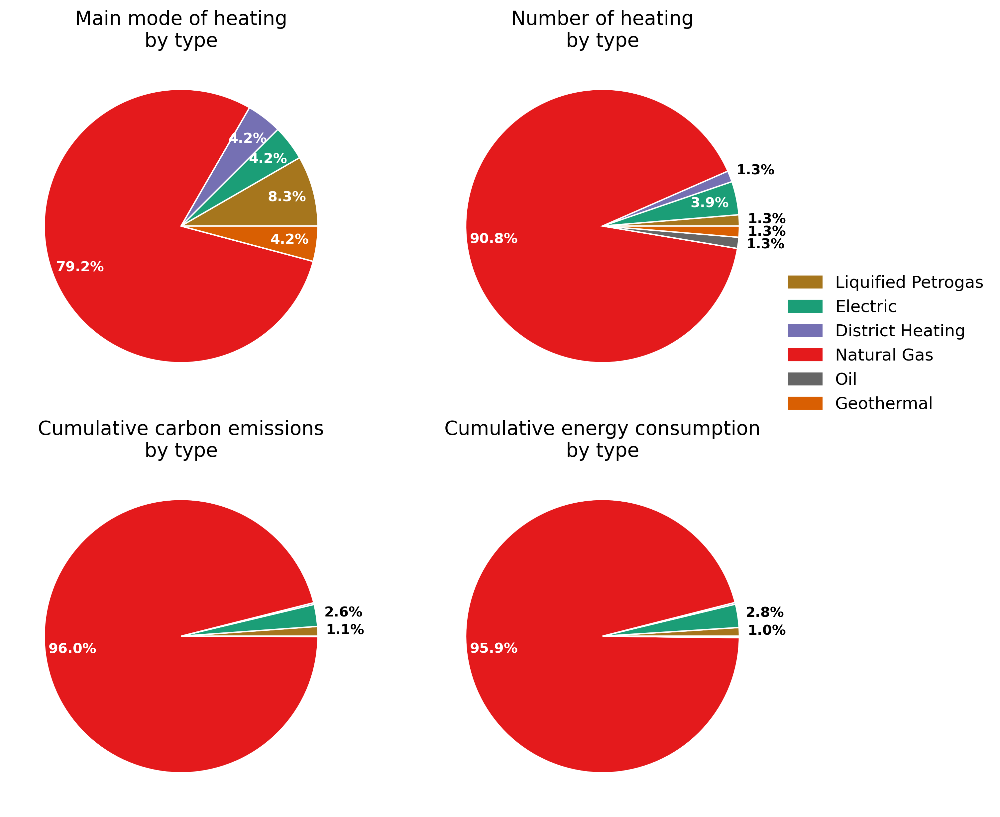

In [167]:



## heating

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']


color_list= (plt.cm.Dark2.colors+plt.cm.Set1.colors)

r=1
temp=df_spain_types['heating']
to_drop= [i for i in df_spain_types['heating'].index if
                                      df_spain_types.loc[i, 'heating'].sum()==0]
df_spain_types['heating','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]                                                         
tr_list=[i for i in df_spain_types['heating'].columns if df_spain_types['heating'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_spain_types['heating','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[0,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,0].set_title('Main mode of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.3 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.6: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        if yt>-0.5:
         axs[0,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 2*yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[0,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt), size=7, weight="bold",**kw )    
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_spain_types['heating'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[0,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,1].set_title('Number of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_spain_types['heating'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.3 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.6: 
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        if yt>-0.5:
         axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 2*yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt), size=7, weight="bold",**kw )      
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_spain_types['heating'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.3 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.5: 
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        print(xt, yt)
        if yt>0:
         axs[1,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[1,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt-0.1), size=7, weight="bold",**kw )      
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

legend_manual=[]
nice_names={'electric':'Electric',
 'naturalGas': 'Natural Gas',
 'locallyProducedBiomass':'Locally produced\nBiomass',
 'biomass':'Biomass',
 'geothermal':'Geothermal',
 'district':'District Heating',
 'oil' :'Oil',
   'liquifiedPetroGas':'Liquified Petrogas' ,}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list_h[key], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 



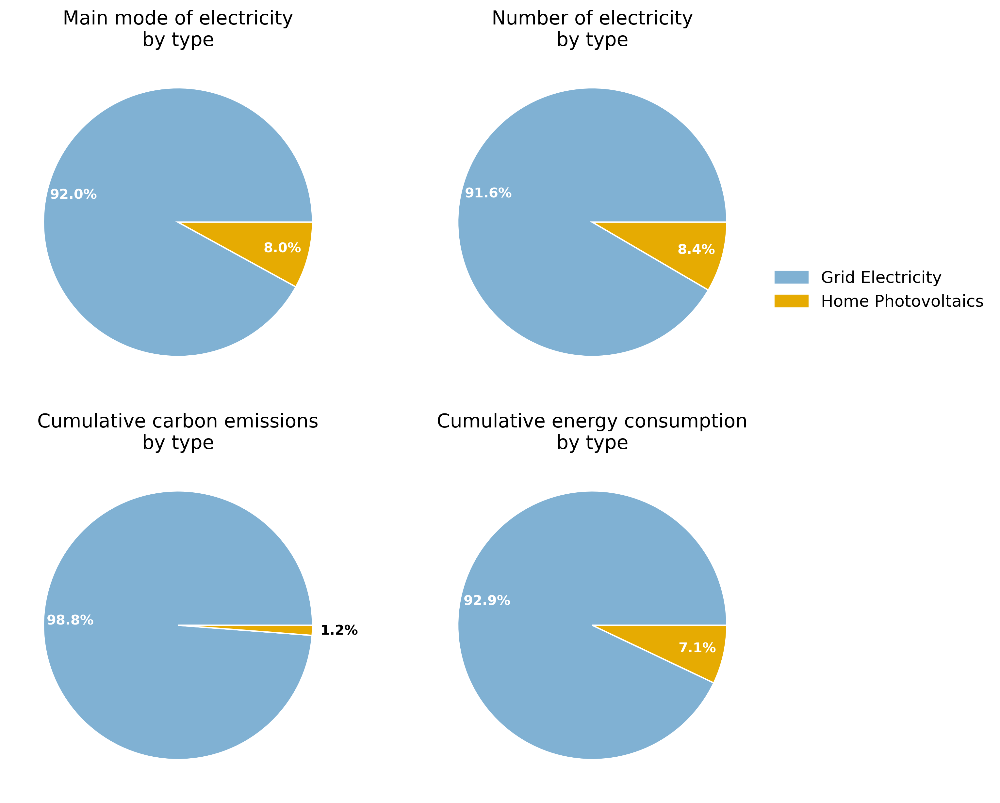

In [168]:

## electricity

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']

color_list= ((0.5019607843137255, 0.6941176470588235, 0.8274509803921568),
 #(0.4588235294117647, 0.4392156862745098, 0.7019607843137254),
 (0.9019607843137255, 0.6705882352941176, 0.00784313725490196))

temp=df_spain_types['electricity']

to_drop= [i for i in df_spain_types['electricity'].index if
                                      df_spain_types.loc[i, 'electricity'].sum()==0]
df_spain_types['electricity','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]                                                     
tr_list=[i for i in df_spain_types['electricity'].columns if df_spain_types['electricity'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_spain_types['electricity','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,0].set_title('Main mode of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_spain_types['electricity'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,1].set_title('Number of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


tr_dict = {i:df_spain_types['electricity'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_spain_types['electricity'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


legend_manual=[]
nice_names={'default':'Grid Electricity','homePhotovoltaics': 'Home Photovoltaics'}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[i], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 


# PORTUGAL

In [39]:
## portugal
def Average(lst): 
    return sum(lst) / len(lst) 

portugal_users = [i for i in list(data.keys()) if data[i]['country']=='2E9Ejc8qBJC6HnlPPdIh']
len(portugal_users)


iterables = [
    ['Total'],
    ['carbonEmission_total', 'carbonEmission_label',
    'energyExpended_total', 'energyExpended_label' ,
    ]]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['electricity' , 'heating' ,'transportation'],
    ['carbonEmission_total','carbonEmission_percentage', 'carbonEmission_label', 
    'energyExpended_total','energyExpended_percentage', 'energyExpended_label' ,
    'consumptionDays','consumptionDays_sum', 'householdSize',]]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

iterables = [
    [2022, 2023, 2024],
    [i for i in portugal_users]]

df_portugal = pd.DataFrame(index=pd.MultiIndex.from_product(iterables, names=["Year", "User"]), columns=index)
#df_portugal_2024 = pd.DataFrame(index=[i for i in portugal_users], columns=index)

for category in  ['electricity' , 'heating' ,'transportation']:  
  for user, user_name in  enumerate(portugal_users):
    years= len(data[portugal_users[user]]['consumptionSummaries']) 
        
    if years>0 : 
      for year in range(years):  
         year_name= data[portugal_users[user]]['consumptionSummaries'][year]['year'] 
         #print(user)
         df_portugal.loc[(year_name,user_name),('Total','carbonEmission_total')]=data[portugal_users[user]]['consumptionSummaries'][year]['carbonEmission']['total']
         df_portugal.loc[(year_name,user_name),('Total','energyExpended_total')]=data[portugal_users[user]]['consumptionSummaries'][year]['energyExpended']['total']
         try : df_portugal.loc[(year_name,user_name),('Total','carbonEmission_label')]=data[portugal_users[user]]['consumptionSummaries'][year]['carbonEmission']['label']
         except:
            continue
         try: df_portugal.loc[(year_name,user_name),('Total','energyExpended_label')]=data[portugal_users[user]]['consumptionSummaries'][year]['energyExpended']['label']   
         except:
            continue
            
         temp=data[portugal_users[user]]['consumptionSummaries'][year]['categories']    
         for i in range(len(temp)):
           if temp[i]['category']==category : #print(temp[i])        
              #print(temp[i]) 
              df_portugal.loc[ (year_name,user_name),(category,'carbonEmission_total')] = temp[i]['carbonEmission']['total']  
              df_portugal.loc[ (year_name,user_name),(category,'carbonEmission_percentage')] = temp[i]['carbonEmission']['percentage']
              try  :
                  df_portugal.loc[(year_name,user_name),(category, 'carbonEmission_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue  
                    
              df_portugal.loc[(year_name,user_name),(category, 'energyExpended_total')] = temp[i]['energyExpended']['total']               
              df_portugal.loc[(year_name,user_name),(category, 'energyExpended_percentage')] = temp[i]['energyExpended']['percentage']
              try :
                  df_portugal.loc[(year_name,user_name),(category, 'energyExpended_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue
                    
              df_portugal.loc[ (year_name,user_name),(category, 'consumptionDays')] = len(temp[i]['consumptionDays'])
              df_portugal.loc[ (year_name,user_name),(category,'consumptionDays_sum')] = (
                   sum(temp[i]['consumptionDays'].values()) if  
                  sum(temp[i]['consumptionDays'].values())!=0 else 1)  ##avoid divisio by zero

            
            
              df_portugal.loc[ (year_name,user_name),(category, 'householdSize')] = 1
                
              if category == 'transportation':
                 try:  

                   householdSize= Average([data[portugal_users[user]]['consumptions'][i]['transportation']['privateVehicleOccupancy']
                             for i in range(len(data[portugal_users[user]]['consumptions'])) if
                            'transportation' in data[portugal_users[user]]['consumptions'][i].keys()
                            and 'privateVehicleOccupancy' in 
                            data[portugal_users[user]]['consumptions'][i]['transportation'].keys()] )
                   df_portugal.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize

                 except:
                      continue  
                
              if   category =='heating' or category =='electricity' :
                 #print(portugal_users[user])
                 try:  
                   householdSize=  Average([data[portugal_users[user]]['consumptions'][i]['electricity']['householdSize']
                                            for i in range(len(data[portugal_users[user]]['consumptions'])) if
                       'electricity' in data[portugal_users[user]]['consumptions'][i].keys()]) 
                   df_portugal.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                   

                 except:  
                  try:      
                        householdSize=  Average([data[portugal_users[user]]['consumptions'][i]['heating']['householdSize']
                                            for i in range(len(data[portugal_users[user]]['consumptions'])) if
                           'heating' in data[portugal_users[user]]['consumptions'][i].keys()]) 
                        df_portugal.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                       

                  except:
                      continue  



electricity : number of data:  20  avergae days tracked:  142.0
electricity : number of data:  20  avergae days tracked:  142.0
heating : number of data:  4  avergae days tracked:  127.75
heating : number of data:  4  avergae days tracked:  127.75
transportation : number of data:  22  avergae days tracked:  52.40909090909091
transportation : number of data:  22  avergae days tracked:  52.40909090909091


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.5, 1.0, 'portugal - Carbon emission labels')

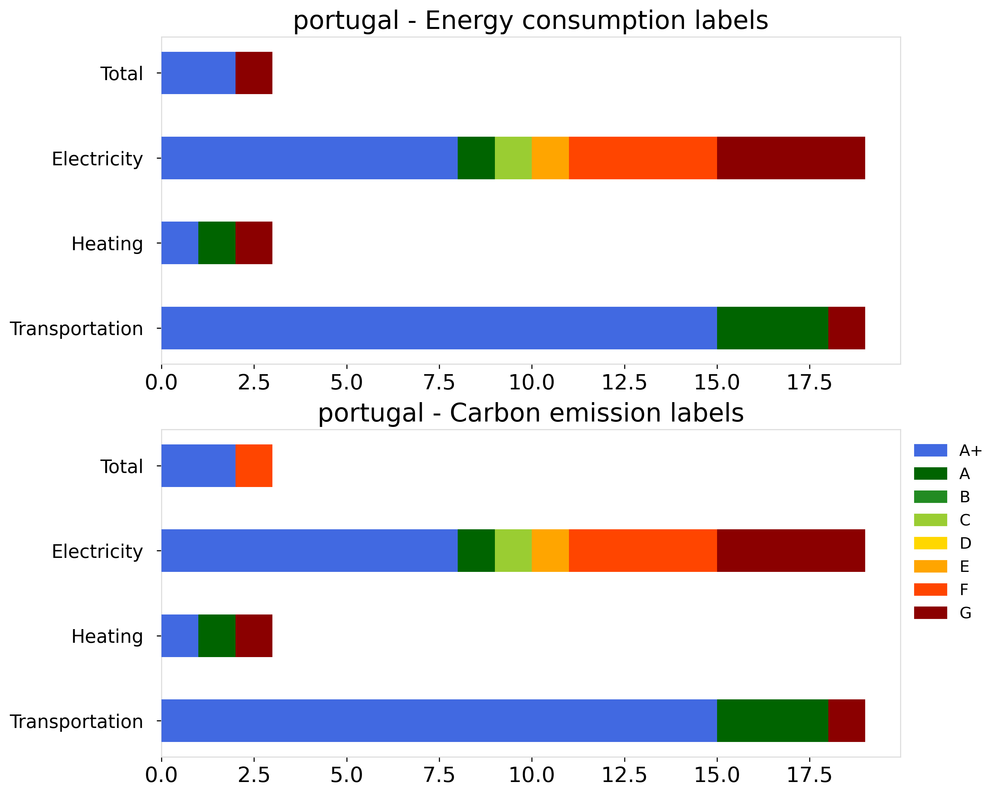

In [41]:
## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(2,1, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']
new_colors=['royalblue','darkgreen','forestgreen','yellowgreen','gold','orange','orangered','darkred']



    
for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_portugal[sector][df_portugal[sector, 'energyExpended_label'].notna()] )
      average_days=df_portugal[sector][df_portugal[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_portugal[sector][(df_portugal[sector]['energyExpended_label'] == label)
                                            & (df_portugal[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_portugal[df_portugal['electricity', 'energyExpended_label'].notna() &
                       df_portugal['heating', 'energyExpended_label'].notna() &
                       df_portugal['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[0].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot



   if sector != 'Total' :

      count_e= len(df_portugal[sector][df_portugal[sector, 'carbonEmission_label'].notna()] )
      average_days=df_portugal[sector][df_portugal[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_portugal[sector][(df_portugal[sector]['carbonEmission_label'] == label)
                                            & (df_portugal[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_portugal[df_portugal['electricity', 'carbonEmission_label'].notna() &
                       df_portugal['heating', 'carbonEmission_label'].notna() &
                       df_portugal['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[1].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot

    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)


axs[0].set_title('portugal - Energy consumption labels')
axs[1].set_title('portugal - Carbon emission labels')


electricity : number of data:  2  avergae days tracked:  228.0
heating : number of data:  0  avergae days tracked:  nan
transportation : number of data:  0  avergae days tracked:  nan
electricity : number of data:  13  avergae days tracked:  159.3846153846154
heating : number of data:  4  avergae days tracked:  127.75
transportation : number of data:  9  avergae days tracked:  63.333333333333336
electricity : number of data:  5  avergae days tracked:  62.4
heating : number of data:  0  avergae days tracked:  nan
transportation : number of data:  13  avergae days tracked:  44.84615384615385


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.3, 0.92, 'Energy consumption labels by year')

findfont: Font family ['Ubuntu'] not found. Falling back to DejaVu Sans.


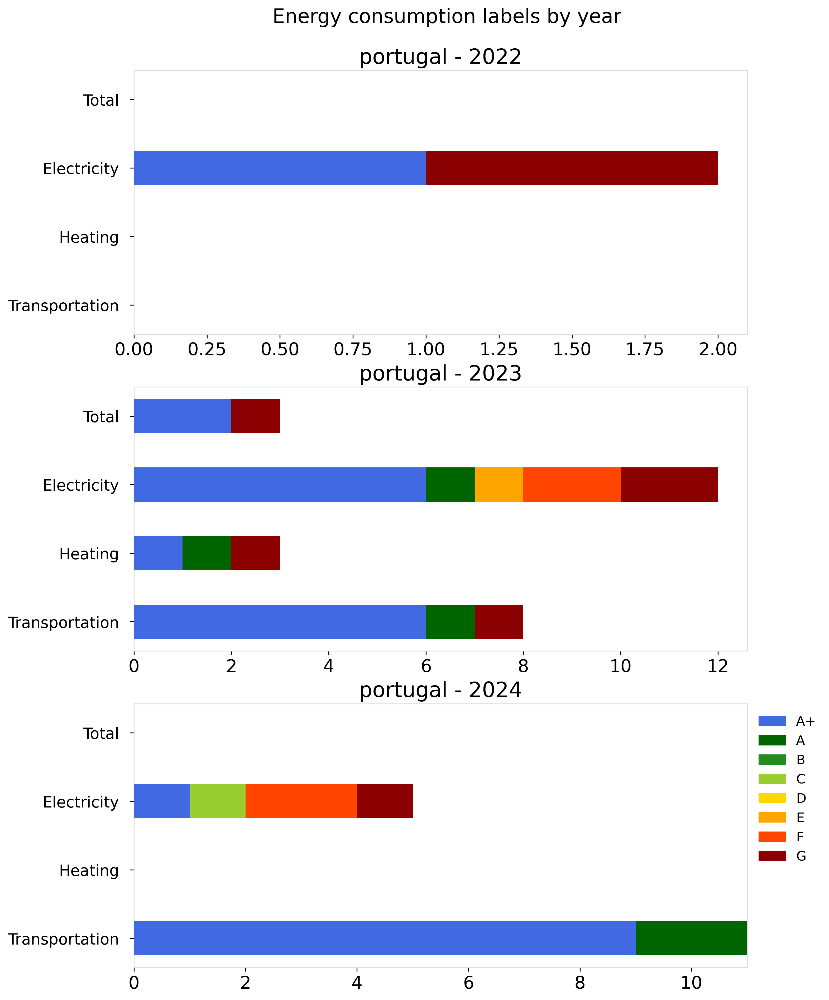

In [42]:
## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']


for k, year in enumerate([2022,2023,2024]):
 df_portugal_year= df_portugal.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_portugal_year[sector][df_portugal_year[sector, 'energyExpended_label'].notna()] )
      average_days=df_portugal_year[sector][df_portugal_year[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_portugal_year[sector][(df_portugal_year[sector]['energyExpended_label'] == label)
                                            & (df_portugal_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_portugal_year[df_portugal_year['electricity', 'energyExpended_label'].notna() &
                       df_portugal_year['heating', 'energyExpended_label'].notna() &
                       df_portugal_year['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('portugal - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)

fig.text(0.3, 0.92, 'Energy consumption labels by year', fontsize=18)

electricity : number of data:  2  avergae days tracked:  228.0
heating : number of data:  0  avergae days tracked:  nan
transportation : number of data:  0  avergae days tracked:  nan
electricity : number of data:  13  avergae days tracked:  159.3846153846154
heating : number of data:  4  avergae days tracked:  127.75
transportation : number of data:  9  avergae days tracked:  63.333333333333336
electricity : number of data:  5  avergae days tracked:  62.4
heating : number of data:  0  avergae days tracked:  nan
transportation : number of data:  13  avergae days tracked:  44.84615384615385


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:49: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.3, 0.92, 'Carbon emission labels by year')

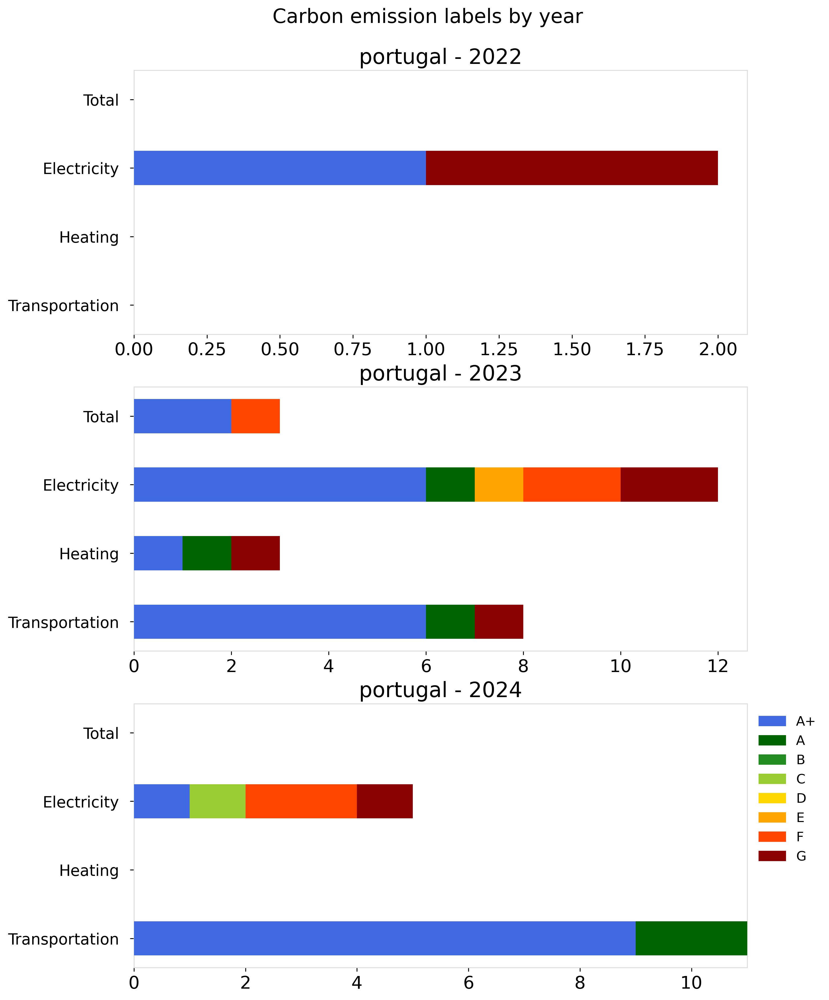

In [43]:

## carbon labels

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']



for k, year in enumerate([2022,2023,2024]):
 df_portugal_year= df_portugal.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_portugal_year[sector][df_portugal_year[sector, 'carbonEmission_label'].notna()] )
      average_days=df_portugal_year[sector][df_portugal_year[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_portugal_year[sector][(df_portugal_year[sector]['carbonEmission_label'] == label)
                                            & (df_portugal_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_portugal_year[df_portugal_year['electricity', 'carbonEmission_label'].notna() &
                       df_portugal_year['heating', 'carbonEmission_label'].notna() &
                       df_portugal_year['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('portugal - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)

fig.text(0.3, 0.92, 'Carbon emission labels by year', fontsize=18)

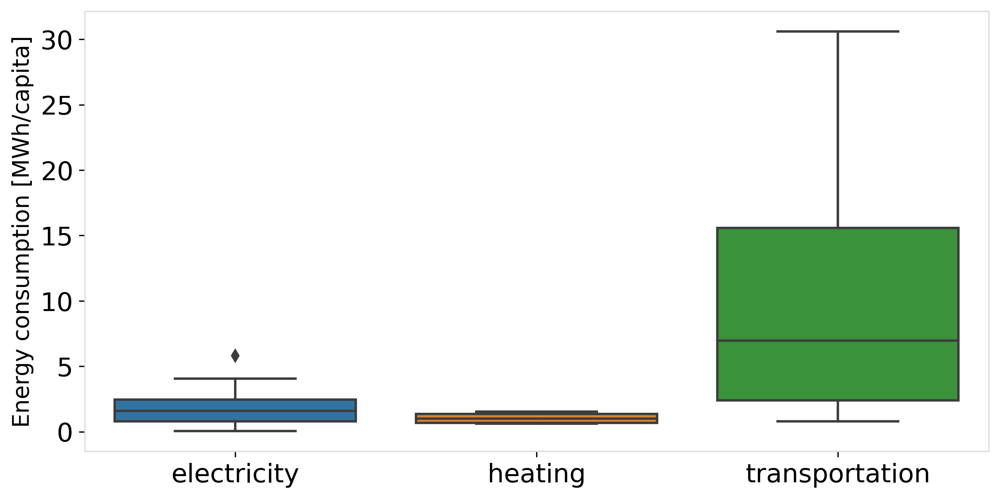

In [44]:
import seaborn as sns


portugal_average_energy={'electricity':1207.89   ,
                  'heating': 1637.29  , 
                  'transportation': 5271,  } #elec, heat, transport kWh/capita

portugal_average_emissions={'electricity':439.67  ,
                  'heating': 193.20 , 
                  'transportation': 1307,  }  #elec, heat, transport tonne/capita
# Import Data

temp=pd.DataFrame({'electricity': df_portugal.loc[:,('electricity','energyExpended_total')]*365/(
            df_portugal.loc[:,('electricity','consumptionDays_sum' )]) ,
                       'heating': df_portugal.loc[:,('heating','energyExpended_total')]*365/(
            df_portugal.loc[:,('heating','consumptionDays_sum' )]) ,
                       'transportation': df_portugal.loc[:,('transportation','energyExpended_total')]*365/(
            df_portugal.loc[:,('transportation','consumptionDays_sum')]) ,
                      })

for sector in temp.columns:
    temp[sector]=temp[sector].apply(lambda x : np.nan if x >10* portugal_average_energy[sector] else x) 
         
# Draw Plot
plt.figure(figsize=(10,5), )
box_plot=sns.boxplot( data=temp/1e3, notch=False)
 
box_plot.set_ylabel('Energy consumption [MWh/capita]', size=14)

# Decoration
#plt.title('Box plot for energy consumption', fontsize=22)
#plt.ylim(10, 40)
plt.show()



#axs[0,0].show()

/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: FixedFormatter should only be used together with FixedLocator


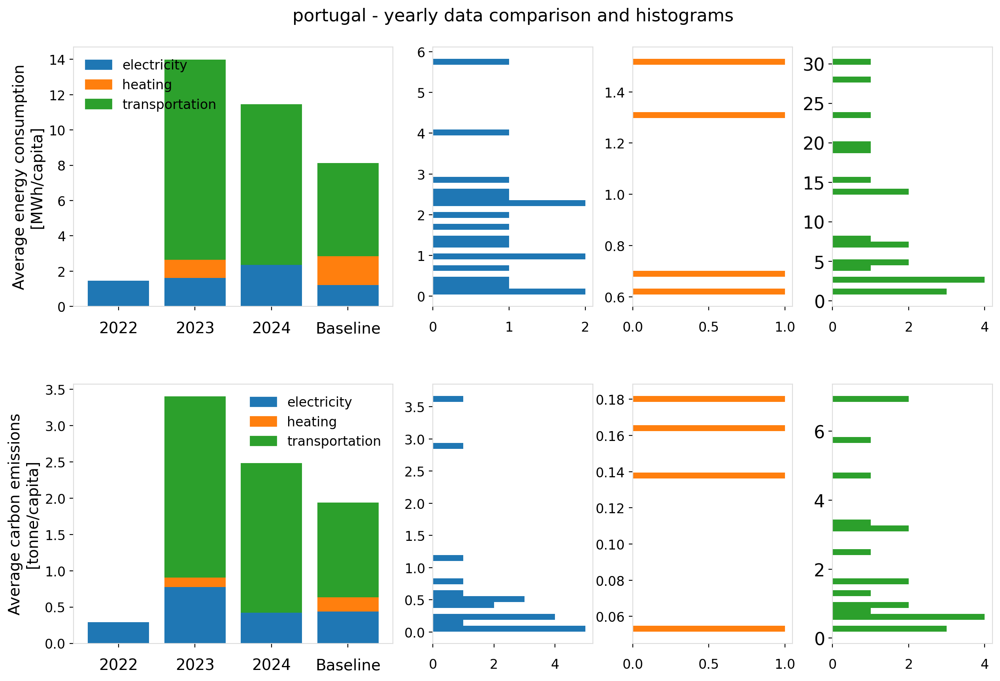

In [48]:
import math
norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
color_list=[cm.jet(norm(j),bytes=True) for j in np.arange(0.2,1,0.1) ]
new_colors=[tuple([i/255.0 for i in j]) for j in color_list]

new_colors=['royalblue','darkgreen','forestgreen','yellowgreen','gold','orange','orangered','darkred']


# Import Data

fig, axs = plt.subplots(2,4, figsize=(15,10), 
                        gridspec_kw={'width_ratios':[2,1,1,1]} ,
                        dpi=200) #, sharey=True)
fig.subplots_adjust(hspace=0.3)


index=np.arange(4)

for j,year in enumerate([2022, 2023, 2024]): 
   df = df_portugal.loc[year]
   temp_energy=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'energyExpended_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'energyExpended_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'energyExpended_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh


   temp_emissions=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'carbonEmission_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'carbonEmission_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'carbonEmission_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh




    
   # Draw Plot
   bottom=0
   bottom_1=0
   bottom_2=0
   bottom_3=0


   colors={'electricity':tab10_colors[0] ,  
        'heating': tab10_colors[1] , 
        'transportation': tab10_colors[2],  }

   
   for i , sector in enumerate(temp_energy.columns):
        ##exclude unusually high (10 times the everage) consumptions:    

       temp_energy[sector]=temp_energy[sector].apply(lambda x : np.nan if x >10* portugal_average_energy[sector]/1e3 else x) 
       temp_emissions[sector]=temp_emissions[sector].apply(lambda x : np.nan if x >10* portugal_average_emissions[sector]/1e3 else x)
         
       to_plot= temp_energy.drop([i for i in temp_energy.index if temp_energy.loc[i, sector] ==0 or
               math.isnan(temp_energy.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[0,0].bar(index[j], to_plot, bottom=bottom, color=colors[sector])
       if not to_plot is np.nan: bottom += to_plot
       
    
       to_plot= temp_emissions.drop([i for i in temp_emissions.index if temp_emissions.loc[i, sector] ==0 or
               math.isnan(temp_emissions.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[1,0].bar(index[j], to_plot, bottom=bottom_1, color=colors[sector])
       if not to_plot is np.nan: bottom_1 += to_plot
        
        
       axs[0,0].bar(index[3], portugal_average_energy[sector]/1e3,
               bottom=bottom_2, color=colors[sector])
       bottom_2 += portugal_average_energy[sector]/1e3 
        
       axs[1,0].bar(index[3], portugal_average_emissions[sector]/1e3,
               bottom=bottom_3, color=colors[sector])
       bottom_3 += portugal_average_emissions[sector]/1e3  
       
       temp=df_portugal.loc[:,(sector,'energyExpended_total' )]*365/(
            df_portugal.loc[:,(sector,'consumptionDays_sum' )]) 
       temp=temp.apply(lambda x : np.nan if x >10* portugal_average_energy[sector] else x)
    
       axs[0,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[0,i].tick_params(axis='y', labelsize=12,)
       axs[0,i+1].tick_params(axis='x', labelsize=12, pad=10,)

       temp=df_portugal.loc[:,(sector,'carbonEmission_total' )]*365/(
            df_portugal.loc[:,(sector,'consumptionDays_sum' )])
       temp=temp.apply(lambda x : np.nan if x >10* portugal_average_emissions[sector] else x)
        
       axs[1,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[1,i].tick_params(axis='y', labelsize=12,)
       axs[1,i+1].tick_params(axis='x', labelsize=12, pad=10,)



#axs[0,1].set_yticks(np.arange(0, 6.1, 3),fontsize=14)   
#axs[0,2].set_yticks(np.arange(0, 2.1, 1),fontsize=14)   
#axs[0,3].set_yticks(np.arange(0, 6.1, 3),fontsize=14)  


legend_manual=[]
for i,key in enumerate(temp_energy.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[0,0].legend(handles=legend_manual,loc='upper left', ncol=1,
           fontsize=12,frameon=False)      

legend_manual=[]
for i,key in enumerate(temp_emissions.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[1,0].legend(handles=legend_manual,loc='upper right', ncol=1,
           fontsize=12,frameon=False)      
    # Decoration


axs[0,1].set_title('portugal - yearly data comparison and histograms\n', fontsize=16)

axs[0,0].set_ylabel('Average energy consumption\n[MWh/capita]', size=14)
axs[1,0].set_ylabel('Average carbon emissions\n[tonne/capita]', size=14)

xlabels = [i for i in ['2022', '2023', '2024', 'Baseline']]    ##reverse order
for ax in  [axs[0,0], axs[1,0]]:
  ax.set_xticklabels(xlabels,fontsize=14, rotation=0,ha='center', rotation_mode='anchor')
  ax.set_xticks((np.arange(4)))    
  ax.tick_params(axis='x', labelsize=14, pad=10,)

In [60]:
## No year definition for consumptio?

##
import itertools


list_types_tr=[]
list_types_h=[]

for user, user_name in  enumerate(portugal_users):        
        for i in range(len(data[portugal_users[user]]['consumptions'])): 
         if data[portugal_users[user]]['consumptions'][i]['category'] == 'transportation':
    
           list_types_tr.append(data[portugal_users[user]]['consumptions'][i]['transportation']['transportationType'])
        
         if data[portugal_users[user]]['consumptions'][i]['category'] == 'heating':
    
           list_types_h.append(data[portugal_users[user]]['consumptions'][i]['heating']['heatingFuel'])
            


additions=['','-energyExpended', '-carbonEmissions']

list_tr= list(''.join(s) for s in itertools.product(list(set(list_types_tr)), additions)) 
list_h= list(''.join(s) for s in itertools.product(list(set(list_types_h)), additions)) 
list_el =list(''.join(s) for s in itertools.product(['default','homePhotovoltaics'], additions)) 

iterables = [
    ['electricity'],
    list_el]
index_0 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['heating'],
    list_h]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['transportation'],
    list_tr]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_0]+[list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

df_portugal_types= pd.DataFrame(index=[i for i in portugal_users], columns=index).fillna(0)


for user, user_name in  enumerate(portugal_users):
      if any(data[portugal_users[user]]['consumptions'])  :
         #print(user)  
         for i in range(len(data[portugal_users[user]]['consumptions'])):
            sector=data[portugal_users[user]]['consumptions'][i]['category'] 
            
            if data[portugal_users[user]]['consumptions'][i]['category'] == 'electricity':
                try: sector_type= data[portugal_users[user]]['consumptions'][i][sector]['electricitySource'] 
                except: sector_type= 'default' 

            if data[portugal_users[user]]['consumptions'][i]['category'] == 'transportation':
                sector_type= data[portugal_users[user]]['consumptions'][i][sector]['transportationType'] 
    
            if data[portugal_users[user]]['consumptions'][i]['category'] == 'heating':
                sector_type= data[portugal_users[user]]['consumptions'][i][sector]['heatingFuel'] 
                
            df_portugal_types.loc[portugal_users[user], (sector,sector_type) ]+=1
            try: df_portugal_types.loc[portugal_users[user], (sector, sector_type+'-energyExpended' ) ]+=(
                      data[portugal_users[user]]['consumptions'][i]['energyExpended'] )
            except: continue
            try: df_portugal_types.loc[portugal_users[user], (sector, sector_type+'-carbonEmissions' ) ]+=(
                      data[portugal_users[user]]['consumptions'][i]['carbonEmissions'] )    
            except: continue


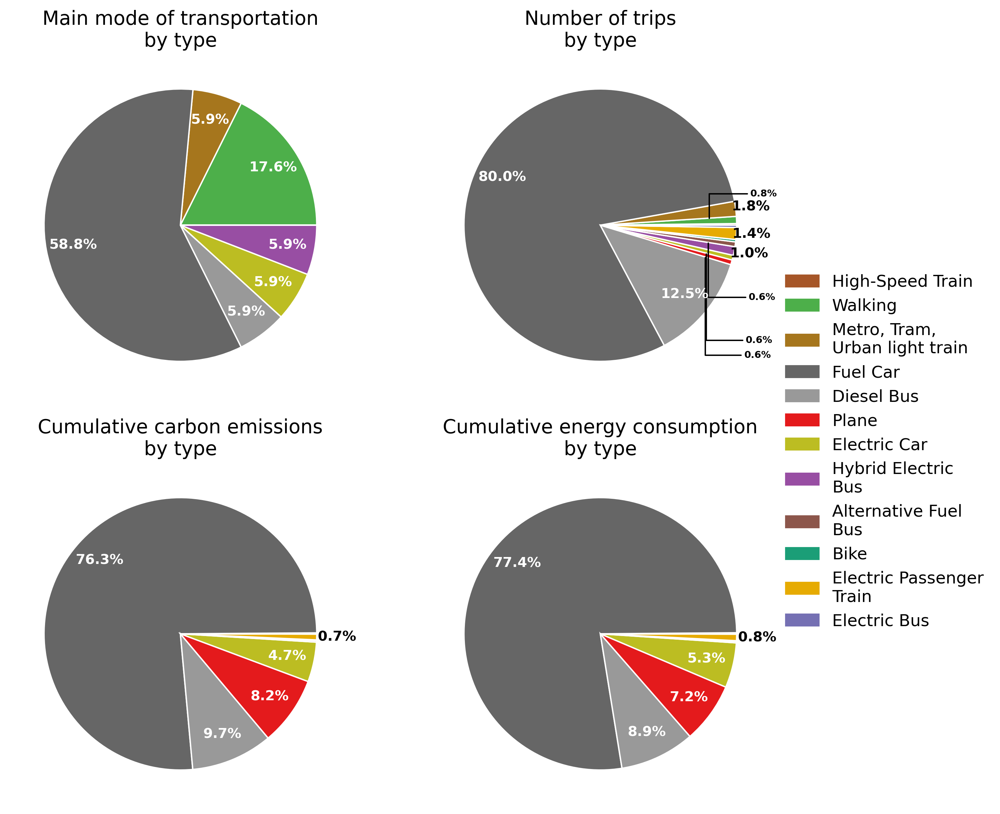

In [55]:

## TRansportation

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
#color_list= (plt.cm.Dark2.colors+plt.cm.Set1.colors)
bbox_props = dict(boxstyle="square,pad=0", fc="w", ec="w", lw=0.72)
arrowprops=dict(arrowstyle="-",connectionstyle="angle,angleA=0,angleB=90")
kw = dict(xycoords='data',textcoords='data',
          arrowprops=arrowprops, bbox=bbox_props, zorder=1)



temp=df_portugal_types['transportation']
to_drop= [i for i in df_portugal_types['transportation'].index if
                                      df_portugal_types.loc[i, 'transportation'].sum()==0 and 
                                  df_portugal_types.loc[i,('transportation' ,'walking')] == 0 ]
df_portugal_types['transportation','main_type']= temp.loc[:, [i for i in temp if '-' not in i]].idxmax(axis=1)                                                        
tr_list=[i for i in df_portugal_types['transportation'].columns if df_portugal_types['transportation'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_portugal_types['transportation','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()

rad=1
r=1
my_pie, texts, pct_txts = axs[0,0].pie(sizes, radius=r, labels=None , colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts] 
axs[0,0].set_title('Main mode of transportation\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold", zorder=3)
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.1: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt))          
        

tr_dict = {i:df_portugal_types['transportation'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=None  ,radius=r, colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts] 

axs[0,1].set_title('Number of trips\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.4: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt))      
    elif float(text.strip('%')) < 1.0: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        #print(xt, yt)
        if yt>0:
         axs[0,1].annotate(text, xy=(x,y), xytext=(xt-0.1, yt+0.15), size=7, weight="bold",**kw )
        else:
         axs[0,1].annotate(text, xy=(x,y), xytext=(xt-0.1, 2*yt-0.1), size=7, weight="bold",**kw )
    elif float(text.strip('%')) < 3: #customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_portugal_types['transportation'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=None , radius=r,colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts] 

axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.3: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.6*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.4: # customised
        t.set_text(text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.4*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("w")
        t.set_alpha(0)
        t.set_position((xt,yt))  
        axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 4*yt-5), size=7, weight="bold",**kw )

    elif float(text.strip('%')) < 3: # customised
        t.set_text(text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.15*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_portugal_types['transportation'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
explode = (0, 0, 0.01, 0, 0, 0, 0, 0, 0, 0) 

my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=None , radius=r,colors=[color_list[key] for key in labels], #explode=explode,
                wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts] 
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
counter=0
for t in (pct_txts):
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.3: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.5: #customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        axs[1,1].annotate(text, xy=(x,y-0.02), xytext=(xt-0.1, 4*yt-4), size=7, weight="bold",**kw )

    elif float(text.strip('%')) < 4: #customised
        t#.set_text(u"\u2248"+text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.15*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 
  

legend_manual=[]
nice_names={'walking': 'Walking',
 'dieselBus': 'Diesel Bus',
 'fuelCar': 'Fuel Car',
 'bike': 'Bike',
 'dieselPassengerTrain': 'Diesel Passenger\nTrain',
 'electricCar': 'Electric Car',
 'electricPassengerTrain':'Electric Passenger\nTrain',
 'hybridElectricBus':'Hybrid Electric\nBus',
 'electricScooter':'Electric Scooter',
 'alternativeFuelBus':'Alternative Fuel\nBus' ,
 'metroTramOrUrbanLightTrain': 'Metro, Tram,\nUrban light train',
 'hybridCar':'Hybrid Car',
 'otherBus':'Other Bus',
 'electricBus': 'Electric Bus',
 'electricBike': 'Electric Bike',
  'highSpeedTrain' :'High-Speed Train',
           'plane':'Plane'}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[key], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 





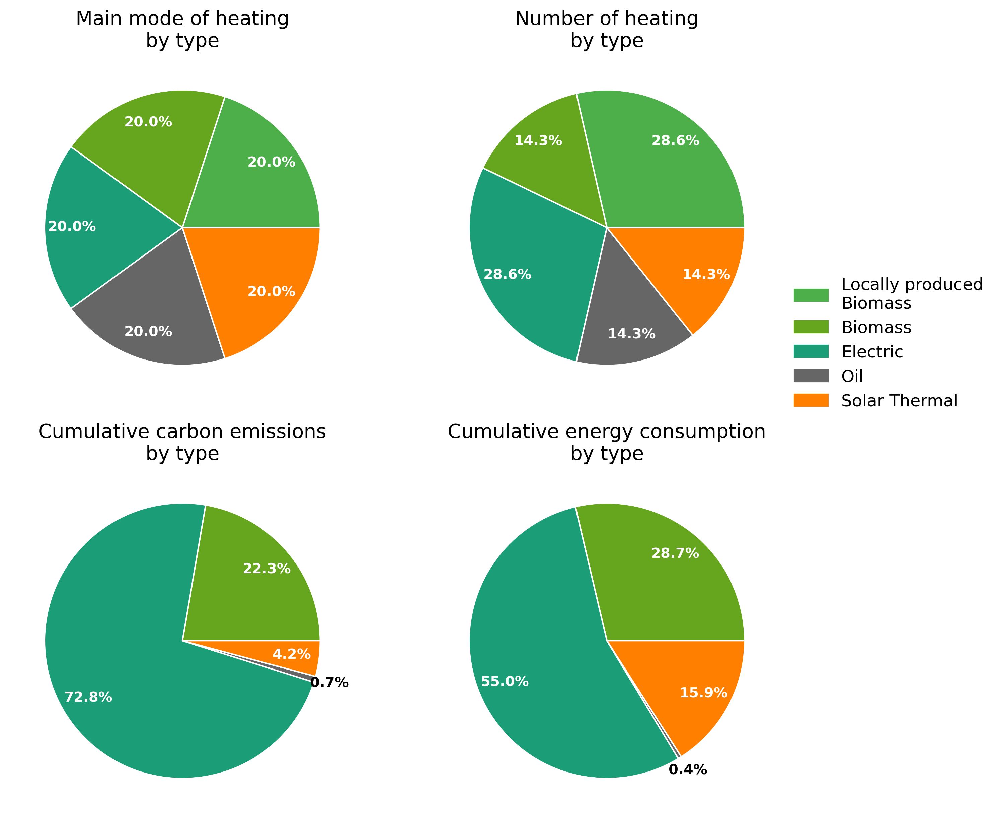

In [62]:

## heating

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']


color_list= (plt.cm.Dark2.colors+plt.cm.Set3.colors)

r=1
temp=df_portugal_types['heating']

to_drop= [i for i in df_portugal_types['heating'].index if
                                      df_portugal_types.loc[i, 'heating'].sum()==0]
df_portugal_types['heating','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]                                                         
tr_list=[i for i in df_portugal_types['heating'].columns if df_portugal_types['heating'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_portugal_types['heating','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}


labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[0,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,0].set_title('Main mode of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.1 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        if yt>-0.5:
         axs[0,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 2*yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[0,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt), size=7, weight="bold",**kw )    
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_portugal_types['heating'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[0,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,1].set_title('Number of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_portugal_types['heating'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.1 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) <0.3: 
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        if yt>-0.5:
         axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 2*yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt), size=7, weight="bold",**kw )      
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_portugal_types['heating'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.1 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.3: 
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        print(xt, yt)
        if yt>0:
         axs[1,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[1,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt-0.1), size=7, weight="bold",**kw )      
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

legend_manual=[]
nice_names={'electric':'Electric',
 'naturalGas': 'Natural Gas',
 'locallyProducedBiomass':'Locally produced\nBiomass',
 'biomass':'Biomass',
 'geothermal':'Geothermal',
 'district':'District Heating',
 'oil' :'Oil',
            'solarThermal':'Solar Thermal',
   'liquifiedPetroGas':'Liquified Petrogas' ,}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list_h[key], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 



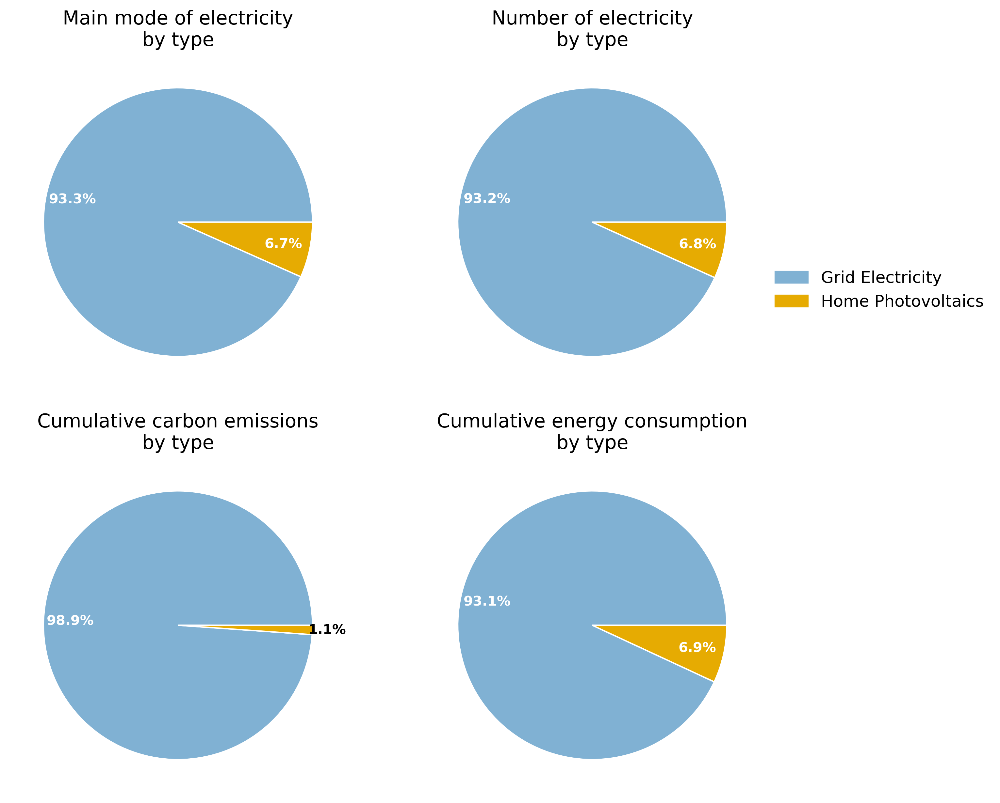

In [641]:

## electricity

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']

color_list= ((0.5019607843137255, 0.6941176470588235, 0.8274509803921568),
 #(0.4588235294117647, 0.4392156862745098, 0.7019607843137254),
 (0.9019607843137255, 0.6705882352941176, 0.00784313725490196))

temp=df_portugal_types['electricity']

to_drop= [i for i in df_portugal_types['electricity'].index if
                                      df_portugal_types.loc[i, 'electricity'].sum()==0]
df_portugal_types['electricity','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]                                                     
tr_list=[i for i in df_portugal_types['electricity'].columns if df_portugal_types['electricity'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_portugal_types['electricity','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,0].set_title('Main mode of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_portugal_types['electricity'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,1].set_title('Number of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


tr_dict = {i:df_portugal_types['electricity'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_portugal_types['electricity'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


legend_manual=[]
nice_names={'default':'Grid Electricity','homePhotovoltaics': 'Home Photovoltaics'}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[i], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 





# DENMARK

In [582]:
## denmark
def Average(lst): 
    return sum(lst) / len(lst) 

denmark_users = [i for i in list(data.keys()) if data[i]['country']=='8mgi5IR4xn9Yca4zDLtU']
len(denmark_users)


iterables = [
    ['Total'],
    ['carbonEmission_total', 'carbonEmission_label',
    'energyExpended_total', 'energyExpended_label' ,
    ]]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['electricity' , 'heating' ,'transportation'],
    ['carbonEmission_total','carbonEmission_percentage', 'carbonEmission_label', 
    'energyExpended_total','energyExpended_percentage', 'energyExpended_label' ,
    'consumptionDays','consumptionDays_sum', 'householdSize',]]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

iterables = [
    [2022, 2023, 2024],
    [i for i in denmark_users]]

df_denmark = pd.DataFrame(index=pd.MultiIndex.from_product(iterables, names=["Year", "User"]), columns=index)
#df_denmark_2024 = pd.DataFrame(index=[i for i in denmark_users], columns=index)

for category in  ['electricity' , 'heating' ,'transportation']:  
  for user, user_name in  enumerate(denmark_users):
    years= len(data[denmark_users[user]]['consumptionSummaries']) 
        
    if years>0 : 
      for year in range(years):  
         year_name= data[denmark_users[user]]['consumptionSummaries'][year]['year'] 
         #print(user)
         df_denmark.loc[(year_name,user_name),('Total','carbonEmission_total')]=data[denmark_users[user]]['consumptionSummaries'][year]['carbonEmission']['total']
         df_denmark.loc[(year_name,user_name),('Total','energyExpended_total')]=data[denmark_users[user]]['consumptionSummaries'][year]['energyExpended']['total']
         try : df_denmark.loc[(year_name,user_name),('Total','carbonEmission_label')]=data[denmark_users[user]]['consumptionSummaries'][year]['carbonEmission']['label']
         except:
            continue
         try: df_denmark.loc[(year_name,user_name),('Total','energyExpended_label')]=data[denmark_users[user]]['consumptionSummaries'][year]['energyExpended']['label']   
         except:
            continue
            
         temp=data[denmark_users[user]]['consumptionSummaries'][year]['categories']    
         for i in range(len(temp)):
           if temp[i]['category']==category : #print(temp[i])        
              #print(temp[i]) 
              df_denmark.loc[ (year_name,user_name),(category,'carbonEmission_total')] = temp[i]['carbonEmission']['total']  
              df_denmark.loc[ (year_name,user_name),(category,'carbonEmission_percentage')] = temp[i]['carbonEmission']['percentage']
              try  :
                  df_denmark.loc[(year_name,user_name),(category, 'carbonEmission_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue  
                    
              df_denmark.loc[(year_name,user_name),(category, 'energyExpended_total')] = temp[i]['energyExpended']['total']               
              df_denmark.loc[(year_name,user_name),(category, 'energyExpended_percentage')] = temp[i]['energyExpended']['percentage']
              try :
                  df_denmark.loc[(year_name,user_name),(category, 'energyExpended_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue
                    
              df_denmark.loc[ (year_name,user_name),(category, 'consumptionDays')] = len(temp[i]['consumptionDays'])
              df_denmark.loc[ (year_name,user_name),(category,'consumptionDays_sum')] = (
                   sum(temp[i]['consumptionDays'].values()) if  
                  sum(temp[i]['consumptionDays'].values())!=0 else 1)  ##avoid divisio by zero

            
            
              df_denmark.loc[ (year_name,user_name),(category, 'householdSize')] = 1
                
              if category == 'transportation':
                 try:  

                   householdSize= Average([data[denmark_users[user]]['consumptions'][i]['transportation']['privateVehicleOccupancy']
                             for i in range(len(data[denmark_users[user]]['consumptions'])) if
                            'transportation' in data[denmark_users[user]]['consumptions'][i].keys()
                            and 'privateVehicleOccupancy' in 
                            data[denmark_users[user]]['consumptions'][i]['transportation'].keys()] )
                   df_denmark.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize

                 except:
                      continue  
                
              if   category =='heating' or category =='electricity' :
                 #print(denmark_users[user])
                 try:  
                   householdSize=  Average([data[denmark_users[user]]['consumptions'][i]['electricity']['householdSize']
                                            for i in range(len(data[denmark_users[user]]['consumptions'])) if
                       'electricity' in data[denmark_users[user]]['consumptions'][i].keys()]) 
                   df_denmark.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                   

                 except:  
                  try:      
                        householdSize=  Average([data[denmark_users[user]]['consumptions'][i]['heating']['householdSize']
                                            for i in range(len(data[denmark_users[user]]['consumptions'])) if
                           'heating' in data[denmark_users[user]]['consumptions'][i].keys()]) 
                        df_denmark.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                       

                  except:
                      continue  



electricity : number of data:  18  avergae days tracked:  102.61111111111111
electricity : number of data:  18  avergae days tracked:  102.61111111111111
heating : number of data:  6  avergae days tracked:  91.83333333333333
heating : number of data:  6  avergae days tracked:  91.83333333333333
transportation : number of data:  13  avergae days tracked:  82.46153846153847
transportation : number of data:  13  avergae days tracked:  82.46153846153847


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:74: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.5, 1.0, 'denmark - Carbon emission labels')

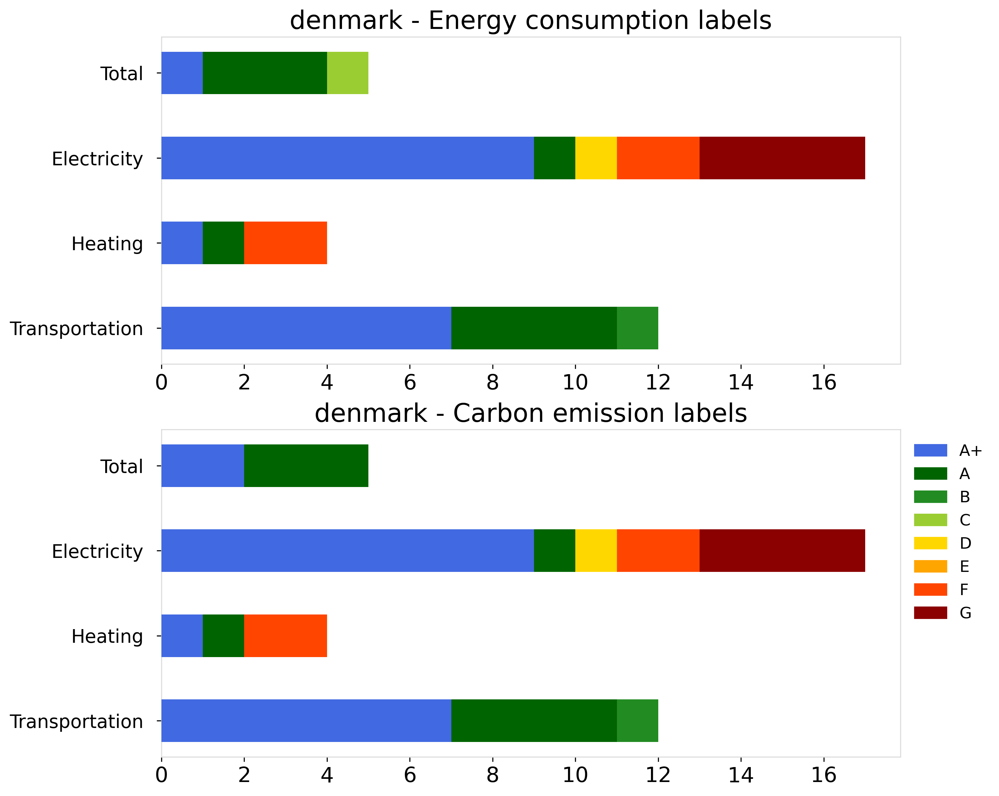

In [584]:
## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(2,1, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']



    
for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_denmark[sector][df_denmark[sector, 'energyExpended_label'].notna()] )
      average_days=df_denmark[sector][df_denmark[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_denmark[sector][(df_denmark[sector]['energyExpended_label'] == label)
                                            & (df_denmark[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_denmark[df_denmark['electricity', 'energyExpended_label'].notna() &
                       df_denmark['heating', 'energyExpended_label'].notna() &
                       df_denmark['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[0].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot



   if sector != 'Total' :

      count_e= len(df_denmark[sector][df_denmark[sector, 'carbonEmission_label'].notna()] )
      average_days=df_denmark[sector][df_denmark[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_denmark[sector][(df_denmark[sector]['carbonEmission_label'] == label)
                                            & (df_denmark[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_denmark[df_denmark['electricity', 'carbonEmission_label'].notna() &
                       df_denmark['heating', 'carbonEmission_label'].notna() &
                       df_denmark['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[1].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot

    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)


axs[0].set_title('denmark - Energy consumption labels')
axs[1].set_title('denmark - Carbon emission labels')







electricity : number of data:  3  avergae days tracked:  95.33333333333333
heating : number of data:  1  avergae days tracked:  92.0
transportation : number of data:  0  avergae days tracked:  nan
electricity : number of data:  12  avergae days tracked:  116.91666666666667
heating : number of data:  3  avergae days tracked:  132.66666666666666
transportation : number of data:  5  avergae days tracked:  157.2
electricity : number of data:  3  avergae days tracked:  52.666666666666664
heating : number of data:  2  avergae days tracked:  30.5
transportation : number of data:  8  avergae days tracked:  35.75


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.3, 0.95, 'Energy consumption labels by year')

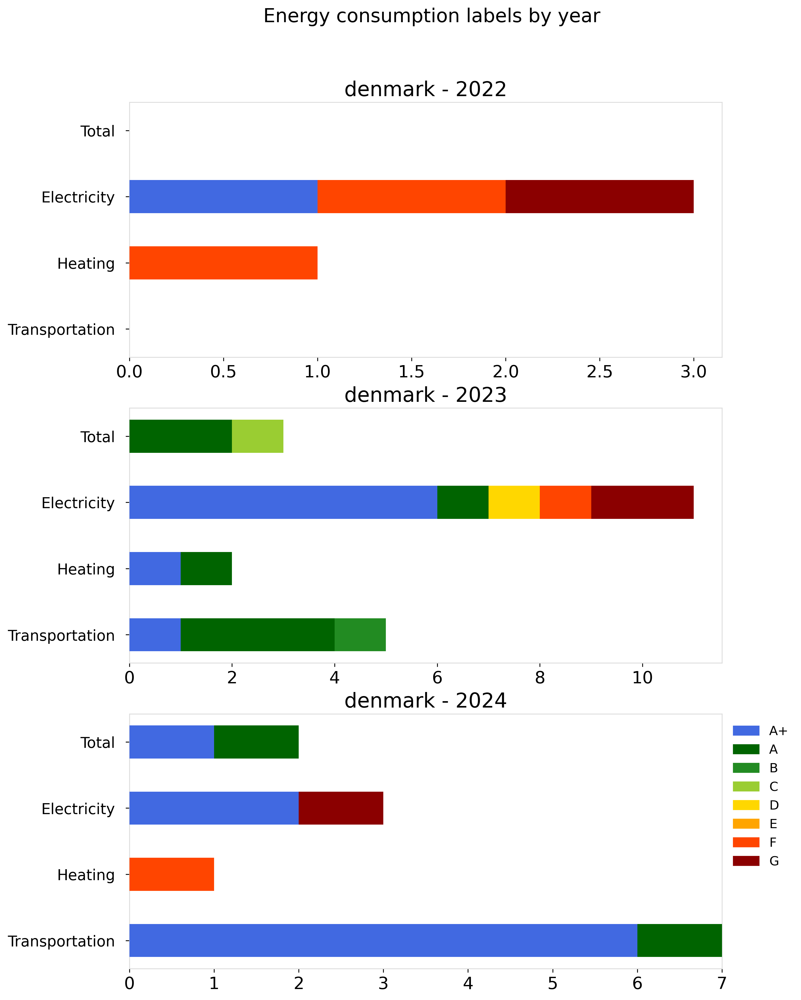

In [585]:
## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']


for k, year in enumerate([2022,2023,2024]):
 df_denmark_year= df_denmark.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_denmark_year[sector][df_denmark_year[sector, 'energyExpended_label'].notna()] )
      average_days=df_denmark_year[sector][df_denmark_year[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_denmark_year[sector][(df_denmark_year[sector]['energyExpended_label'] == label)
                                            & (df_denmark_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_denmark_year[df_denmark_year['electricity', 'energyExpended_label'].notna() &
                       df_denmark_year['heating', 'energyExpended_label'].notna() &
                       df_denmark_year['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('denmark - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)

fig.text(0.3, 0.95, 'Energy consumption labels by year', fontsize=18)








electricity : number of data:  3  avergae days tracked:  95.33333333333333
heating : number of data:  1  avergae days tracked:  92.0
transportation : number of data:  0  avergae days tracked:  nan
electricity : number of data:  12  avergae days tracked:  116.91666666666667
heating : number of data:  3  avergae days tracked:  132.66666666666666
transportation : number of data:  5  avergae days tracked:  157.2
electricity : number of data:  3  avergae days tracked:  52.666666666666664
heating : number of data:  2  avergae days tracked:  30.5
transportation : number of data:  8  avergae days tracked:  35.75


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:49: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.4, 0.95, 'Carbon emission labels by year')

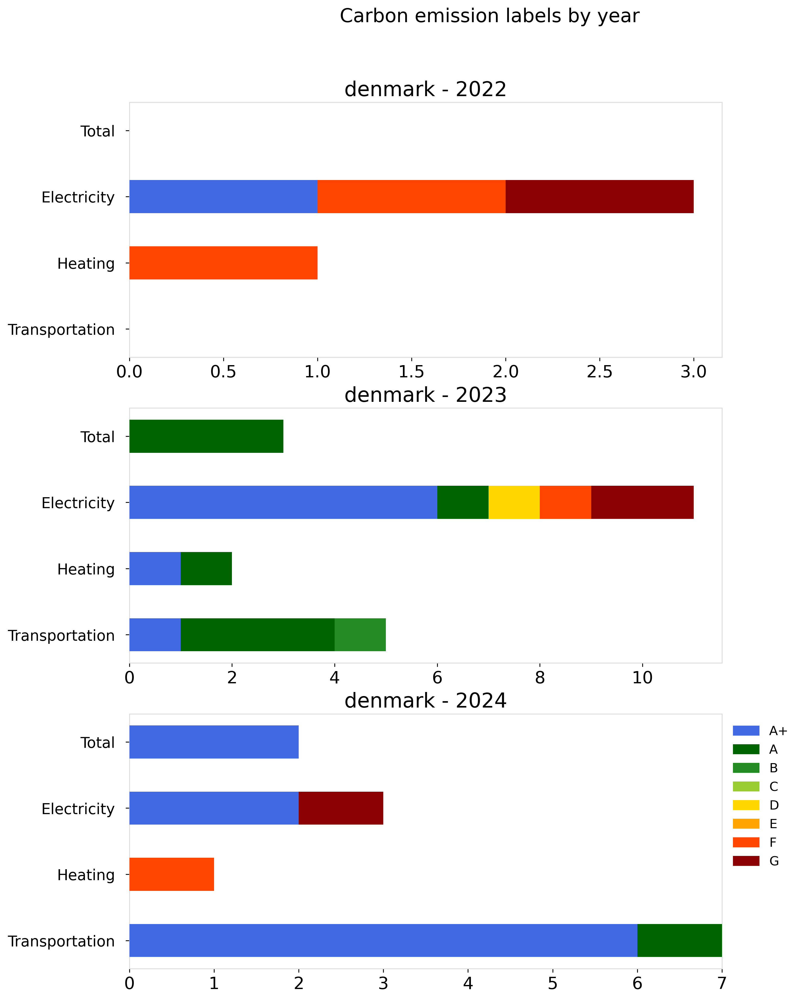

In [586]:
## carbon labels

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']



for k, year in enumerate([2022,2023,2024]):
 df_denmark_year= df_denmark.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_denmark_year[sector][df_denmark_year[sector, 'carbonEmission_label'].notna()] )
      average_days=df_denmark_year[sector][df_denmark_year[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_denmark_year[sector][(df_denmark_year[sector]['carbonEmission_label'] == label)
                                            & (df_denmark_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_denmark_year[df_denmark_year['electricity', 'carbonEmission_label'].notna() &
                       df_denmark_year['heating', 'carbonEmission_label'].notna() &
                       df_denmark_year['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('denmark - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)

fig.text(0.4, 0.95, 'Carbon emission labels by year', fontsize=18)


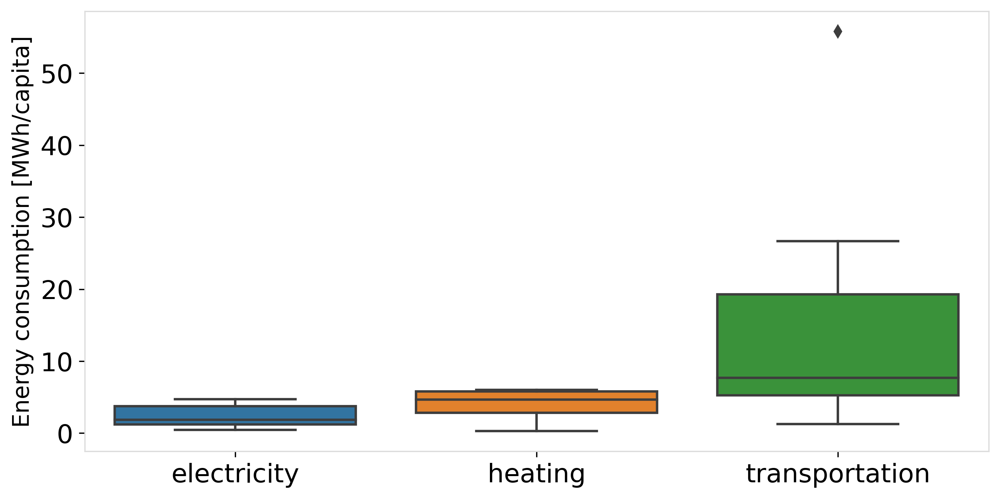

In [625]:
import seaborn as sns
# Import Data

denmark_average_energy={'electricity': 1822.06    ,
                  'heating': 6918.50   , 
                  'transportation': 7145,  } #elec, heat, transport kWh/capita

denmark_average_emissions={'electricity':349.84    ,
                  'heating': 1480.56  , 
                  'transportation': 1764,  }  #elec, heat, transport tonne/capita

temp=pd.DataFrame({'electricity': df_denmark.loc[:,('electricity','energyExpended_total')]*365/(
            df_denmark.loc[:,('electricity','consumptionDays_sum' )]) ,
                       'heating': df_denmark.loc[:,('heating','energyExpended_total')]*365/(
            df_denmark.loc[:,('heating','consumptionDays_sum' )]) ,
                       'transportation': df_denmark.loc[:,('transportation','energyExpended_total')]*365/(
            df_denmark.loc[:,('transportation','consumptionDays_sum')]) ,
                      })

for sector in temp.columns:
    temp[sector]=temp[sector].apply(lambda x : np.nan if x >10* denmark_average_energy[sector] else x) 
         
# Draw Plot
plt.figure(figsize=(10,5), )
box_plot=sns.boxplot( data=temp/1e3, notch=False)
box_plot.set_ylabel('Energy consumption [MWh/capita]', size=14)

# Decoration
#plt.title('Box plot for energy consumption', fontsize=22)
#plt.ylim(10, 40)
plt.show()



#axs[0,0].show()

In [590]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
color_list=[cm.jet(norm(j),bytes=True) for j in np.arange(0.2,1,0.1) ]
new_colors=[tuple([i/255.0 for i in j]) for j in color_list]

new_colors=['royalblue','darkgreen','forestgreen','yellowgreen','gold','orange','orangered','darkred']


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:121: UserWarning: FixedFormatter should only be used together with FixedLocator


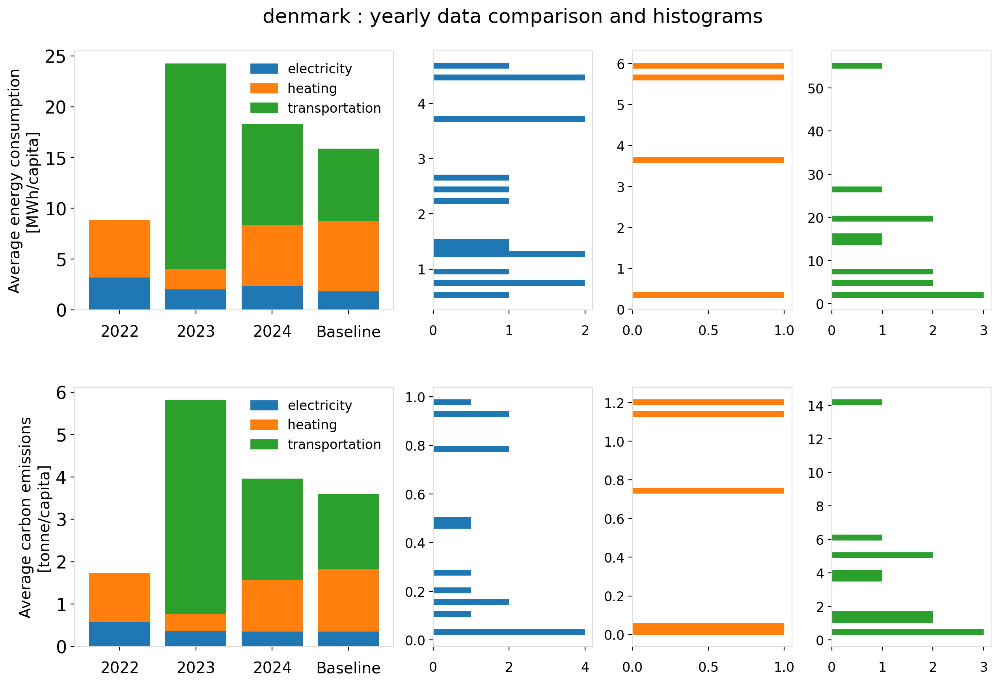

In [621]:
# Import Data

fig, axs = plt.subplots(2,4, figsize=(15,10), 
                        gridspec_kw={'width_ratios':[2,1,1,1]} ,
                        dpi=200) #, sharey=True)
fig.subplots_adjust(hspace=0.3)


index=np.arange(4)

for j,year in enumerate([2022, 2023, 2024]): 
   df = df_denmark.loc[year]
   temp_energy=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'energyExpended_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'energyExpended_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'energyExpended_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh


   temp_emissions=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'carbonEmission_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'carbonEmission_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'carbonEmission_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh




    
   # Draw Plot
   bottom=0
   bottom_1=0
   bottom_2=0
   bottom_3=0


   colors={'electricity':tab10_colors[0] ,  
        'heating': tab10_colors[1] , 
        'transportation': tab10_colors[2],  }

   
   for i , sector in enumerate(temp_energy.columns):
        ##exclude unusually high (10 times the everage) consumptions:    

       temp_energy[sector]=temp_energy[sector].apply(lambda x : np.nan if x >10* denmark_average_energy[sector]/1e3 else x) 
       temp_emissions[sector]=temp_emissions[sector].apply(lambda x : np.nan if x >10* denmark_average_emissions[sector]/1e3 else x)
         
       to_plot= temp_energy.drop([i for i in temp_energy.index if temp_energy.loc[i, sector] ==0 or
               math.isnan(temp_energy.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[0,0].bar(index[j], to_plot, bottom=bottom, color=colors[sector])
       if not to_plot is np.nan: bottom += to_plot
       
    
       to_plot= temp_emissions.drop([i for i in temp_emissions.index if temp_emissions.loc[i, sector] ==0 or
               math.isnan(temp_emissions.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[1,0].bar(index[j], to_plot, bottom=bottom_1, color=colors[sector])
       if not to_plot is np.nan: bottom_1 += to_plot
        
        
       axs[0,0].bar(index[3], denmark_average_energy[sector]/1e3,
               bottom=bottom_2, color=colors[sector])
       bottom_2 += denmark_average_energy[sector]/1e3 
        
       axs[1,0].bar(index[3], denmark_average_emissions[sector]/1e3,
               bottom=bottom_3, color=colors[sector])
       bottom_3 += denmark_average_emissions[sector]/1e3  
       
       temp=df_denmark.loc[:,(sector,'energyExpended_total' )]*365/(
            df_denmark.loc[:,(sector,'consumptionDays_sum' )]) 
       temp=temp.apply(lambda x : np.nan if x >10* denmark_average_energy[sector] else x)
    
       axs[0,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[0,i+1].tick_params(axis='y', labelsize=12,)
       axs[0,i+1].tick_params(axis='x', labelsize=12, pad=10,)

       temp=df_denmark.loc[:,(sector,'carbonEmission_total' )]*365/(
            df_denmark.loc[:,(sector,'consumptionDays_sum' )])
       temp=temp.apply(lambda x : np.nan if x >10* denmark_average_emissions[sector] else x)
        
       axs[1,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[1,i+1].tick_params(axis='y', labelsize=12,)
       axs[1,i+1].tick_params(axis='x', labelsize=12, pad=10,)



#axs[0,1].set_yticks(np.arange(0, 6.1, 3),fontsize=14)   
#axs[0,2].set_yticks(np.arange(0, 2.1, 1),fontsize=14)   
#axs[0,3].set_yticks(np.arange(0, 6.1, 3),fontsize=14)  


legend_manual=[]
for i,key in enumerate(temp_energy.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[0,0].legend(handles=legend_manual,loc='upper right', ncol=1,
           fontsize=12,frameon=False)      

legend_manual=[]
for i,key in enumerate(temp_emissions.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[1,0].legend(handles=legend_manual,loc='upper right', ncol=1,
           fontsize=12,frameon=False)      
    # Decoration


axs[0,1].set_title('denmark : yearly data comparison and histograms\n', fontsize=18)

axs[0,0].set_ylabel('Average energy consumption\n[MWh/capita]', size=14)
axs[1,0].set_ylabel('Average carbon emissions\n[tonne/capita]', size=14)


xlabels = [i for i in ['2022', '2023', '2024', 'Baseline']]    ##reverse order
for ax in  [axs[0,0], axs[1,0]]:
  ax.set_xticklabels(xlabels,fontsize=14, rotation=0,ha='center', rotation_mode='anchor')
  ax.set_xticks((np.arange(4)))    
  ax.tick_params(axis='x', labelsize=14, pad=10,)

In [251]:
## No year definition for consumptio?

##
import itertools


list_types_tr=[]
list_types_h=[]

for user, user_name in  enumerate(denmark_users):        
        for i in range(len(data[denmark_users[user]]['consumptions'])): 
         if data[denmark_users[user]]['consumptions'][i]['category'] == 'transportation':
    
           list_types_tr.append(data[denmark_users[user]]['consumptions'][i]['transportation']['transportationType'])
        
         if data[denmark_users[user]]['consumptions'][i]['category'] == 'heating':
    
           list_types_h.append(data[denmark_users[user]]['consumptions'][i]['heating']['heatingFuel'])
            


additions=['','-energyExpended', '-carbonEmissions']

list_tr= list(''.join(s) for s in itertools.product(list(set(list_types_tr)), additions)) 
list_h= list(''.join(s) for s in itertools.product(list(set(list_types_h)), additions)) 
list_el =list(''.join(s) for s in itertools.product(['default','homePhotovoltaics'], additions)) 

iterables = [
    ['electricity'],
    list_el]
index_0 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['heating'],
    list_h]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['transportation'],
    list_tr]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_0]+[list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

df_denmark_types= pd.DataFrame(index=[i for i in denmark_users], columns=index).fillna(0)


for user, user_name in  enumerate(denmark_users):
      if any(data[denmark_users[user]]['consumptions'])  :
         #print(user)  
         for i in range(len(data[denmark_users[user]]['consumptions'])):
            sector=data[denmark_users[user]]['consumptions'][i]['category'] 
            
            if data[denmark_users[user]]['consumptions'][i]['category'] == 'electricity':
                try: sector_type= data[denmark_users[user]]['consumptions'][i][sector]['electricitySource'] 
                except: sector_type= 'default' 

            if data[denmark_users[user]]['consumptions'][i]['category'] == 'transportation':
                sector_type= data[denmark_users[user]]['consumptions'][i][sector]['transportationType'] 
    
            if data[denmark_users[user]]['consumptions'][i]['category'] == 'heating':
                sector_type= data[denmark_users[user]]['consumptions'][i][sector]['heatingFuel'] 
                
            df_denmark_types.loc[denmark_users[user], (sector,sector_type) ]+=1
            try: df_denmark_types.loc[denmark_users[user], (sector, sector_type+'-energyExpended' ) ]+=(
                      data[denmark_users[user]]['consumptions'][i]['energyExpended'] )
            except: continue
            try: df_denmark_types.loc[denmark_users[user], (sector, sector_type+'-carbonEmissions' ) ]+=(
                      data[denmark_users[user]]['consumptions'][i]['carbonEmissions'] )    
            except: continue

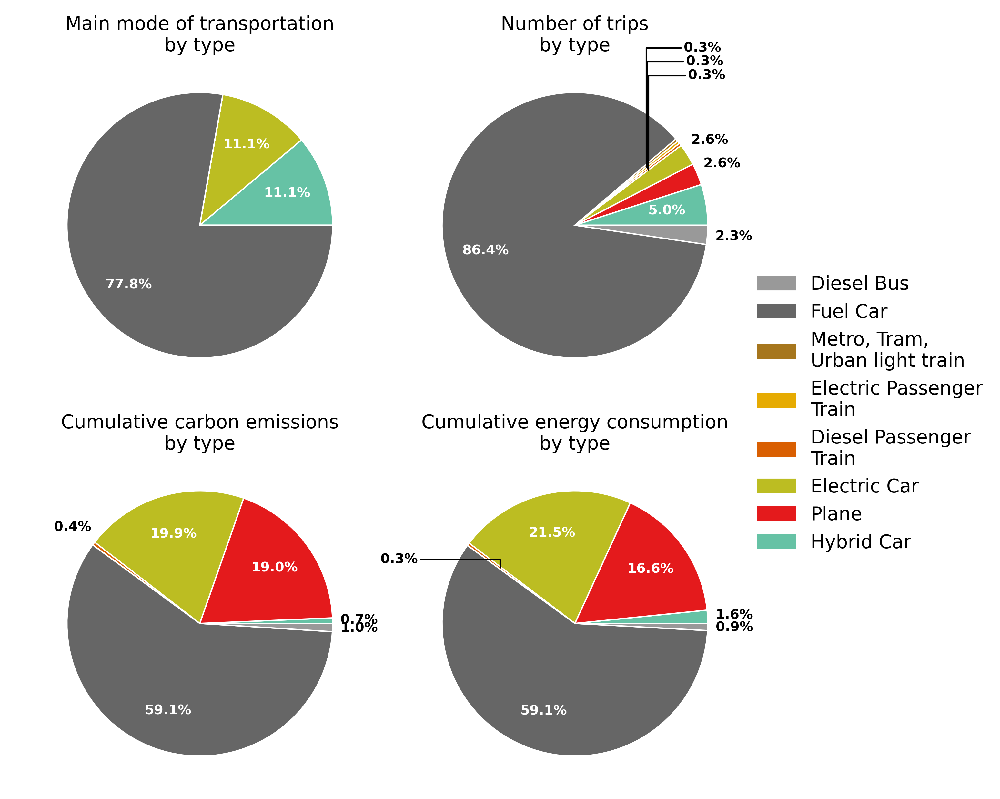

In [252]:
## TRansportation

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
#color_list= (plt.cm.Dark2.colors+plt.cm.Set1.colors)
bbox_props = dict(boxstyle="square,pad=0", fc="w", ec="w", lw=0.102)
arrowprops=dict(arrowstyle="-",connectionstyle="angle,angleA=0,angleB=90")
kw = dict(xycoords='data',textcoords='data',
          arrowprops=arrowprops, bbox=bbox_props, zorder=1)

fig.subplots_adjust(wspace=0)



temp=df_denmark_types['transportation']
to_drop= [i for i in df_denmark_types['transportation'].index if
                                      df_denmark_types.loc[i, 'transportation'].sum()==0 ]#and 
                                  #df_denmark_types.loc[i,('transportation' ,'walking')] == 0 ]
df_denmark_types['transportation','main_type']= temp.loc[:, [i for i in temp if '-' not in i]].idxmax(axis=1)                                                        
tr_list=[i for i in df_denmark_types['transportation'].columns if df_denmark_types['transportation'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_denmark_types['transportation','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

                                                         

tr_list=[i for i in df_denmark_types['transportation'].columns if df_denmark_types['transportation'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_denmark_types['transportation','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}


labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()

r=1
rad=1
my_pie, texts, pct_txts = axs[0,0].pie(sizes, radius=r, labels=None , colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
[text.set_alpha(0) for text in texts] 

axs[0,0].set_title('Main mode of transportation\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold", zorder=3)
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.1: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt))          
        

tr_dict = {i:df_denmark_types['transportation'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=None  ,radius=r, colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
[text.set_alpha(0) for text in texts] 

axs[0,1].set_title('Number of trips\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.1: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.4: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        #print(xt, yt)
        if yt>0:
         axs[0,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt*4-2.8), size=10, weight="bold",**kw )
        else:
         axs[0,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt-0.1), size=10, weight="bold",**kw )
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_denmark_types['transportation'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=None , radius=r,colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
[text.set_alpha(0) for text in texts] 

axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.1: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.6*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) <0.4: # customised
        t.set_text(text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.4*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("w")
        t.set_alpha(0)
        t.set_position((xt,yt))  
        axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt+0.1), size=10, weight="bold",**kw )

    elif float(text.strip('%')) < 3: # customised
        t.set_text(text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_denmark_types['transportation'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
explode = (0, 0, 0.01, 0, 0, 0, 0, 0, 0, 0) 

my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=None , radius=r,colors=[color_list[key] for key in labels], #explode=explode,
                wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
[text.set_alpha(0) for text in texts] 
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
counter=0
for t in (pct_txts):
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.1: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.4: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        axs[1,1].annotate(text, xy=(x,y-0.02), xytext=(xt-0.5, yt-0.5), size=10, weight="bold",**kw )

    elif float(text.strip('%')) < 4: # customised
        t#.set_text(u"\u2248"+text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 
        
        
labels = [i for i in  tr_dict.keys()]
  

legend_manual=[]
nice_names={'walking': 'Walking',
 'dieselBus': 'Diesel Bus',
 'fuelCar': 'Fuel Car',
 'bike': 'Bike',
 'dieselPassengerTrain': 'Diesel Passenger\nTrain',
 'electricCar': 'Electric Car',
 'electricPassengerTrain':'Electric Passenger\nTrain',
 'hybridElectricBus':'Hybrid Electric\nBus',
 'electricScooter':'Electric Scooter',
 'alternativeFuelBus':'Alternative Fuel\nBus' ,
 'metroTramOrUrbanLightTrain': 'Metro, Tram,\nUrban light train',
 'hybridCar':'Hybrid Car',
 'otherBus':'Other Bus',
 'electricBus': 'Electric Bus',
 'electricBike': 'Electric Bike',
 'plane':'Plane'          }
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[key], label=nice_names[key]))
plt.legend(handles=legend_manual[::-1],loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=14,frameon=False) 


In [627]:
data['YscRg5jjvZhhBtO2Nbgb3759qQH2']['consumptions']

[{'createdAt': {'_seconds': 1709210446, '_nanoseconds': 646000000},
  'electricity': {'endDate': {'_seconds': 1677542400, '_nanoseconds': 0},
   'householdSize': 3,
   'startDate': {'_seconds': 1675209600, '_nanoseconds': 0},
   'electricitySource': 'default'},
  'category': 'electricity',
  'value': 518.67,
  'carbonEmissions': 36.134009999999996,
  'energyExpended': 172.89,
  'version': '1.0.2',
  'updatedAt': {'_seconds': 1709210451, '_nanoseconds': 362000000}},
 {'createdAt': {'_seconds': 1709211382, '_nanoseconds': 962000000},
  'category': 'transportation',
  'value': 16093.44,
  'transportation': {'dateOfTravelEnd': {'_seconds': 1709211299,
    '_nanoseconds': 967000000},
   'dateOfTravel': {'_seconds': 1675256040, '_nanoseconds': 0},
   'privateVehicleOccupancy': 1,
   'transportationType': 'electricCar'},
  'carbonEmissions': 1184.477184,
  'energyExpended': 5671.328256,
  'version': '1.0.2',
  'updatedAt': {'_seconds': 1709211386, '_nanoseconds': 612000000}}]

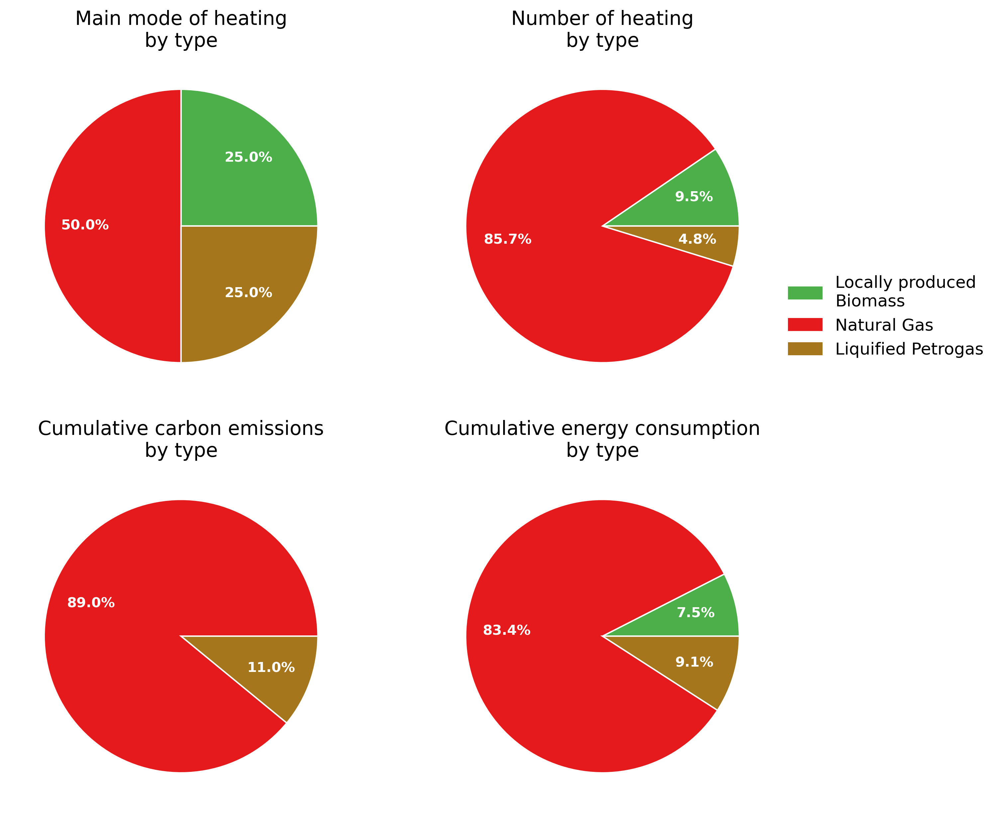

In [246]:

## heating

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']


r=1
temp=df_denmark_types['heating']

to_drop= [i for i in df_denmark_types['heating'].index if
                                      df_denmark_types.loc[i, 'heating'].sum()==0]
df_denmark_types['heating','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]                                                         
tr_list=[i for i in df_denmark_types['heating'].columns if df_denmark_types['heating'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_denmark_types['heating','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}




labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[0,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
axs[0,0].set_title('Main mode of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        if yt>-0.5:
         axs[0,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 2*yt+0.1), size=10, weight="bold",**kw )
        else:
         axs[0,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt), size=10, weight="bold",**kw )    
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_denmark_types['heating'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[0,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
axs[0,1].set_title('Number of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_denmark_types['heating'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.1 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0: 
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        if yt>-0.5:
         axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 2*yt+0.1), size=10, weight="bold",**kw )
        else:
         axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt), size=10, weight="bold",**kw )      
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_denmark_types['heating'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0: 
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        print(xt, yt)
        if yt>0:
         axs[1,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt+0.1), size=10, weight="bold",**kw )
        else:
         axs[1,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt-0.1), size=10, weight="bold",**kw )      
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

legend_manual=[]
nice_names={'electric':'Electric',
 'naturalGas': 'Natural Gas',
 'locallyProducedBiomass':'Locally produced\nBiomass',
 'biomass':'Biomass',
 'geothermal':'Geothermal',
 'district':'District Heating',
 'oil' :'Oil',
   'liquifiedPetroGas':'Liquified Petrogas' ,}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list_h[key], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 



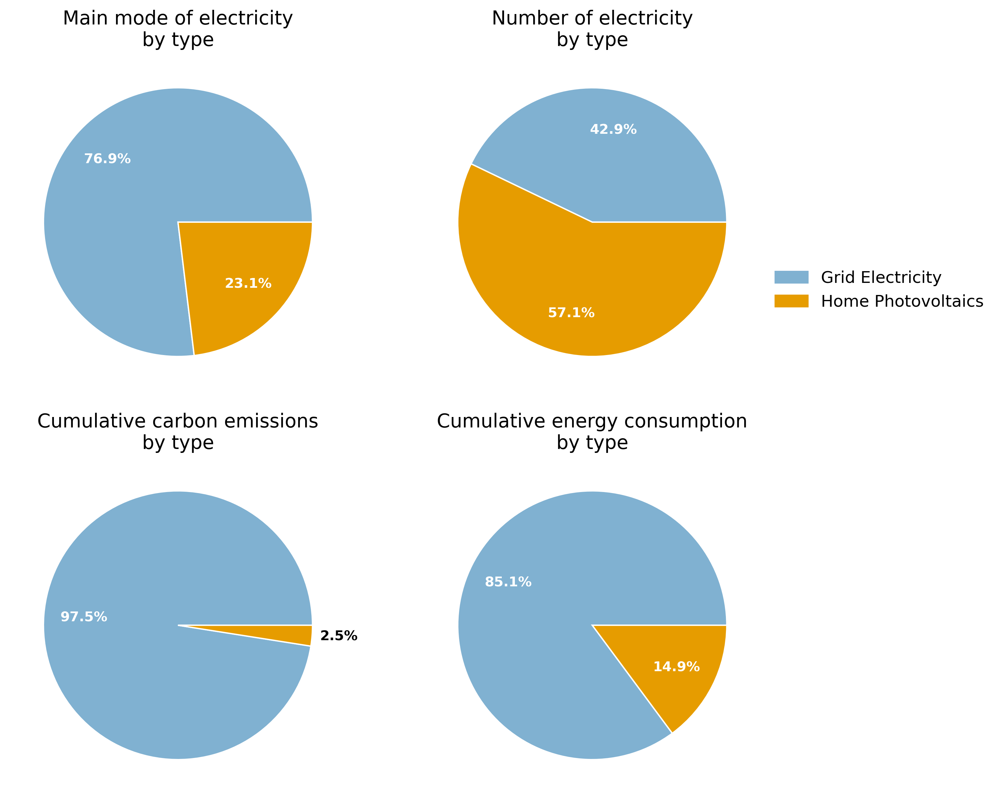

In [1369]:

## electricity

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']

color_list= ((0.501960108431310255, 0.694111064100588235, 0.82104509803921568),
 #(0.458823529411106410, 0.43921568621045098, 0.1001960108431310254),
 (0.901960108431310255, 0.610058823529411106, 0.0010843131025490196))

temp=df_denmark_types['electricity']
to_drop= [i for i in df_denmark_types['electricity'].index if
                                      df_denmark_types.loc[i, 'electricity'].sum()==0]
df_denmark_types['electricity','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]                                                     
tr_list=[i for i in df_denmark_types['electricity'].columns if df_denmark_types['electricity'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_denmark_types['electricity','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}
                                                         


labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
axs[0,0].set_title('Main mode of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_denmark_types['electricity'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
axs[0,1].set_title('Number of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


tr_dict = {i:df_denmark_types['electricity'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_denmark_types['electricity'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.7)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


legend_manual=[]
nice_names={'default':'Grid Electricity','homePhotovoltaics': 'Home Photovoltaics'}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[i], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 



# THE UK (England)

In [199]:
## england
def Average(lst): 
    return sum(lst) / len(lst) 

england_users = [i for i in list(data.keys()) if data[i]['country']=='udn3GiM30aqviGBkswpl']
len(england_users)


iterables = [
    ['Total'],
    ['carbonEmission_total', 'carbonEmission_label',
    'energyExpended_total', 'energyExpended_label' ,
    ]]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['electricity' , 'heating' ,'transportation'],
    ['carbonEmission_total','carbonEmission_percentage', 'carbonEmission_label', 
    'energyExpended_total','energyExpended_percentage', 'energyExpended_label' ,
    'consumptionDays','consumptionDays_sum', 'householdSize',]]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

iterables = [
    [2022, 2023, 2024],
    [i for i in england_users]]

df_england = pd.DataFrame(index=pd.MultiIndex.from_product(iterables, names=["Year", "User"]), columns=index)
#df_england_2024 = pd.DataFrame(index=[i for i in england_users], columns=index)

for category in  ['electricity' , 'heating' ,'transportation']:  
  for user, user_name in  enumerate(england_users):
    years= len(data[england_users[user]]['consumptionSummaries']) 
        
    if years>0 : 
      for year in range(years):  
         year_name= data[england_users[user]]['consumptionSummaries'][year]['year'] 
         #print(user)
         df_england.loc[(year_name,user_name),('Total','carbonEmission_total')]=data[england_users[user]]['consumptionSummaries'][year]['carbonEmission']['total']
         df_england.loc[(year_name,user_name),('Total','energyExpended_total')]=data[england_users[user]]['consumptionSummaries'][year]['energyExpended']['total']
         try : df_england.loc[(year_name,user_name),('Total','carbonEmission_label')]=data[england_users[user]]['consumptionSummaries'][year]['carbonEmission']['label']
         except:
            continue
         try: df_england.loc[(year_name,user_name),('Total','energyExpended_label')]=data[england_users[user]]['consumptionSummaries'][year]['energyExpended']['label']   
         except:
            continue
            
         temp=data[england_users[user]]['consumptionSummaries'][year]['categories']    
         for i in range(len(temp)):
           if temp[i]['category']==category : #print(temp[i])        
              #print(temp[i]) 
              df_england.loc[ (year_name,user_name),(category,'carbonEmission_total')] = temp[i]['carbonEmission']['total']  
              df_england.loc[ (year_name,user_name),(category,'carbonEmission_percentage')] = temp[i]['carbonEmission']['percentage']
              try  :
                  df_england.loc[(year_name,user_name),(category, 'carbonEmission_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue  
                    
              df_england.loc[(year_name,user_name),(category, 'energyExpended_total')] = temp[i]['energyExpended']['total']               
              df_england.loc[(year_name,user_name),(category, 'energyExpended_percentage')] = temp[i]['energyExpended']['percentage']
              try :
                  df_england.loc[(year_name,user_name),(category, 'energyExpended_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue
                    
              df_england.loc[ (year_name,user_name),(category, 'consumptionDays')] = len(temp[i]['consumptionDays'])
              df_england.loc[ (year_name,user_name),(category,'consumptionDays_sum')] = (
                   sum(temp[i]['consumptionDays'].values()) if  
                  sum(temp[i]['consumptionDays'].values())!=0 else 1)  ##avoid divisio by zero

            
            
              df_england.loc[ (year_name,user_name),(category, 'householdSize')] = 1
                
              if category == 'transportation':
                 try:  

                   householdSize= Average([data[england_users[user]]['consumptions'][i]['transportation']['privateVehicleOccupancy']
                             for i in range(len(data[england_users[user]]['consumptions'])) if
                            'transportation' in data[england_users[user]]['consumptions'][i].keys()
                            and 'privateVehicleOccupancy' in 
                            data[england_users[user]]['consumptions'][i]['transportation'].keys()] )
                   df_england.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize

                 except:
                      continue  
                
              if   category =='heating' or category =='electricity' :
                 #print(england_users[user])
                 try:  
                   householdSize=  Average([data[england_users[user]]['consumptions'][i]['electricity']['householdSize']
                                            for i in range(len(data[england_users[user]]['consumptions'])) if
                       'electricity' in data[england_users[user]]['consumptions'][i].keys()]) 
                   df_england.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                   

                 except:  
                  try:      
                        householdSize=  Average([data[england_users[user]]['consumptions'][i]['heating']['householdSize']
                                            for i in range(len(data[england_users[user]]['consumptions'])) if
                           'heating' in data[england_users[user]]['consumptions'][i].keys()]) 
                        df_england.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                       

                  except:
                      continue  


                 



electricity : number of data:  10  avergae days tracked:  236.6
electricity : number of data:  10  avergae days tracked:  236.6
heating : number of data:  6  avergae days tracked:  46.5
heating : number of data:  6  avergae days tracked:  46.5
transportation : number of data:  7  avergae days tracked:  70.57142857142857
transportation : number of data:  7  avergae days tracked:  70.57142857142857


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:74: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.5, 1.0, 'UK - Carbon emission labels')

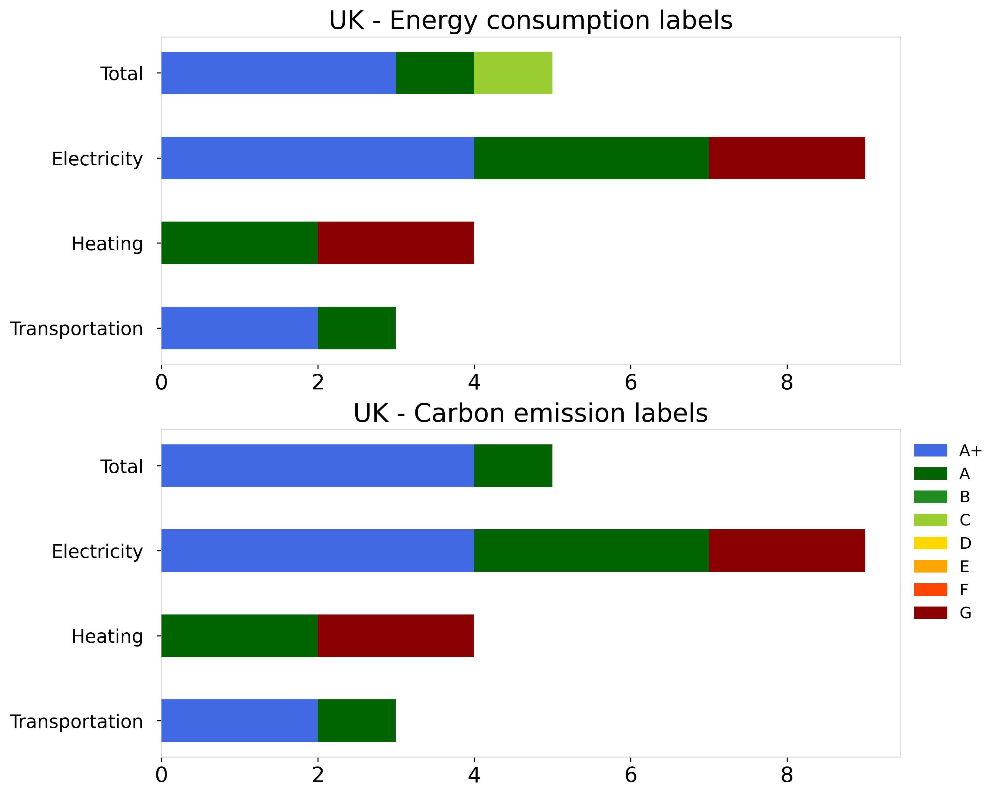

In [200]:
## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(2,1, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']



    
for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_england[sector][df_england[sector, 'energyExpended_label'].notna()] )
      average_days=df_england[sector][df_england[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_england[sector][(df_england[sector]['energyExpended_label'] == label)
                                            & (df_england[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_england[df_england['electricity', 'energyExpended_label'].notna() &
                       df_england['heating', 'energyExpended_label'].notna() &
                       df_england['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[0].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot



   if sector != 'Total' :

      count_e= len(df_england[sector][df_england[sector, 'carbonEmission_label'].notna()] )
      average_days=df_england[sector][df_england[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_england[sector][(df_england[sector]['carbonEmission_label'] == label)
                                            & (df_england[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_england[df_england['electricity', 'carbonEmission_label'].notna() &
                       df_england['heating', 'carbonEmission_label'].notna() &
                       df_england['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[1].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot

    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)


axs[0].set_title('UK - Energy consumption labels')
axs[1].set_title('UK - Carbon emission labels')






electricity : number of data:  2  avergae days tracked:  259.0
heating : number of data:  1  avergae days tracked:  92.0
transportation : number of data:  0  avergae days tracked:  nan
electricity : number of data:  4  avergae days tracked:  339.5
heating : number of data:  2  avergae days tracked:  60.5
transportation : number of data:  4  avergae days tracked:  93.75
electricity : number of data:  3  avergae days tracked:  60.333333333333336
heating : number of data:  3  avergae days tracked:  22.0
transportation : number of data:  3  avergae days tracked:  39.666666666666664


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.3, 0.92, 'Energy consumption labels by year')

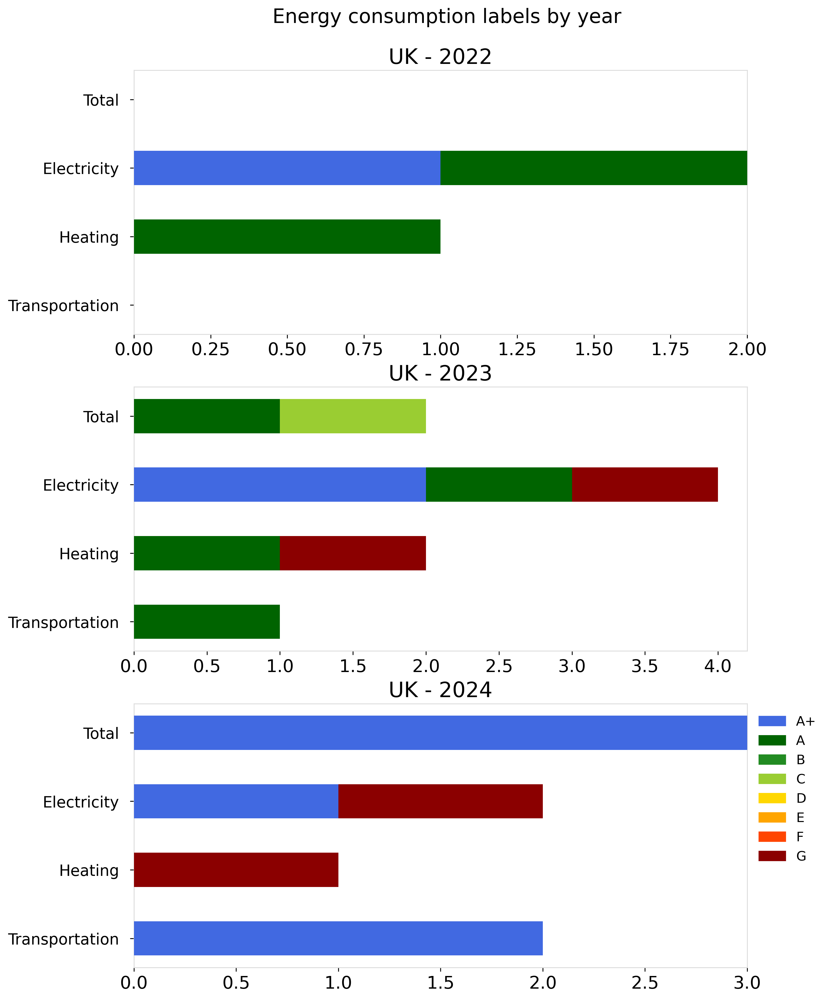

In [201]:

## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']


for k, year in enumerate([2022,2023,2024]):
 df_england_year= df_england.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_england_year[sector][df_england_year[sector, 'energyExpended_label'].notna()] )
      average_days=df_england_year[sector][df_england_year[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_england_year[sector][(df_england_year[sector]['energyExpended_label'] == label)
                                            & (df_england_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_england_year[df_england_year['electricity', 'energyExpended_label'].notna() &
                       df_england_year['heating', 'energyExpended_label'].notna() &
                       df_england_year['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('UK - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)

fig.text(0.3, 0.92, 'Energy consumption labels by year', fontsize=18)




electricity : number of data:  2  avergae days tracked:  259.0
heating : number of data:  1  avergae days tracked:  92.0
transportation : number of data:  0  avergae days tracked:  nan
electricity : number of data:  4  avergae days tracked:  339.5
heating : number of data:  2  avergae days tracked:  60.5
transportation : number of data:  4  avergae days tracked:  93.75
electricity : number of data:  3  avergae days tracked:  60.333333333333336
heating : number of data:  3  avergae days tracked:  22.0
transportation : number of data:  3  avergae days tracked:  39.666666666666664


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:49: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.3, 0.93, 'Carbon emission labels by year')

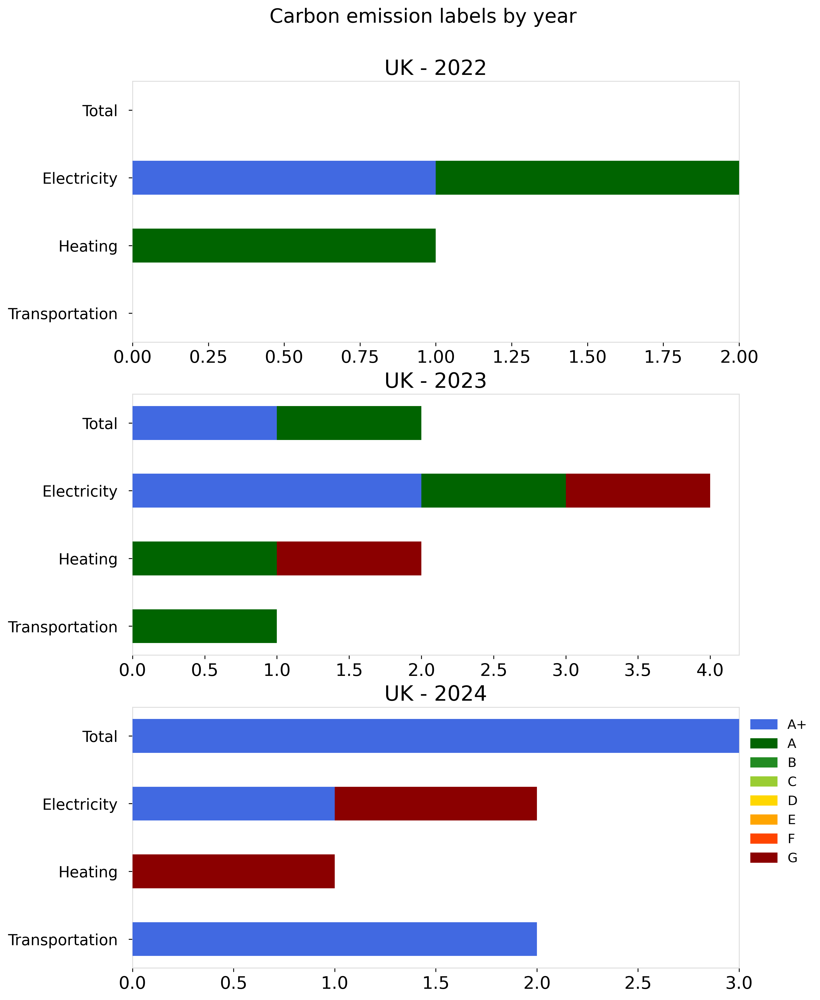

In [202]:


## carbon labels

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']



for k, year in enumerate([2022,2023,2024]):
 df_england_year= df_england.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_england_year[sector][df_england_year[sector, 'carbonEmission_label'].notna()] )
      average_days=df_england_year[sector][df_england_year[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_england_year[sector][(df_england_year[sector]['carbonEmission_label'] == label)
                                            & (df_england_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_england_year[df_england_year['electricity', 'carbonEmission_label'].notna() &
                       df_england_year['heating', 'carbonEmission_label'].notna() &
                       df_england_year['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('UK - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)

fig.text(0.3, 0.93, 'Carbon emission labels by year', fontsize=18)

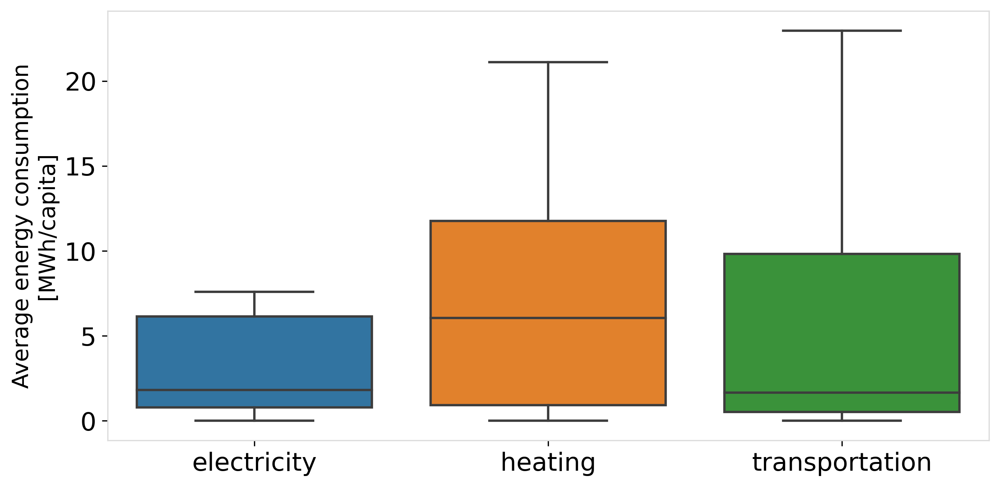

In [203]:
import seaborn as sns
# Import Data


england_average_energy={'electricity': 1675.94   ,
                  'heating': 4871.76  , 
                  'transportation': 6524,  } #elec, heat, transport kWh/capita

england_average_emissions={'electricity':636.86  ,
                  'heating': 984.09 , 
                  'transportation': 1637,  }  #elec, heat, transport tonne/capita


temp=pd.DataFrame({'electricity': df_england.loc[:,('electricity','energyExpended_total')]*365/(
            df_england.loc[:,('electricity','consumptionDays_sum' )]) ,
                       'heating': df_england.loc[:,('heating','energyExpended_total')]*365/(
            df_england.loc[:,('heating','consumptionDays_sum' )]) ,
                       'transportation': df_england.loc[:,('transportation','energyExpended_total')]*365/(
            df_england.loc[:,('transportation','consumptionDays_sum')]) ,
                      })

for sector in temp.columns:
    temp[sector]=temp[sector].apply(lambda x : np.nan if x >10* england_average_energy[sector] else x) 
         
# Draw Plot
plt.figure(figsize=(10,5), )
box_plot=sns.boxplot( data=temp/1e3, notch=False)
box_plot.set_ylabel('Average energy consumption\n[MWh/capita]', size=14)

# Decoration
#plt.title('Box plot for energy consumption', fontsize=22)
#plt.ylim(10, 40)
plt.show()


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:130: UserWarning: FixedFormatter should only be used together with FixedLocator


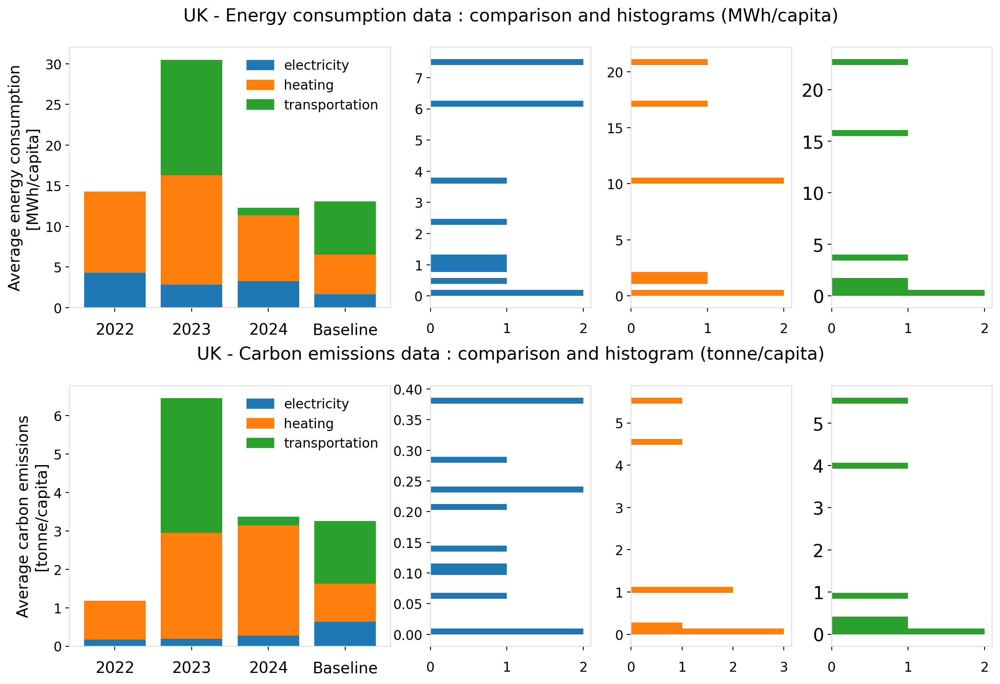

In [205]:

#axs[0,0].show()

norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
color_list=[cm.jet(norm(j),bytes=True) for j in np.arange(0.2,1,0.1) ]
new_colors=[tuple([i/255.0 for i in j]) for j in color_list]

new_colors=['royalblue','darkgreen','forestgreen','yellowgreen','gold','orange','orangered','darkred']


# Import Data

fig, axs = plt.subplots(2,4, figsize=(15,10), 
                        gridspec_kw={'width_ratios':[2,1,1,1]} ,
                        dpi=200) #, sharey=True)
fig.subplots_adjust(hspace=0.3)


index=np.arange(4)

for j,year in enumerate([2022, 2023, 2024]): 
   df = df_england.loc[year]
   temp_energy=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'energyExpended_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'energyExpended_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'energyExpended_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh


   temp_emissions=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'carbonEmission_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'carbonEmission_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'carbonEmission_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh




    
   # Draw Plot
   bottom=0
   bottom_1=0
   bottom_2=0
   bottom_3=0


   colors={'electricity':tab10_colors[0] ,  
        'heating': tab10_colors[1] , 
        'transportation': tab10_colors[2],  }

   
   for i , sector in enumerate(temp_energy.columns):
        ##exclude unusually high (10 times the everage) consumptions:    

       temp_energy[sector]=temp_energy[sector].apply(lambda x : np.nan if x >10* england_average_energy[sector]/1e3 else x) 
       temp_emissions[sector]=temp_emissions[sector].apply(lambda x : np.nan if x >10* england_average_emissions[sector]/1e3 else x)
         
       to_plot= temp_energy.drop([i for i in temp_energy.index if temp_energy.loc[i, sector] ==0 or
               math.isnan(temp_energy.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[0,0].bar(index[j], to_plot, bottom=bottom, color=colors[sector])
       if not to_plot is np.nan: bottom += to_plot
       
    
       to_plot= temp_emissions.drop([i for i in temp_emissions.index if temp_emissions.loc[i, sector] ==0 or
               math.isnan(temp_emissions.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[1,0].bar(index[j], to_plot, bottom=bottom_1, color=colors[sector])
       if not to_plot is np.nan: bottom_1 += to_plot
        
        
       axs[0,0].bar(index[3], england_average_energy[sector]/1e3,
               bottom=bottom_2, color=colors[sector])
       bottom_2 += england_average_energy[sector]/1e3 
        
       axs[1,0].bar(index[3], england_average_emissions[sector]/1e3,
               bottom=bottom_3, color=colors[sector])
       bottom_3 += england_average_emissions[sector]/1e3  
       
       temp=df_england.loc[:,(sector,'energyExpended_total' )]*365/(
            df_england.loc[:,(sector,'consumptionDays_sum' )]) 
       temp=temp.apply(lambda x : np.nan if x >10* england_average_energy[sector] else x)
    
       axs[0,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[0,i].tick_params(axis='y', labelsize=12,)
       axs[0,i+1].tick_params(axis='x', labelsize=12, pad=10,)

       temp=df_england.loc[:,(sector,'carbonEmission_total' )]*365/(
            df_england.loc[:,(sector,'consumptionDays_sum' )])
       temp=temp.apply(lambda x : np.nan if x >10* england_average_emissions[sector] else x)
        
       axs[1,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[1,i].tick_params(axis='y', labelsize=12,)
       axs[1,i+1].tick_params(axis='x', labelsize=12, pad=10,)



#axs[0,1].set_yticks(np.arange(0, 6.1, 3),fontsize=14)   
#axs[0,2].set_yticks(np.arange(0, 2.1, 1),fontsize=14)   
#axs[0,3].set_yticks(np.arange(0, 6.1, 3),fontsize=14)  


legend_manual=[]
for i,key in enumerate(temp_energy.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[0,0].legend(handles=legend_manual,loc='upper right', ncol=1,
           fontsize=12,frameon=False)      

legend_manual=[]
for i,key in enumerate(temp_emissions.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[1,0].legend(handles=legend_manual,loc='upper right', ncol=1,
           fontsize=12,frameon=False)      
    # Decoration


axs[0,1].set_title('UK - Energy consumption data : comparison and histograms (MWh/capita)\n', fontsize=16)
axs[1,1].set_title('UK - Carbon emissions data : comparison and histogram (tonne/capita)\n', fontsize=16)

axs[0,0].set_ylabel('Average energy consumption\n[MWh/capita]', size=14)
axs[1,0].set_ylabel('Average carbon emissions\n[tonne/capita]', size=14)

xlabels = [i for i in ['2022', '2023', '2024', 'Baseline']]    ##reverse order
for ax in  [axs[0,0], axs[1,0]]:
  ax.set_xticklabels(xlabels,fontsize=14, rotation=0,ha='center', rotation_mode='anchor')
  ax.set_xticks((np.arange(4)))    
  ax.tick_params(axis='x', labelsize=14, pad=10,)


In [232]:
## No year definition for consumptio?

##
import itertools


list_types_tr=[]
list_types_h=[]

for user, user_name in  enumerate(england_users):        
        for i in range(len(data[england_users[user]]['consumptions'])): 
         if data[england_users[user]]['consumptions'][i]['category'] == 'transportation':
    
           list_types_tr.append(data[england_users[user]]['consumptions'][i]['transportation']['transportationType'])
        
         if data[england_users[user]]['consumptions'][i]['category'] == 'heating':
    
           list_types_h.append(data[england_users[user]]['consumptions'][i]['heating']['heatingFuel'])
            


additions=['','-energyExpended', '-carbonEmissions']

list_tr= list(''.join(s) for s in itertools.product(list(set(list_types_tr)), additions)) 
list_h= list(''.join(s) for s in itertools.product(list(set(list_types_h)), additions)) 
list_el =list(''.join(s) for s in itertools.product(['default','homePhotovoltaics'], additions)) 

iterables = [
    ['electricity'],
    list_el]
index_0 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['heating'],
    list_h]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['transportation'],
    list_tr]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_0]+[list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

df_england_types= pd.DataFrame(index=[i for i in england_users], columns=index).fillna(0)


for user, user_name in  enumerate(england_users):
      if any(data[england_users[user]]['consumptions'])  :
         #print(user)  
         for i in range(len(data[england_users[user]]['consumptions'])):
            sector=data[england_users[user]]['consumptions'][i]['category'] 
            
            if data[england_users[user]]['consumptions'][i]['category'] == 'electricity':
                try: sector_type= data[england_users[user]]['consumptions'][i][sector]['electricitySource'] 
                except: sector_type= 'default' 

            if data[england_users[user]]['consumptions'][i]['category'] == 'transportation':
                sector_type= data[england_users[user]]['consumptions'][i][sector]['transportationType'] 
    
            if data[england_users[user]]['consumptions'][i]['category'] == 'heating':
                sector_type= data[england_users[user]]['consumptions'][i][sector]['heatingFuel'] 
                
            df_england_types.loc[england_users[user], (sector,sector_type) ]+=1
            try: df_england_types.loc[england_users[user], (sector, sector_type+'-energyExpended' ) ]+=(
                      data[england_users[user]]['consumptions'][i]['energyExpended'] )
            except: continue
            try: df_england_types.loc[england_users[user], (sector, sector_type+'-carbonEmissions' ) ]+=(
                      data[england_users[user]]['consumptions'][i]['carbonEmissions'] )    
            except: continue


In [233]:
color_list_= (plt.cm.Dark2.colors+plt.cm.Set1.colors+plt.cm.tab10.colors+plt.cm.Set2.colors)
color_list={'walking': color_list_[10] ,
 'dieselBus': color_list_[16] ,
 'fuelCar': color_list_[7],
 'bike': color_list_[0] ,
 'dieselPassengerTrain': color_list_[1] ,
 'electricCar': color_list_[25] ,
 'electricPassengerTrain': color_list_[5],
 'hybridElectricBus': color_list_[11],
 'electricScooter': color_list_[23],
 'alternativeFuelBus': color_list_[22],
  'metroTramOrUrbanLightTrain': color_list_[6]  ,
  'otherBus': color_list_[28] ,
  'electricBike': color_list_[4],
 'electricBus': color_list_[2],
 'highSpeedTrain': color_list_[12],
 'plane': color_list_[8],
    'motorcycle': color_list_[24], 
  'electricMotorcycle' : color_list_[26], 
  'highSpeedTrain': color_list_[14], 
  'hybridCar' :  color_list_[27],      
           }

color_list_h = {'electric':color_list_[0],
 'naturalGas': color_list_[8],
 'locallyProducedBiomass':color_list_[10],
 'biomass':color_list_[4],
 'geothermal':color_list_[1],
 'district':color_list_[2],
 'oil' :color_list_[7],
   'liquifiedPetroGas':color_list_[6],
  'solarThermal': color_list_[12],             
               }


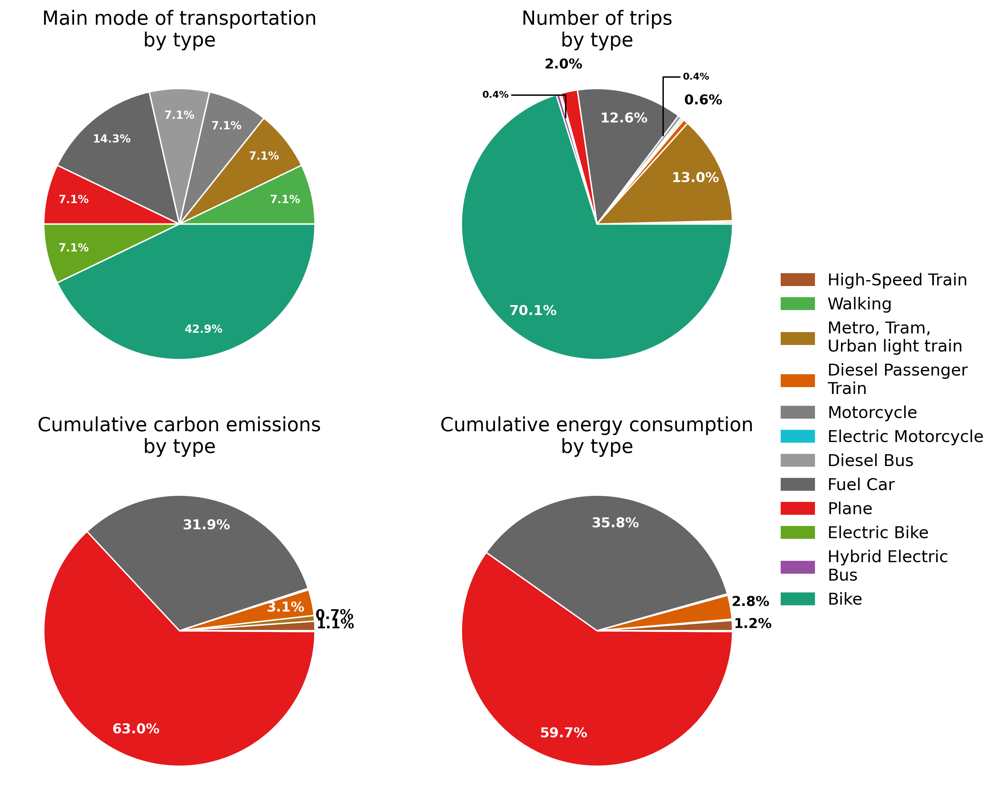

In [234]:

## TRansportation

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
#color_list= (plt.cm.Dark2.colors+plt.cm.Set1.colors)
bbox_props = dict(boxstyle="square,pad=0", fc="w", ec="w", lw=0.72)
arrowprops=dict(arrowstyle="-",connectionstyle="angle,angleA=0,angleB=90")
kw = dict(xycoords='data',textcoords='data',
          arrowprops=arrowprops, bbox=bbox_props, zorder=1)



temp=df_england_types['transportation']
to_drop= [i for i in df_england_types['transportation'].index if
                                      df_england_types.loc[i, 'transportation'].sum()==0 and 
                                  df_england_types.loc[i,('transportation' ,'walking')] == 0 ]
df_england_types['transportation','main_type']= temp.loc[:, [i for i in temp if '-' not in i]].idxmax(axis=1)

                                                         

tr_list=[i for i in df_england_types['transportation'].columns if df_england_types['transportation'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_england_types['transportation','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}



labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()

r=1
my_pie, texts, pct_txts = axs[0,0].pie(sizes, radius=r, labels=None , colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts] 

axs[0,0].set_title('Main mode of transportation\nby type', fontsize=14)
plt.setp(pct_txts, size=8, weight="bold", zorder=3)
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.2: # don't show very small percentages
        t.set_alpha(0)
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt))          
        

tr_dict = {i:df_england_types['transportation'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=None  ,radius=r, colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts] 

axs[0,1].set_title('Number of trips\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.3: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.6*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
    elif float(text.strip('%')) < 0.5: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        #print(xt, yt)
        if xt>0:
         axs[0,1].annotate(text, xy=(x,y), xytext=(xt-0.1, yt-0.2), size=7, weight="bold",**kw )
        else:
         axs[0,1].annotate(text, xy=(x,y), xytext=(xt-0.5, yt-0.6), size=7, weight="bold",**kw )
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_england_types['transportation'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=None , radius=r,colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts] 
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.3: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.6*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.5: # customised
        t.set_text(text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.4*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("w")
        t.set_alpha(0)
        t.set_position((xt,yt))  
        axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 2*yt), size=7, weight="bold",**kw )

    elif float(text.strip('%')) < 3: # customised
        t.set_text(text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.15*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_england_types['transportation'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
explode = (0, 0, 0.01, 0, 0, 0, 0, 0, 0, 0) 

my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=None , radius=r,colors=[color_list[key] for key in labels], #explode=explode,
                wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts] 
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
counter=0
for t in (pct_txts):
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.3: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.4: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        axs[1,1].annotate(text, xy=(x,y-0.02), xytext=(xt-0.1, yt*6-1.1), size=7, weight="bold",**kw )

    elif float(text.strip('%')) < 4: # customised
        t#.set_text(u"\u2248"+text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.15*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 
  

legend_manual=[]
nice_names={'walking': 'Walking',
 'dieselBus': 'Diesel Bus',
 'fuelCar': 'Fuel Car',
 'bike': 'Bike',
 'dieselPassengerTrain': 'Diesel Passenger\nTrain',
 'electricCar': 'Electric Car',
 'electricPassengerTrain':'Electric Passenger\nTrain',
 'hybridElectricBus':'Hybrid Electric\nBus',
 'electricScooter':'Electric Scooter',
 'alternativeFuelBus':'Alternative Fuel\nBus' ,
 'metroTramOrUrbanLightTrain': 'Metro, Tram,\nUrban light train',
 'hybridCar':'Hybrid Car',
 'otherBus':'Other Bus',
 'electricBus': 'Electric Bus',
 'electricBike': 'Electric Bike',
 'plane':'Plane',
  'motorcycle':'Motorcycle',
  'electricMotorcycle' : 'Electric Motorcycle',
   'highSpeedTrain':'High-Speed Train'        }
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[key], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 




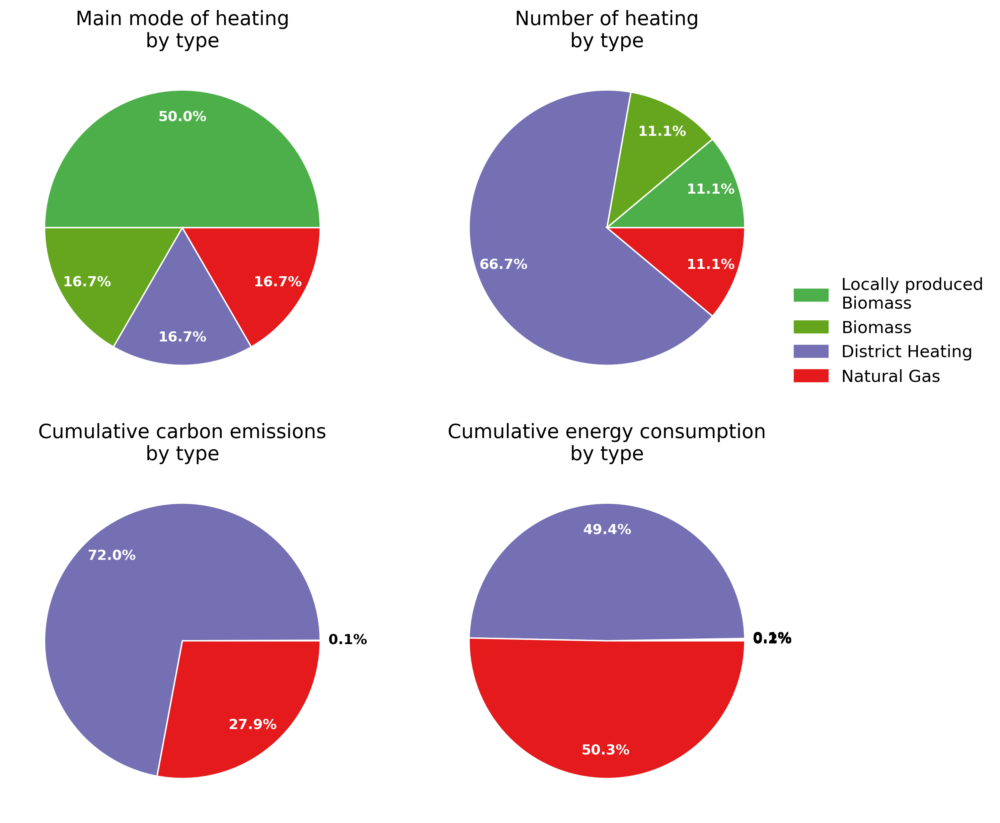

In [209]:
## heating

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']


color_list= (plt.cm.Dark2.colors+plt.cm.Set3.colors)

r=1
temp=df_england_types['heating']
to_drop= [i for i in df_england_types['heating'].index if
                                      df_england_types.loc[i, 'heating'].sum()==0]

df_england_types['heating','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]

                                                         
tr_list=[i for i in df_england_types['heating'].columns if df_england_types['heating'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_england_types['heating','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()

my_pie, texts, pct_txts = axs[0,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,0].set_title('Main mode of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.0: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        if yt>-0.5:
         axs[0,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 2*yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[0,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt), size=7, weight="bold",**kw )    
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_england_types['heating'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[0,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,1].set_title('Number of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_england_types['heating'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.1 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.0: 
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        if yt>-0.5:
         axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 2*yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt), size=7, weight="bold",**kw )      
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_england_types['heating'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.0 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.0: 
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        print(xt, yt)
        if yt>0:
         axs[1,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[1,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt-0.1), size=7, weight="bold",**kw )      
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

legend_manual=[]
nice_names={'electric':'Electric',
 'naturalGas': 'Natural Gas',
 'locallyProducedBiomass':'Locally produced\nBiomass',
 'biomass':'Biomass',
 'geothermal':'Geothermal',
 'district':'District Heating',
 'oil' :'Oil',
   'liquifiedPetroGas':'Liquified Petrogas' ,}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list_h[key], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 


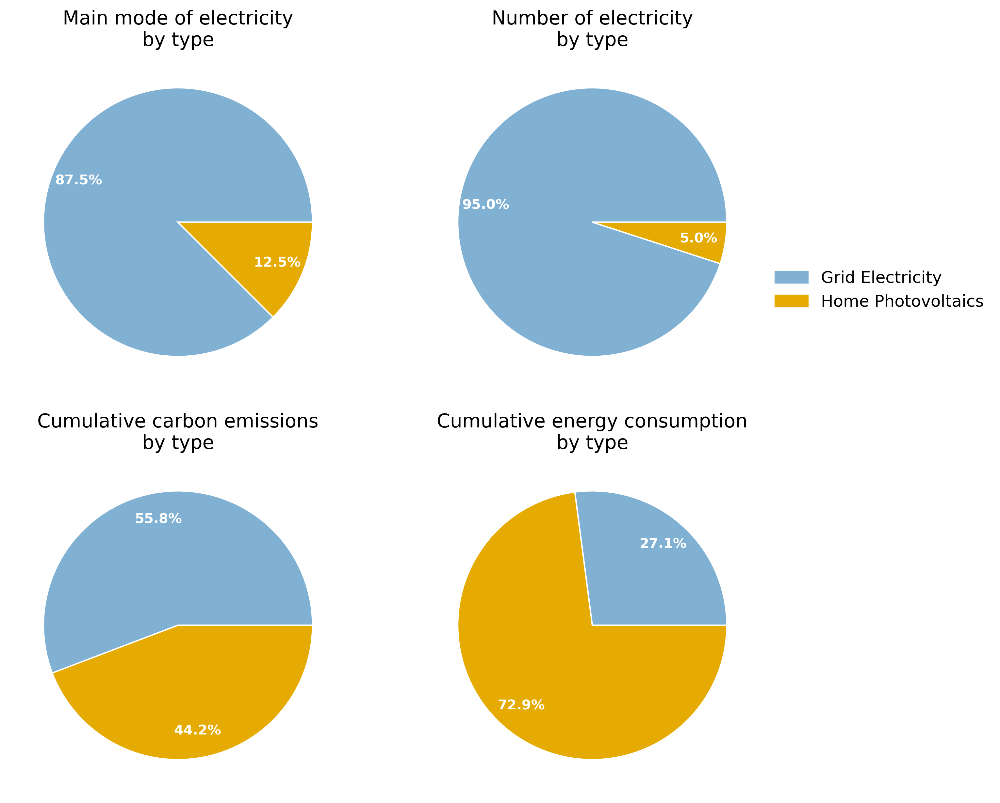

In [210]:
## electricity

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']

color_list= ((0.5019607843137255, 0.6941176470588235, 0.8274509803921568),
 #(0.4588235294117647, 0.4392156862745098, 0.7019607843137254),
 (0.9019607843137255, 0.6705882352941176, 0.00784313725490196))

temp=df_england_types['electricity']
to_drop= [i for i in df_england_types['electricity'].index if
                                      df_england_types.loc[i, 'electricity'].sum()==0]

df_england_types['electricity','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]

                                                         
tr_list=[i for i in df_england_types['electricity'].columns if df_england_types['electricity'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_england_types['electricity','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,0].set_title('Main mode of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_england_types['electricity'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,1].set_title('Number of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


tr_dict = {i:df_england_types['electricity'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_england_types['electricity'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


legend_manual=[]
nice_names={'default':'Grid Electricity','homePhotovoltaics': 'Home Photovoltaics'}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[i], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 


# OTHER EU COUNTRIES

In [235]:
## other
def Average(lst): 
    return sum(lst) / len(lst) 

other_users = [i for i in list(data.keys()) if data[i]['country']=='sPXh74wjZf14Jtmkaas6']
len(other_users)


iterables = [
    ['Total'],
    ['carbonEmission_total', 'carbonEmission_label',
    'energyExpended_total', 'energyExpended_label' ,
    ]]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['electricity' , 'heating' ,'transportation'],
    ['carbonEmission_total','carbonEmission_percentage', 'carbonEmission_label', 
    'energyExpended_total','energyExpended_percentage', 'energyExpended_label' ,
    'consumptionDays','consumptionDays_sum', 'householdSize',]]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

iterables = [
    [2022, 2023, 2024],
    [i for i in other_users]]

df_other = pd.DataFrame(index=pd.MultiIndex.from_product(iterables, names=["Year", "User"]), columns=index)
#df_other_2024 = pd.DataFrame(index=[i for i in other_users], columns=index)

for category in  ['electricity' , 'heating' ,'transportation']:  
  for user, user_name in  enumerate(other_users):
    years= len(data[other_users[user]]['consumptionSummaries']) 
        
    if years>0 : 
      for year in range(years):  
         year_name= data[other_users[user]]['consumptionSummaries'][year]['year'] 
         #print(user)
         df_other.loc[(year_name,user_name),('Total','carbonEmission_total')]=data[other_users[user]]['consumptionSummaries'][year]['carbonEmission']['total']
         df_other.loc[(year_name,user_name),('Total','energyExpended_total')]=data[other_users[user]]['consumptionSummaries'][year]['energyExpended']['total']
         try : df_other.loc[(year_name,user_name),('Total','carbonEmission_label')]=data[other_users[user]]['consumptionSummaries'][year]['carbonEmission']['label']
         except:
            continue
         try: df_other.loc[(year_name,user_name),('Total','energyExpended_label')]=data[other_users[user]]['consumptionSummaries'][year]['energyExpended']['label']   
         except:
            continue
            
         temp=data[other_users[user]]['consumptionSummaries'][year]['categories']    
         for i in range(len(temp)):
           if temp[i]['category']==category : #print(temp[i])        
              #print(temp[i]) 
              df_other.loc[ (year_name,user_name),(category,'carbonEmission_total')] = temp[i]['carbonEmission']['total']  
              df_other.loc[ (year_name,user_name),(category,'carbonEmission_percentage')] = temp[i]['carbonEmission']['percentage']
              try  :
                  df_other.loc[(year_name,user_name),(category, 'carbonEmission_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue  
                    
              df_other.loc[(year_name,user_name),(category, 'energyExpended_total')] = temp[i]['energyExpended']['total']               
              df_other.loc[(year_name,user_name),(category, 'energyExpended_percentage')] = temp[i]['energyExpended']['percentage']
              try :
                  df_other.loc[(year_name,user_name),(category, 'energyExpended_label')] = temp[i]['carbonEmission']['label']
              except :
                 continue
                    
              df_other.loc[ (year_name,user_name),(category, 'consumptionDays')] = len(temp[i]['consumptionDays'])
              df_other.loc[ (year_name,user_name),(category,'consumptionDays_sum')] = (
                   sum(temp[i]['consumptionDays'].values()) if  
                  sum(temp[i]['consumptionDays'].values())!=0 else 1)  ##avoid divisio by zero

            
            
              df_other.loc[ (year_name,user_name),(category, 'householdSize')] = 1
                
              if category == 'transportation':
                 try:  

                   householdSize= Average([data[other_users[user]]['consumptions'][i]['transportation']['privateVehicleOccupancy']
                             for i in range(len(data[other_users[user]]['consumptions'])) if
                            'transportation' in data[other_users[user]]['consumptions'][i].keys()
                            and 'privateVehicleOccupancy' in 
                            data[other_users[user]]['consumptions'][i]['transportation'].keys()] )
                   df_other.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize

                 except:
                      continue  
                
              if   category =='heating' or category =='electricity' :
                 #print(other_users[user])
                 try:  
                   householdSize=  Average([data[other_users[user]]['consumptions'][i]['electricity']['householdSize']
                                            for i in range(len(data[other_users[user]]['consumptions'])) if
                       'electricity' in data[other_users[user]]['consumptions'][i].keys()]) 
                   df_other.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                   

                 except:  
                  try:      
                        householdSize=  Average([data[other_users[user]]['consumptions'][i]['heating']['householdSize']
                                            for i in range(len(data[other_users[user]]['consumptions'])) if
                           'heating' in data[other_users[user]]['consumptions'][i].keys()]) 
                        df_other.loc[ (year_name,user_name),(category, 'householdSize')] = householdSize
                       

                  except:
                      continue  


                 



electricity : number of data:  22  avergae days tracked:  128.8181818181818
electricity : number of data:  22  avergae days tracked:  128.8181818181818
heating : number of data:  15  avergae days tracked:  131.26666666666668
heating : number of data:  15  avergae days tracked:  131.26666666666668
transportation : number of data:  18  avergae days tracked:  39.888888888888886
transportation : number of data:  18  avergae days tracked:  39.888888888888886


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:74: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.5, 1.0, 'other EU countries - Carbon emission labels')

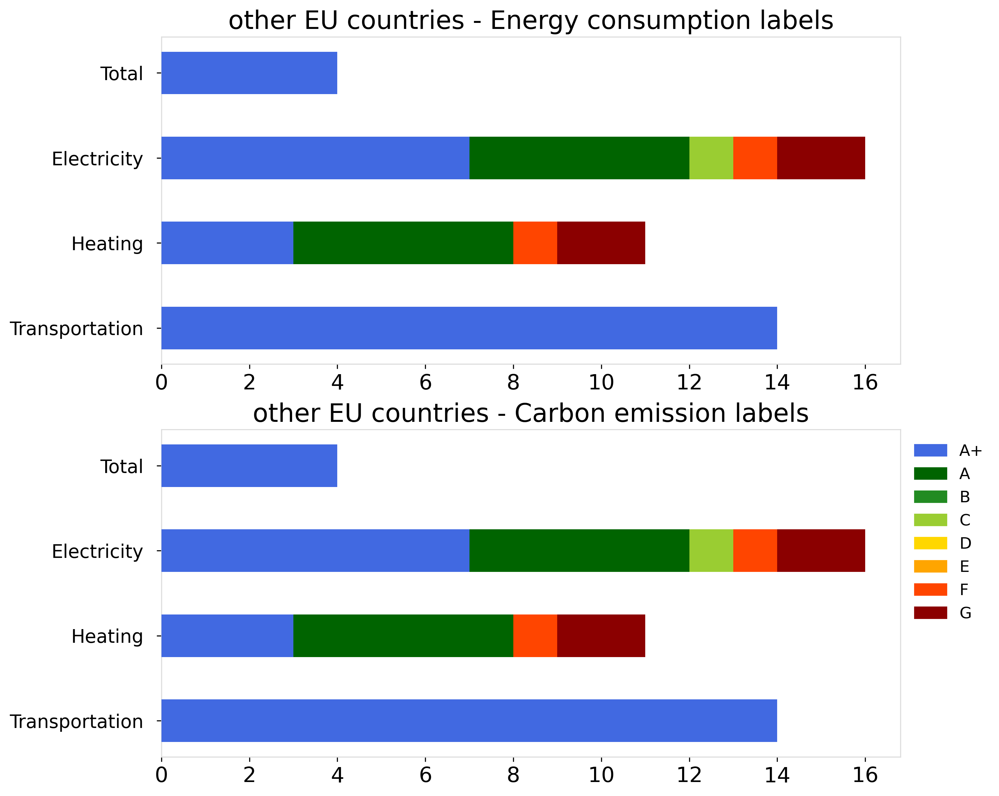

In [236]:


## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(2,1, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']



    
for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_other[sector][df_other[sector, 'energyExpended_label'].notna()] )
      average_days=df_other[sector][df_other[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_other[sector][(df_other[sector]['energyExpended_label'] == label)
                                            & (df_other[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_other[df_other['electricity', 'energyExpended_label'].notna() &
                       df_other['heating', 'energyExpended_label'].notna() &
                       df_other['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[0].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot



   if sector != 'Total' :

      count_e= len(df_other[sector][df_other[sector, 'carbonEmission_label'].notna()] )
      average_days=df_other[sector][df_other[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_other[sector][(df_other[sector]['carbonEmission_label'] == label)
                                            & (df_other[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_other[df_other['electricity', 'carbonEmission_label'].notna() &
                       df_other['heating', 'carbonEmission_label'].notna() &
                       df_other['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[1].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot

    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)


axs[0].set_title('other EU countries - Energy consumption labels')
axs[1].set_title('other EU countries - Carbon emission labels')



electricity : number of data:  3  avergae days tracked:  274.0
heating : number of data:  2  avergae days tracked:  230.0
transportation : number of data:  0  avergae days tracked:  nan
electricity : number of data:  11  avergae days tracked:  106.63636363636364
heating : number of data:  6  avergae days tracked:  115.33333333333333
transportation : number of data:  10  avergae days tracked:  34.6
electricity : number of data:  6  avergae days tracked:  32.833333333333336
heating : number of data:  5  avergae days tracked:  34.6
transportation : number of data:  8  avergae days tracked:  46.5


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.3, 0.93, 'Energy consumption labels by year')

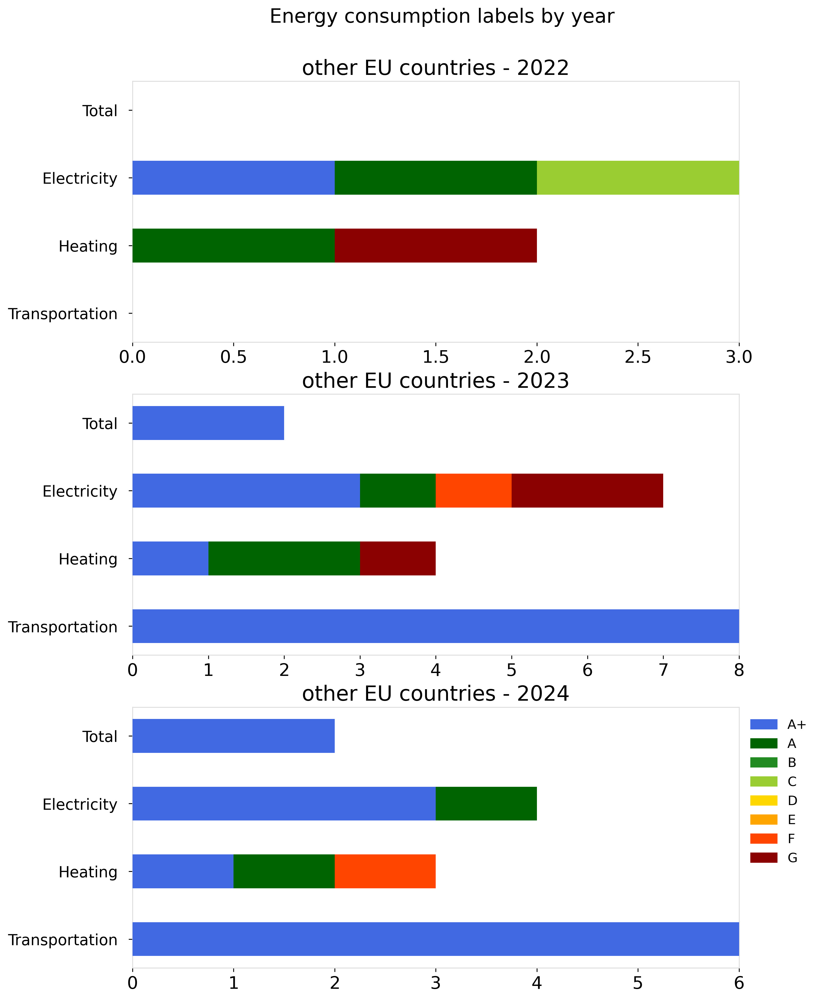

In [237]:


## enery labels
plt.rcParams['figure.dpi'] = 300
plt.rc('font',size=16)

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']


for k, year in enumerate([2022,2023,2024]):
 df_other_year= df_other.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_other_year[sector][df_other_year[sector, 'energyExpended_label'].notna()] )
      average_days=df_other_year[sector][df_other_year[sector, 'energyExpended_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_other_year[sector][(df_other_year[sector]['energyExpended_label'] == label)
                                            & (df_other_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_other_year[df_other_year['electricity', 'energyExpended_label'].notna() &
                       df_other_year['heating', 'energyExpended_label'].notna() &
                       df_other_year['transportation', 'energyExpended_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['energyExpended_label'] == label)])  
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('other EU countries - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)

fig.text(0.3, 0.93, 'Energy consumption labels by year', fontsize=18)


electricity : number of data:  3  avergae days tracked:  274.0
heating : number of data:  2  avergae days tracked:  230.0
transportation : number of data:  0  avergae days tracked:  nan
electricity : number of data:  11  avergae days tracked:  106.63636363636364
heating : number of data:  6  avergae days tracked:  115.33333333333333
transportation : number of data:  10  avergae days tracked:  34.6
electricity : number of data:  6  avergae days tracked:  32.833333333333336
heating : number of data:  5  avergae days tracked:  34.6
transportation : number of data:  8  avergae days tracked:  46.5


/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:49: UserWarning: FixedFormatter should only be used together with FixedLocator


Text(0.3, 0.93, 'Carbon emission labels by year')

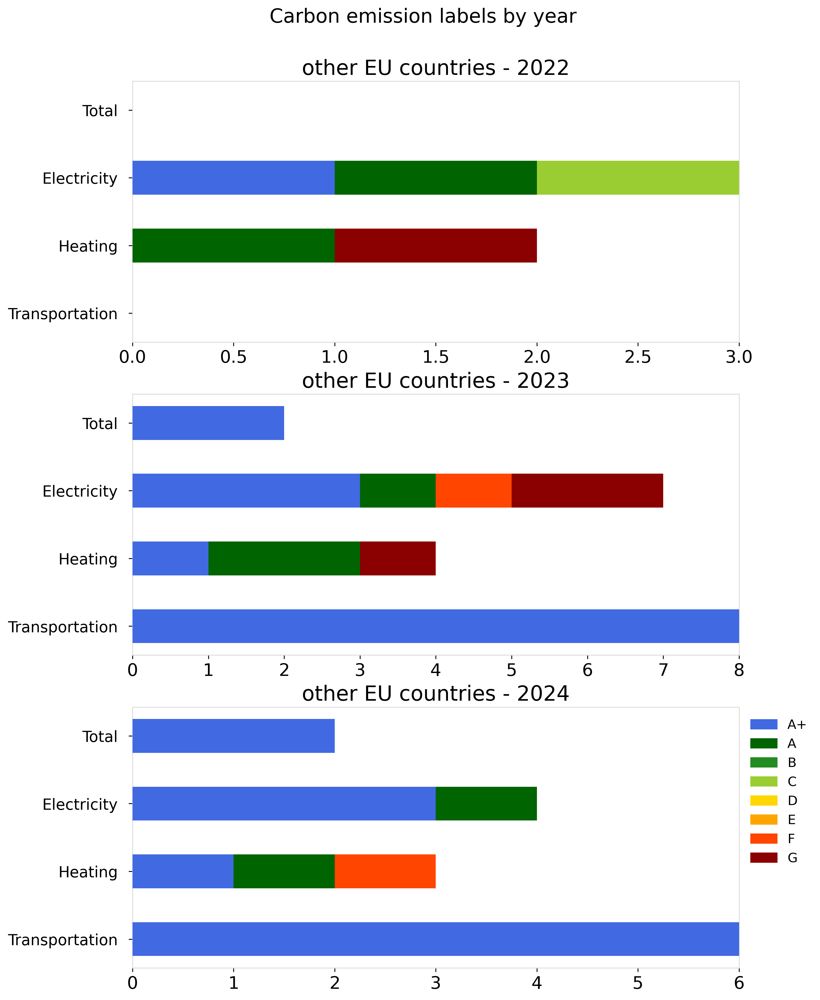

In [238]:

## carbon labels

fig, axs = plt.subplots(3,1, figsize=(10,15)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
labels=['A+','A','B','C','D','E','F','G']



for k, year in enumerate([2022,2023,2024]):
 df_other_year= df_other.loc[year] 
    
 for j, sector in enumerate(sectors): 
   if sector != 'Total' :

      count_e= len(df_other_year[sector][df_other_year[sector, 'carbonEmission_label'].notna()] )
      average_days=df_other_year[sector][df_other_year[sector, 'carbonEmission_label'].notna()]['consumptionDays_sum'].mean()
      print(sector,':' , 'number of data: ', count_e, ' avergae days tracked: ' , average_days)
    
   bottom= 0
   for i, label in enumerate(labels):
       if sector != 'Total' :
            to_plot =len(df_other_year[sector][(df_other_year[sector]['carbonEmission_label'] == label)
                                            & (df_other_year[sector]['consumptionDays_sum'] > 5)]) ##filter out very short-time users
       else  :
            temp= df_other_year[df_other_year['electricity', 'carbonEmission_label'].notna() &
                       df_other_year['heating', 'carbonEmission_label'].notna() &
                       df_other_year['transportation', 'carbonEmission_label'].notna()]
            to_plot =len(temp[sector][(temp[sector]['carbonEmission_label'] == label)]) 
            
       axs[k].barh(index[3-j], to_plot
                    , bar_width, 
                    left=bottom,
                     color=new_colors[i], zorder=3)
       bottom+=to_plot
 axs[k].set_title('other EU countries - '+str(year))
    
legend_manual=[]
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=new_colors[i], label=key))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1),ncol=1,
           fontsize=12,frameon=False)   


ylabels = [i for i in ['Transportation', 'Heating', 'Electricity', 'Total' ]]    ##reverse order
for ax in axs.reshape(-1):
 ax.set_yticklabels(ylabels,fontsize=14, rotation=0,ha='right', rotation_mode='anchor')
 ax.set_yticks((np.arange(4)))    
 ax.tick_params(axis='y', labelsize=14, pad=10,)

fig.text(0.3, 0.93, 'Carbon emission labels by year', fontsize=18)


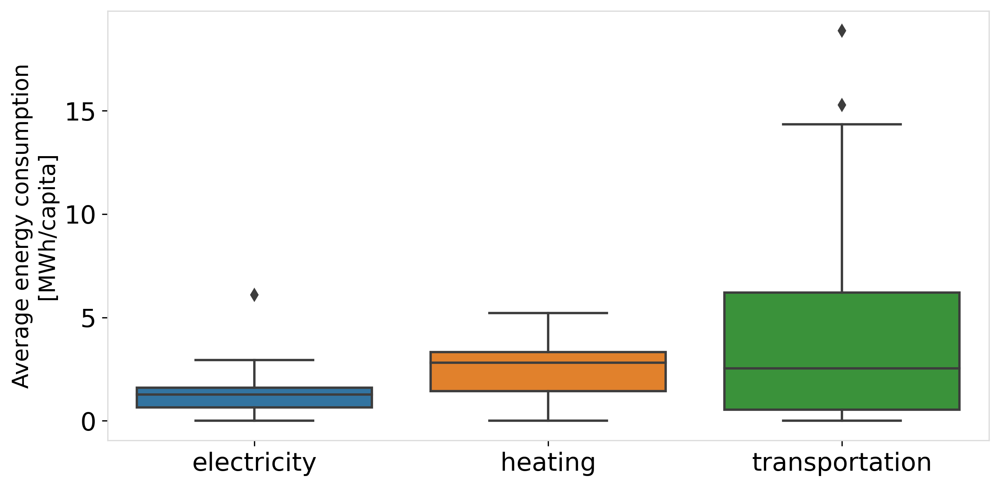

In [239]:
import seaborn as sns
# Import Data



other_average_energy={'electricity': 1608.14   ,
                  'heating': 4693.68 , 
                  'transportation': 5596,  } #elec, heat, transport kWh/capita

other_average_emissions={'electricity':509.78  ,
                  'heating': 948.12 , 
                  'transportation': 1368,  }  #elec, heat, transport tonne/capita


temp=pd.DataFrame({'electricity': df_other.loc[:,('electricity','energyExpended_total')]*365/(
            df_other.loc[:,('electricity','consumptionDays_sum' )]) ,
                       'heating': df_other.loc[:,('heating','energyExpended_total')]*365/(
            df_other.loc[:,('heating','consumptionDays_sum' )]) ,
                       'transportation': df_other.loc[:,('transportation','energyExpended_total')]*365/(
            df_other.loc[:,('transportation','consumptionDays_sum')]) ,
                      })

for sector in temp.columns:
    temp[sector]=temp[sector].apply(lambda x : np.nan if x >10* other_average_energy[sector] else x) 
         
# Draw Plot
plt.figure(figsize=(10,5), )
box_plot= sns.boxplot( data=temp/1e3, notch=False)
 
box_plot.set_ylabel('Average energy consumption\n[MWh/capita]', size=14)

# Decoration
#plt.title('Box plot for energy consumption', fontsize=22)
#plt.ylim(10, 40)
plt.show()



#axs[0,0].show()




/Users/au327049/opt/miniconda3/envs/pypsa-eur/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: FixedFormatter should only be used together with FixedLocator


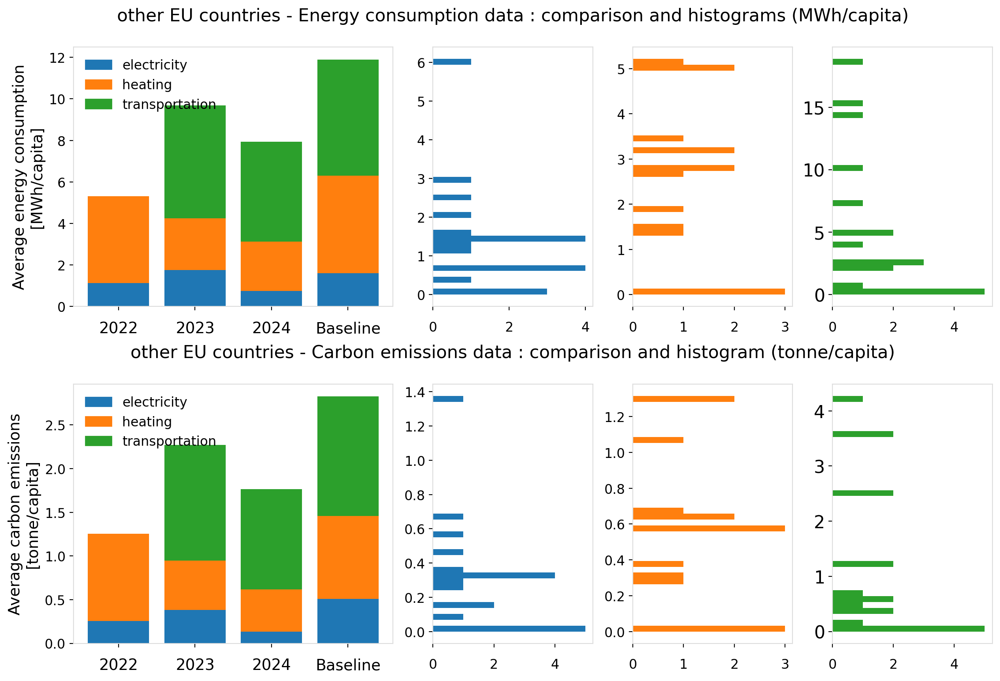

In [240]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
color_list=[cm.jet(norm(j),bytes=True) for j in np.arange(0.2,1,0.1) ]
new_colors=[tuple([i/255.0 for i in j]) for j in color_list]

new_colors=['royalblue','darkgreen','forestgreen','yellowgreen','gold','orange','orangered','darkred']


# Import Data

fig, axs = plt.subplots(2,4, figsize=(15,10), 
                        gridspec_kw={'width_ratios':[2,1,1,1]} ,
                        dpi=200) #, sharey=True)
fig.subplots_adjust(hspace=0.3)


index=np.arange(4)

for j,year in enumerate([2022, 2023, 2024]): 
   df = df_other.loc[year]
   temp_energy=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'energyExpended_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'energyExpended_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'energyExpended_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh


   temp_emissions=pd.DataFrame({   ##annualised values
    'electricity': df['electricity', 'carbonEmission_total']*365/(
                      df['electricity', 'consumptionDays_sum']),
     'heating': df['heating', 'carbonEmission_total']*365/(
                      df['heating', 'consumptionDays_sum']),
    'transportation': df['transportation', 'carbonEmission_total']*365/(
                      df['transportation', 'consumptionDays_sum']),
                      })/1e3  ##MWh




    
   # Draw Plot
   bottom=0
   bottom_1=0
   bottom_2=0
   bottom_3=0


   colors={'electricity':tab10_colors[0] ,  
        'heating': tab10_colors[1] , 
        'transportation': tab10_colors[2],  }

   
   for i , sector in enumerate(temp_energy.columns):
        ##exclude unusually high (10 times the everage) consumptions:    

       temp_energy[sector]=temp_energy[sector].apply(lambda x : np.nan if x >10* other_average_energy[sector]/1e3 else x) 
       temp_emissions[sector]=temp_emissions[sector].apply(lambda x : np.nan if x >10* other_average_emissions[sector]/1e3 else x)
         
       to_plot= temp_energy.drop([i for i in temp_energy.index if temp_energy.loc[i, sector] ==0 or
               math.isnan(temp_energy.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[0,0].bar(index[j], to_plot, bottom=bottom, color=colors[sector])
       if not to_plot is np.nan: bottom += to_plot
       
    
       to_plot= temp_emissions.drop([i for i in temp_emissions.index if temp_emissions.loc[i, sector] ==0 or
               math.isnan(temp_emissions.loc[i, sector])])[sector].mean()  ##not really needed for energy_expanded

       axs[1,0].bar(index[j], to_plot, bottom=bottom_1, color=colors[sector])
       if not to_plot is np.nan: bottom_1 += to_plot
        
        
       axs[0,0].bar(index[3], other_average_energy[sector]/1e3,
               bottom=bottom_2, color=colors[sector])
       bottom_2 += other_average_energy[sector]/1e3 
        
       axs[1,0].bar(index[3], other_average_emissions[sector]/1e3,
               bottom=bottom_3, color=colors[sector])
       bottom_3 += other_average_emissions[sector]/1e3  
       
       temp=df_other.loc[:,(sector,'energyExpended_total' )]*365/(
            df_other.loc[:,(sector,'consumptionDays_sum' )]) 
       temp=temp.apply(lambda x : np.nan if x >10* other_average_energy[sector] else x)
    
       axs[0,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[0,i].tick_params(axis='y', labelsize=12,)
       axs[0,i+1].tick_params(axis='x', labelsize=12, pad=10,)

       temp=df_other.loc[:,(sector,'carbonEmission_total' )]*365/(
            df_other.loc[:,(sector,'consumptionDays_sum' )])
       temp=temp.apply(lambda x : np.nan if x >10* other_average_emissions[sector] else x)
        
       axs[1,i+1].hist(temp/1e3, 40, histtype='stepfilled', orientation='horizontal', color=tab10_colors[i])
       axs[1,i].tick_params(axis='y', labelsize=12,)
       axs[1,i+1].tick_params(axis='x', labelsize=12, pad=10,)



#axs[0,1].set_yticks(np.arange(0, 6.1, 3),fontsize=14)   
#axs[0,2].set_yticks(np.arange(0, 2.1, 1),fontsize=14)   
#axs[0,3].set_yticks(np.arange(0, 6.1, 3),fontsize=14)  


legend_manual=[]
for i,key in enumerate(temp_energy.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[0,0].legend(handles=legend_manual,loc='upper left', ncol=1,
           fontsize=12,frameon=False)      

legend_manual=[]
for i,key in enumerate(temp_emissions.columns):
     legend_manual.append(mpatches.Patch(color=tab10_colors[i], label=key))
axs[1,0].legend(handles=legend_manual,loc='upper left', ncol=1,
           fontsize=12,frameon=False)      
    # Decoration


axs[0,1].set_title('other EU countries - Energy consumption data : comparison and histograms (MWh/capita)\n', fontsize=16)
axs[1,1].set_title('other EU countries - Carbon emissions data : comparison and histogram (tonne/capita)\n', fontsize=16)

axs[0,0].set_ylabel('Average energy consumption\n[MWh/capita]', size=14)
axs[1,0].set_ylabel('Average carbon emissions\n[tonne/capita]', size=14)

xlabels = [i for i in ['2022', '2023', '2024', 'Baseline']]    ##reverse order
for ax in  [axs[0,0], axs[1,0]]:
  ax.set_xticklabels(xlabels,fontsize=14, rotation=0,ha='center', rotation_mode='anchor')
  ax.set_xticks((np.arange(4)))    
  ax.tick_params(axis='x', labelsize=14, pad=10,)


In [246]:

## No year definition for consumptio?

##
import itertools


list_types_tr=[]
list_types_h=[]

for user, user_name in  enumerate(other_users):        
        for i in range(len(data[other_users[user]]['consumptions'])): 
         if data[other_users[user]]['consumptions'][i]['category'] == 'transportation':
    
           list_types_tr.append(data[other_users[user]]['consumptions'][i]['transportation']['transportationType'])
        
         if data[other_users[user]]['consumptions'][i]['category'] == 'heating':
    
           list_types_h.append(data[other_users[user]]['consumptions'][i]['heating']['heatingFuel'])
            


additions=['','-energyExpended', '-carbonEmissions']

list_tr= list(''.join(s) for s in itertools.product(list(set(list_types_tr)), additions)) 
list_h= list(''.join(s) for s in itertools.product(list(set(list_types_h)), additions)) 
list_el =list(''.join(s) for s in itertools.product(['default','homePhotovoltaics'], additions)) 

iterables = [
    ['electricity'],
    list_el]
index_0 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['heating'],
    list_h]
index_1 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

iterables = [
    ['transportation'],
    list_tr]
index_2 = pd.MultiIndex.from_product(iterables, names=["Sector", "parameter"])

df = pd.DataFrame(
    [list(i) for i in index_0]+[list(i) for i in index_1]+[list(i) for i in index_2],
    columns=["sector", "parameter"],
)
index= pd.MultiIndex.from_frame(df)

df_other_types= pd.DataFrame(index=[i for i in other_users], columns=index).fillna(0)


for user, user_name in  enumerate(other_users):
      if any(data[other_users[user]]['consumptions'])  :
         #print(user)  
         for i in range(len(data[other_users[user]]['consumptions'])):
            sector=data[other_users[user]]['consumptions'][i]['category'] 
            
            if data[other_users[user]]['consumptions'][i]['category'] == 'electricity':
                try: sector_type= data[other_users[user]]['consumptions'][i][sector]['electricitySource'] 
                except: sector_type= 'default' 

            if data[other_users[user]]['consumptions'][i]['category'] == 'transportation':
                sector_type= data[other_users[user]]['consumptions'][i][sector]['transportationType'] 
    
            if data[other_users[user]]['consumptions'][i]['category'] == 'heating':
                sector_type= data[other_users[user]]['consumptions'][i][sector]['heatingFuel'] 
                
            df_other_types.loc[other_users[user], (sector,sector_type) ]+=1
            try: df_other_types.loc[other_users[user], (sector, sector_type+'-energyExpended' ) ]+=(
                      data[other_users[user]]['consumptions'][i]['energyExpended'] )
            except: continue
            try: df_other_types.loc[other_users[user], (sector, sector_type+'-carbonEmissions' ) ]+=(
                      data[other_users[user]]['consumptions'][i]['carbonEmissions'] )    
            except: continue


In [247]:
color_list={'walking': color_list_[10] ,
 'dieselBus': color_list_[16] ,
 'fuelCar': color_list_[7],
 'bike': color_list_[0] ,
 'dieselPassengerTrain': color_list_[1] ,
 'electricCar': color_list_[25] ,
 'electricPassengerTrain': color_list_[5],
 'hybridElectricBus': color_list_[11],
 'electricScooter': color_list_[23],
 'alternativeFuelBus': color_list_[22],
  'metroTramOrUrbanLightTrain': color_list_[6]  ,
  'otherBus': color_list_[28] ,
  'electricBike': color_list_[4],
 'electricBus': color_list_[2],
 'highSpeedTrain': color_list_[12],
 'plane': color_list_[8],
    'motorcycle': color_list_[24], 
  'electricMotorcycle' : color_list_[26], 
  'highSpeedTrain': color_list_[14], 
  'hybridCar' :  color_list_[27],      
           }

color_list_h = {'electric':color_list_[0],
 'naturalGas': color_list_[8],
 'locallyProducedBiomass':color_list_[10],
 'biomass':color_list_[4],
 'geothermal':color_list_[1],
 'district':color_list_[2],
 'oil' :color_list_[7],
   'liquifiedPetroGas':color_list_[6],
  'solarThermal': color_list_[12],             
               }


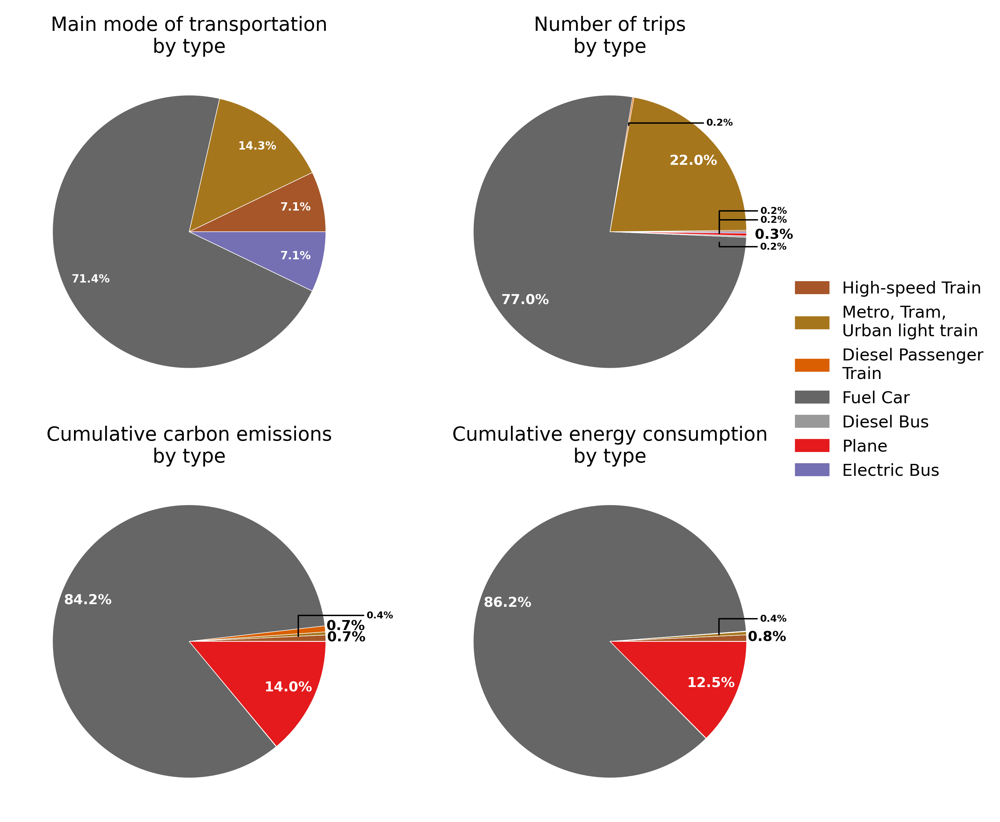

In [248]:

## Transportation

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']
#color_list= (plt.cm.Dark2.colors+plt.cm.Set3.colors)
bbox_props = dict(boxstyle="square,pad=0", fc="w", ec="w", lw=0.72)
arrowprops=dict(arrowstyle="-",connectionstyle="angle,angleA=0,angleB=90")
kw = dict(xycoords='data',textcoords='data',
          arrowprops=arrowprops, bbox=bbox_props, zorder=1)


temp=df_other_types['transportation']
to_drop= [i for i in df_other_types['transportation'].index if
                                      df_other_types.loc[i, 'transportation'].sum()==0 ]
                                  #  and  df_other_types.loc[i,('transportation' ,'walking')] == 0 
df_other_types['transportation','main_type']= temp.loc[:, [i for i in temp if '-' not in i]].idxmax(axis=1)                                                        
tr_list=[i for i in df_other_types['transportation'].columns if df_other_types['transportation'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_other_types['transportation','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()

r=1
my_pie, texts, pct_txts = axs[0,0].pie(sizes, radius=r, labels=tr_dict.keys() , colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 0.4},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]  
axs[0,0].set_title('Main mode of transportation\nby type', fontsize=14)
plt.setp(pct_txts, size=8, weight="bold", zorder=3)
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.1: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        #axs[0,0].annotate(text, xy=(x,y-0.0), xytext=(xt+0.05, yt+0.8), size=7, weight="bold",**kw )
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt))          
        

tr_dict = {i:df_other_types['transportation'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=tr_dict.keys()  ,radius=r, colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 0.4},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]  
axs[0,1].set_title('Number of trips\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.3 : # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        #print(xt, yt)
        if yt<0.2:
         axs[0,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 4*yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[0,1].annotate(text, xy=(x,y-0.03), xytext=(xt+0.5, yt-0.8), size=7, weight="bold",**kw )
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_other_types['transportation'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=tr_dict.keys() , radius=r,colors=[color_list[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 0.4},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]  
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.1: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.6*rad*np.cos(angle)+cx, 1.4*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.5: # customised
        t.set_text(text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.4*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("w")
        t.set_alpha(0)
        t.set_position((xt,yt))  
        axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt+0.1), size=7, weight="bold",**kw )

    elif float(text.strip('%')) < 3: # customised
        t.set_text(text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.15*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_other_types['transportation'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
explode = (0, 0, 0.01, 0, 0, 0, 0, 0, 0, 0) 

my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=tr_dict.keys() , radius=r,colors=[color_list[key] for key in labels], #explode=explode,
                wedgeprops={'edgecolor': 'white', 'linewidth': 0.4},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
[text.set_alpha(0) for text in texts]  
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
counter=0
for t in (pct_txts):
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.2: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.5 : # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        axs[1,1].annotate(text, xy=(x,y-0.02), xytext=(xt-0.1, yt+0.05), size=7, weight="bold",**kw )
    elif float(text.strip('%')) < 4: # customised
        t#.set_text(u"\u2248"+text)
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.15*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 
  

legend_manual=[]
nice_names={'walking': 'Walking',
 'dieselBus': 'Diesel Bus',
 'fuelCar': 'Fuel Car',
 'bike': 'Bike',
 'dieselPassengerTrain': 'Diesel Passenger\nTrain',
 'electricCar': 'Electric Car',
 'electricPassengerTrain':'Electric Passenger\nTrain',
 'hybridElectricBus':'Hybrid Electric\nBus',
 'electricScooter':'Electric Scooter',
 'alternativeFuelBus':'Alternative Fuel\nBus' ,
 'metroTramOrUrbanLightTrain': 'Metro, Tram,\nUrban light train',
 'hybridCar':'Hybrid Car',
 'otherBus':'Other Bus',
 'electricBus': 'Electric Bus',
 'electricBike': 'Electric Bike',
 'highSpeedTrain':'High-speed Train','plane':'Plane'}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[key], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 





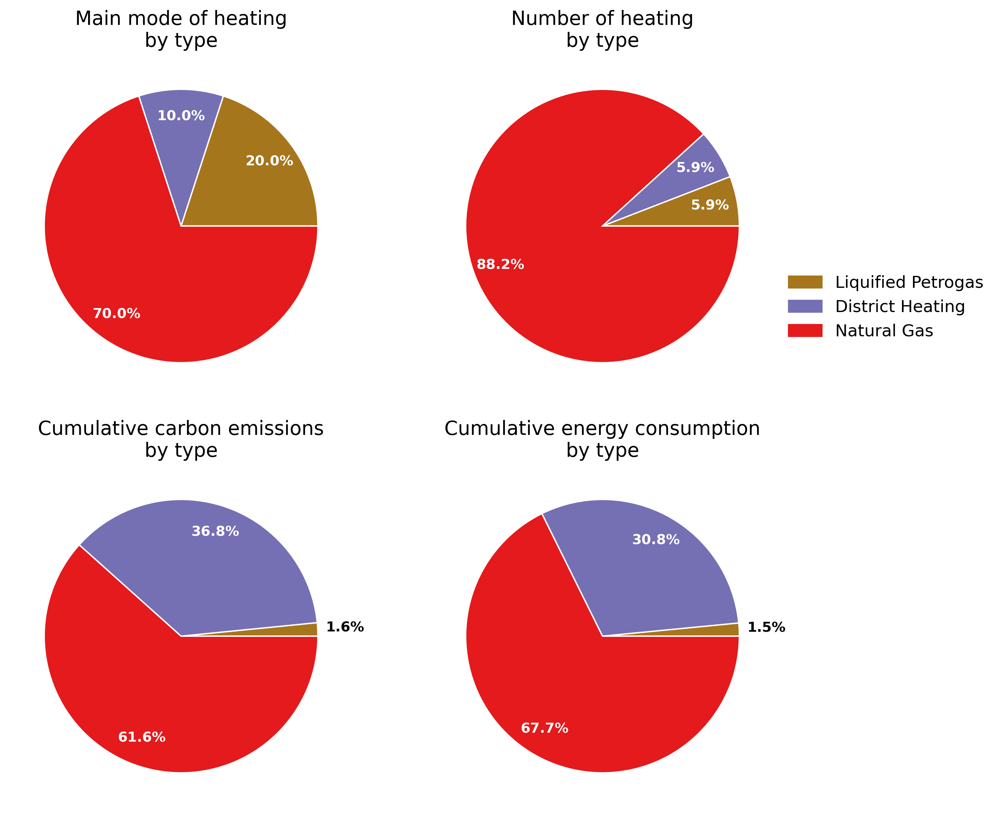

In [244]:

## heating

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']


#color_list= (plt.cm.Dark2.colors+plt.cm.Set3.colors)

r=1
temp=df_other_types['heating']
to_drop= [i for i in df_other_types['heating'].index if
                                      df_other_types.loc[i, 'heating'].sum()==0]
df_other_types['heating','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]                                                         
tr_list=[i for i in df_other_types['heating'].columns if df_other_types['heating'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_other_types['heating','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[0,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,0].set_title('Main mode of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 0.6: # don't show very small percentages
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        if yt>-0.5:
         axs[0,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 2*yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[0,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt), size=7, weight="bold",**kw )    
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_other_types['heating'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[0,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,1].set_title('Number of heating\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_other_types['heating'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,0].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.1 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.6: 
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        if yt>-0.5:
         axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, 2*yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[1,0].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt), size=7, weight="bold",**kw )      
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_other_types['heating'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts = axs[1,1].pie(sizes, labels=None , radius=r,colors=[color_list_h[key] for key in labels],
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) <0.1 : # don't show very small percentages
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
    elif float(text.strip('%')) < 0.3: 
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.6*rad*np.sin(angle)+cy
        t.set_color("white")
        t.set_alpha(0)
        t.set_position((xt,yt)) 
        print(xt, yt)
        if yt>0:
         axs[1,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt+0.1), size=7, weight="bold",**kw )
        else:
         axs[1,1].annotate(text, xy=(x,y-0.03), xytext=(xt-0.1, yt-0.1), size=7, weight="bold",**kw )      
    elif float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

legend_manual=[]
nice_names={'electric':'Electric',
 'naturalGas': 'Natural Gas',
 'locallyProducedBiomass':'Locally produced\nBiomass',
 'biomass':'Biomass',
 'geothermal':'Geothermal',
 'district':'District Heating',
 'oil' :'Oil',
   'liquifiedPetroGas':'Liquified Petrogas' ,}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list_h[key], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 


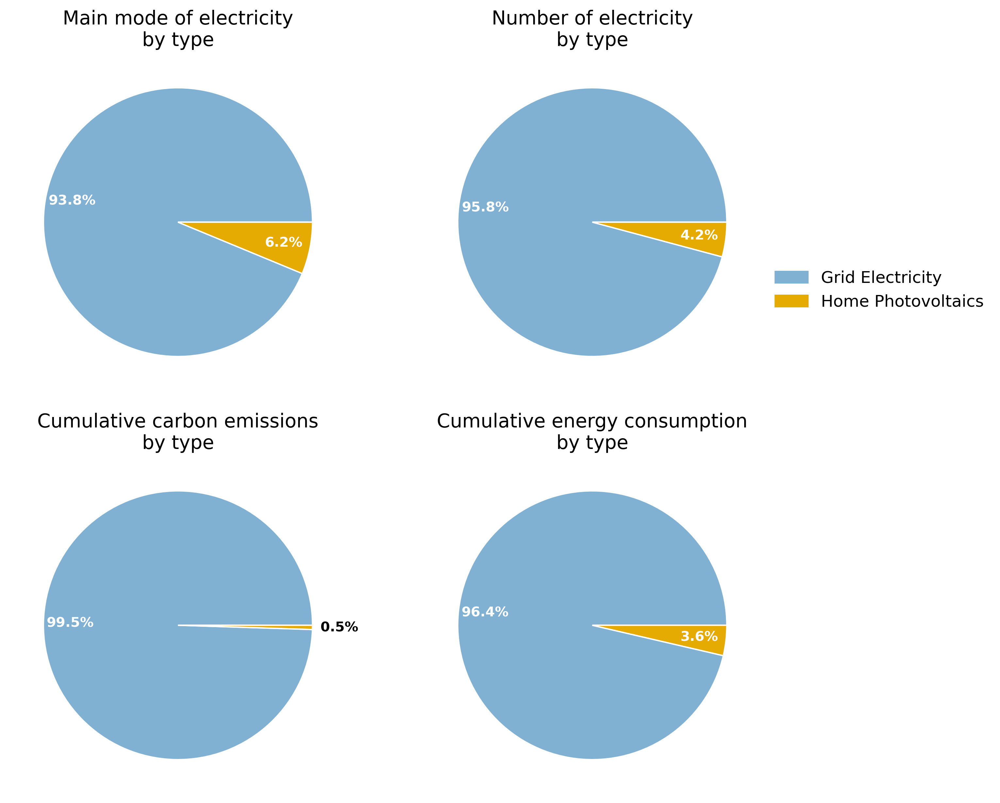

In [245]:

## electricity

fig, axs = plt.subplots(2,2, figsize=(10,10)) #, sharey=True)
bar_width=0.5
index=np.arange(8)
bottom=0
sectors= ['Total', 'electricity' , 'heating' ,'transportation']

color_list= ((0.5019607843137255, 0.6941176470588235, 0.8274509803921568),
 #(0.4588235294117647, 0.4392156862745098, 0.7019607843137254),
 (0.9019607843137255, 0.6705882352941176, 0.00784313725490196))

temp=df_other_types['electricity']
to_drop= [i for i in df_other_types['electricity'].index if
                                      df_other_types.loc[i, 'electricity'].sum()==0]
df_other_types['electricity','main_type']= [i.split('-')[0] for i in 
                                          (temp.loc[:, [i for i in temp if '-energy' in i]].idxmax(axis=1))]                                                     
tr_list=[i for i in df_other_types['electricity'].columns if df_other_types['electricity'][i].sum()!=0
            and '-' not in i and '_' not in i]                                                         
tr_list_main=list(df_other_types['electricity','main_type'].drop(to_drop).values)
tr_dict = {i: tr_list_main.count(i) for i in tr_list}

labels = [i for i in  tr_dict.keys()]
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)


axs[0,0].set_title('Main mode of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_other_types['electricity'][i].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[0,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[0,1].set_title('Number of electricity\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


tr_dict = {i:df_other_types['electricity'][i+'-carbonEmissions'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,0].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,0].set_title('Cumulative carbon emissions\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")
cx, cy = 0, 0 
for t in pct_txts:
    #print(t)
    x, y = t.get_position()
    text = t.get_text()
    if float(text.strip('%')) < 3: # customised
        angle = np.arctan2(y-cy, x-cx)
        xt, yt = 1.2*rad*np.cos(angle)+cx, 1.2*rad*np.sin(angle)+cy
        t.set_color("k")
        t.set_position((xt,yt)) 

tr_dict = {i:df_other_types['electricity'][i+'-energyExpended'].sum() for i in tr_list}
sizes = tr_dict.values()
my_pie, texts, pct_txts =axs[1,1].pie(sizes, labels=None , radius=r,colors=color_list,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1},
              textprops={'fontsize': 8, 'color':'white'},
             autopct='%1.1f%%', pctdistance=0.8)
axs[1,1].set_title('Cumulative energy consumption\nby type', fontsize=14)
plt.setp(pct_txts, size=10, weight="bold")


legend_manual=[]
nice_names={'default':'Grid Electricity','homePhotovoltaics': 'Home Photovoltaics'}
for i,key in enumerate(labels):
     legend_manual.append(mpatches.Patch(color=color_list[i], label=nice_names[key]))
plt.legend(handles=legend_manual,loc='upper left', bbox_to_anchor=(1, 1.6),ncol=1,
           fontsize=12,frameon=False) 

